In [13]:
# === Standard Library ===
import re
import ast
import itertools
from itertools import islice, combinations 
import random
import time
from urllib.parse import quote
from collections import defaultdict, deque
import joblib

# === Web Scraping ===
import requests
from bs4 import BeautifulSoup

# === Data Manipulation ===
import pandas as pd
import numpy as np

# === Visualization ===
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.colors import Normalize
import plotly.express as px
import plotly.graph_objects as go

# === Graphs & Community Detection ===
import networkx as nx
import community as community_louvain
from scipy.spatial import ConvexHull
from scipy.stats import pearsonr
from sklearn.metrics import adjusted_rand_score, normalized_mutual_info_score

# === Trend Analysis ===
from pytrends.request import TrendReq

# === Causal Inference (Tigramite) ===
from tigramite.data_processing import DataFrame as TigraDataFrame
from tigramite.pcmci import PCMCI
from tigramite.independence_tests.parcorr import ParCorr
from tigramite.independence_tests.gpdc import GPDC


from statsmodels.stats.multitest import multipletests
from matplotlib import cm
from matplotlib.colors import Normalize


def get_colors(n):
    return ["#%06x" % random.randint(0, 0xFFFFFF) for _ in range(n)]

In [14]:
table = pd.read_csv("Aesthetic network.csv")
table['related_aesthetics'] = table['related_aesthetics'].apply(ast.literal_eval)
table

,name,key,link,related_aesthetics,decade_of_origin,key_motifs,key_colours,key_values,related_media,earliest_origin,latest_origin
0,2 Tone,2_Tone,https://aesthetics.fandom.com/wiki/2_Tone,"[Mod, New_Wave, Northern_Soul, Punk, Reggae, R...",Late 1970s,"Checkerboard pattern, suits, pork pie hats, lo...",Black and white,"Anti-racism, racial unity, working-class pride...",NaN,1970.0,1970.0
1,2000s Modern Baroque,2000s_Modern_Baroque,https://aesthetics.fandom.com/wiki/2000s_Moder...,"[Baroque, Curly_Girly, McBling, Parisian_Girly...",2000s,"Ornate details, gilded accents, sumptuous fabr...","Black and gold, but also a broader range inclu...","Opulence, drama, a reinterpretation of traditi...",NaN,2000.0,2000.0
2,2000s Preppy,2000s_Preppy,https://aesthetics.fandom.com/wiki/2000s_Preppy,"[Barbiecore, Basic_Girl, Boujee, Bubblegum_Bit...",2000s,"Wealth, popularity, femininity, elitism","Light and bright colors, a lot of pink, black ...",NaN,"lueless, Gossip Girl",2000.0,2000.0
3,2000s Yoga Mom,2000s_Yoga_Mom,https://aesthetics.fandom.com/wiki/2000s_Yoga_Mom,[],"Late 90's, Early 2000's","Yoga mats, suburban SUVs, large tote bags, the...","Black, white, light gray, beige, sage green, p...","Disciplined wellness, balance between motherho...",NaN,1990.0,2000.0
4,2010s Bright Kawaii,2010s_Bright_Kawaii,https://aesthetics.fandom.com/wiki/2010s_Brigh...,"[2010s_Soft_Kawaii, 2010s_Meme_Maximalism, Pas...",2010s,"Anime, arcades, mascots, school uniforms",Bright pastels,NaN,NaN,2010.0,2010.0
...,...,...,...,...,...,...,...,...,...,...,...
1052,Zakopane Style,Zakopane_Style,https://aesthetics.fandom.com/wiki/Zakopane_Style,"[Art_Nouveau, Arts_and_Crafts_Movement, Romant...",1890s-1910s,"Sunrays, floral carving, Goral motifs, hearts","Wood tones, stone grey, green","Goral culture, national identity, connection w...",NaN,1890.0,1910.0
1053,Zazou,Zazou,https://aesthetics.fandom.com/wiki/Zazou,"[Bikiniarze, Stilyagi, Swingjugend, Teddy_Boys]",1940s,"Oversized jackets, narrow trousers, long hair,...","Black, white, often bright or checkered patter...","Individualism, nonconformity, defiance, hedoni...",NaN,1940.0,1940.0
1054,Zef,Zef,https://aesthetics.fandom.com/wiki/Zef,"[Chav, Hipness_Purgatory, Juggalo, Kitsch, McB...",2000s,"DIY fashion, kitsch, customized cars, gold jew...",NaN,"Reclaiming stereotypes, unapologetic attitude,...",NaN,2000.0,2000.0
1055,Zenitism,Zenitism,https://aesthetics.fandom.com/wiki/Zenitism,"[Constructivism, Cubism, Dadaism, Expressionis...",1921–1926,"The ""Barbarogenius,"" machines, the modern city...","Often black, white, and red","Anti-traditionalism, Balkan cultural revival, ...",NaN,1921.0,1926.0


# Filter By Years

In [15]:
earliset_year = -200000
latest_year = 203000

filtered_table = table[(table["earliest_origin"] >= earliset_year) & (table["latest_origin"] < latest_year)].reset_index(drop=True).copy()

filtered_table

,name,key,link,related_aesthetics,decade_of_origin,key_motifs,key_colours,key_values,related_media,earliest_origin,latest_origin
0,2 Tone,2_Tone,https://aesthetics.fandom.com/wiki/2_Tone,"[Mod, New_Wave, Northern_Soul, Punk, Reggae, R...",Late 1970s,"Checkerboard pattern, suits, pork pie hats, lo...",Black and white,"Anti-racism, racial unity, working-class pride...",NaN,1970.0,1970.0
1,2000s Modern Baroque,2000s_Modern_Baroque,https://aesthetics.fandom.com/wiki/2000s_Moder...,"[Baroque, Curly_Girly, McBling, Parisian_Girly...",2000s,"Ornate details, gilded accents, sumptuous fabr...","Black and gold, but also a broader range inclu...","Opulence, drama, a reinterpretation of traditi...",NaN,2000.0,2000.0
2,2000s Preppy,2000s_Preppy,https://aesthetics.fandom.com/wiki/2000s_Preppy,"[Barbiecore, Basic_Girl, Boujee, Bubblegum_Bit...",2000s,"Wealth, popularity, femininity, elitism","Light and bright colors, a lot of pink, black ...",NaN,"lueless, Gossip Girl",2000.0,2000.0
3,2000s Yoga Mom,2000s_Yoga_Mom,https://aesthetics.fandom.com/wiki/2000s_Yoga_Mom,[],"Late 90's, Early 2000's","Yoga mats, suburban SUVs, large tote bags, the...","Black, white, light gray, beige, sage green, p...","Disciplined wellness, balance between motherho...",NaN,1990.0,2000.0
4,2010s Bright Kawaii,2010s_Bright_Kawaii,https://aesthetics.fandom.com/wiki/2010s_Brigh...,"[2010s_Soft_Kawaii, 2010s_Meme_Maximalism, Pas...",2010s,"Anime, arcades, mascots, school uniforms",Bright pastels,NaN,NaN,2010.0,2010.0
...,...,...,...,...,...,...,...,...,...,...,...
969,Zakopane Style,Zakopane_Style,https://aesthetics.fandom.com/wiki/Zakopane_Style,"[Art_Nouveau, Arts_and_Crafts_Movement, Romant...",1890s-1910s,"Sunrays, floral carving, Goral motifs, hearts","Wood tones, stone grey, green","Goral culture, national identity, connection w...",NaN,1890.0,1910.0
970,Zazou,Zazou,https://aesthetics.fandom.com/wiki/Zazou,"[Bikiniarze, Stilyagi, Swingjugend, Teddy_Boys]",1940s,"Oversized jackets, narrow trousers, long hair,...","Black, white, often bright or checkered patter...","Individualism, nonconformity, defiance, hedoni...",NaN,1940.0,1940.0
971,Zef,Zef,https://aesthetics.fandom.com/wiki/Zef,"[Chav, Hipness_Purgatory, Juggalo, Kitsch, McB...",2000s,"DIY fashion, kitsch, customized cars, gold jew...",NaN,"Reclaiming stereotypes, unapologetic attitude,...",NaN,2000.0,2000.0
972,Zenitism,Zenitism,https://aesthetics.fandom.com/wiki/Zenitism,"[Constructivism, Cubism, Dadaism, Expressionis...",1921–1926,"The ""Barbarogenius,"" machines, the modern city...","Often black, white, and red","Anti-traditionalism, Balkan cultural revival, ...",NaN,1921.0,1926.0


In [16]:
filtered_table[filtered_table['key'] == "Dark_Academia"]

,name,key,link,related_aesthetics,decade_of_origin,key_motifs,key_colours,key_values,related_media,earliest_origin,latest_origin
221,Dark Academia,Dark_Academia,https://aesthetics.fandom.com/wiki/Dark_Academia,"[Beatnik, Darkest_Academia, Chaotic_Academia, ...",Mid-2010s (peak popularity in the early 2020s),"Books, libraries, classical art, ancient histo...","Black, brown, dark green, burgundy, tan, cream","Intellectualism, self-discovery, romanticism, ...","he Secret History, Dead Poets Society, Kill Yo...",2010.0,2020.0


In [17]:
# Get adjacency list from data
adjacency_list = filtered_table.set_index('key')['related_aesthetics'].to_dict()

remove_aesthetic = [] # ['2020_TikTok']

# Convert the dictionary to a directed NetworkX graph
G = nx.Graph(adjacency_list)
G.remove_nodes_from(remove_aesthetic)

# Get the list of nodes to keep
nodes_to_keep = filtered_table['key'].to_list()

# Create a subgraph with only the nodes we want to keep
G = G.subgraph(nodes_to_keep).copy()  # .copy() creates a new graph instead of a view

# Now calculate your metrics on the filtered graph
betweenness_c = dict(sorted(nx.betweenness_centrality(G).items(), key=lambda item: item[1], reverse=True))
clustering_coefficients = dict(sorted(nx.clustering(G).items(), key=lambda item: item[1], reverse=True))
degree = dict(G.degree())

In [18]:
def filter_betweenness(n):
    return betweenness_c[n]  > 0.01
betweenness_c

view = nx.subgraph_view(G, filter_node = filter_betweenness)
view

pos = nx.spring_layout(view)  # You can use different layout algorithms
plt.figure(figsize=(100, 100))
node_colors = [0.01*np.log(clustering_coefficients[v]*degree[v]*100) for v in list(view.nodes())]
node_sizes = [3000000 * betweenness_c[v] for v in list(view.nodes())]
nx.draw(view, pos, node_size=node_sizes, width=2, node_color = node_colors, font_size=40, with_labels=True)
plt.show()

In [19]:
top_n = 10
[i[0] for i in list(betweenness_c.items())[:top_n]]

['Punk',
 'Vaporwave',
 'McBling',
 'Cyberpunk',
 'Cottagecore',
 'Goth',
 'Y2K_Futurism',
 'Minimalism',
 'Dark_Academia',
 'Kawaii']

# Community detection
normal louvain community detection is random. we use a bootstrap consensus approach to get more stable communities. we also run a test to show that the communities are more stable than just running louvain once on the original graph.

In [20]:
def build_consensus_graph(G, iterations=100, seed=None, threshold=0.2):
    """
    Runs Louvain community detection repeatedly to build a stable consensus graph.
    Filters out weak noise below the given threshold.
    """
    # Using a nested dictionary to store pairs efficiently: u -> v -> count
    counts = {u: {} for u in G.nodes()}
    
    current_seed = seed
    for i in range(iterations):
        # Run Louvain (passing current_seed so it actually increments)
        communities = nx.community.louvain_communities(G, seed=current_seed)
        if current_seed is not None: 
            current_seed += 1
        
        # Fast mapping: node -> community_index
        node_to_comm = {}
        for comm_idx, community in enumerate(communities):
            for node in community:
                node_to_comm[node] = comm_idx
                
        # Only iterate over ACTUAL existing nodes to update pairs
        nodes = list(G.nodes())
        for idx1 in range(len(nodes)):
            u = nodes[idx1]
            comm_u = node_to_comm.get(u)
            if comm_u is None: continue
            
            for idx2 in range(idx1 + 1, len(nodes)):
                v = nodes[idx2]
                # If they are in the same community, increment count
                if node_to_comm.get(v) == comm_u:
                    counts[u][v] = counts[u].get(v, 0) + 1

    # Build the final consensus graph
    CG = nx.Graph()
    CG.add_nodes_from(G.nodes())
    
    for u in counts:
        for v, count in counts[u].items():
            normalized_weight = count / iterations
            # Statistical Thresholding: Filter out accidental/low-probability groupings
            if normalized_weight >= threshold:
                CG.add_edge(u, v, weight=normalized_weight)
                
    return CG

# 1. Generate the bootstrap consensus graph
CG = build_consensus_graph(G, iterations=100, seed=None, threshold=0.2)

# 2. Run final Louvain, EXPLICITLY telling NetworkX to look at the 'weight' attribute
final_communities = nx.community.louvain_communities(CG, weight='weight', seed=None)
final_communities

[{'2000s_Yoga_Mom'},
 {'2000s_Modern_Baroque',
  '2000s_Preppy',
  '2020s_Preppy',
  'Ah_Beng',
  'Asian_Baby_Girl',
  'Australiana',
  'Baddie',
  'Barbiecore',
  'Bills_(Congolese_subculture)',
  'Bimbocore',
  'Bogan',
  'Brazilian_Bombshell',
  'Bubblegum_Bitch',
  'Bubblegum_Bling',
  'Bubblegum_Coquette',
  'Cagole',
  'Cani',
  'Chav',
  'Cherry_Emoji_Twitter',
  'Chicago_Drill',
  'Cholo',
  'Cholombiano',
  'Chonga',
  'Choni',
  'Chunyu',
  'Cocalar',
  'Coconut_Girl',
  'Cumbiero',
  'Curly_Girly',
  'Cyber_Stylin%E2%80%99',
  'Dandy',
  'Dizela%C5%A1i',
  'Dresiarz',
  'Eshay',
  'Femme_Fatale',
  'Film_Noir',
  'Flaite',
  'Girls%27_Sleepover',
  'Golden_Age_of_Detective_Fiction',
  'Gopnik',
  'Guido',
  'Heistcore',
  'Juggalo',
  'La_Sape',
  'MDLR',
  'Mafia_Aesthetic',
  'Maranza',
  'McBling',
  'Metrosexual',
  'Milipili',
  'Mob_Wife',
  'Motomami',
  'Neoperreo',
  'Pachuco',
  'Parisian_Girly',
  'Paty_de_SP',
  'Playboy',
  'Racaille',
  'Raxet',
  'Reggaetonero

In [21]:
def evaluate_community_similarity(outputs_list):
    """
    Compares N different NetworkX community outputs.
    Calculates average macro metrics (ARI/NMI) and computes both the 
    strict N-way Jaccard and the stable Pairwise Expected Jaccard for micro metrics.
    Applies size-weighted aggregation to neutralize community scale bias.
    """
    if len(outputs_list) < 2:
        raise ValueError("You must provide at least 2 community arrangements to compare.")
        
    num_runs = len(outputs_list)
    run_pairs = list(combinations(range(num_runs), 2))
    
    # 1. Build the mappings for all N runs
    node_to_labels_list = []
    node_to_sets_list = []
    all_node_sets = []
    
    for comm_output in outputs_list:
        labels_map = {}
        sets_map = {}
        run_nodes = set()
        
        for cluster_id, community in enumerate(comm_output):
            comm_set = set(community)
            for node in community:
                labels_map[node] = cluster_id
                sets_map[node] = comm_set
                run_nodes.add(node)
                
        node_to_labels_list.append(labels_map)
        node_to_sets_list.append(sets_map)
        all_node_sets.append(run_nodes)
        
    # 2. Find common nodes present across ALL N outputs
    common_nodes = sorted(list(set.intersection(*all_node_sets)))
    if not common_nodes:
        raise ValueError("There are no common nodes present across all provided community outputs.")

    # 3. Macro Partition Approach: Average Pairwise ARI and NMI
    ari_scores = []
    nmi_scores = []
    
    for run_i, run_j in run_pairs:
        labels_i = [node_to_labels_list[run_i][node] for node in common_nodes]
        labels_j = [node_to_labels_list[run_j][node] for node in common_nodes]
        
        ari_scores.append(adjusted_rand_score(labels_i, labels_j))
        nmi_scores.append(normalized_mutual_info_score(labels_i, labels_j))
        
    mean_ari = np.mean(ari_scores)
    mean_nmi = np.mean(nmi_scores)

    # 4. Micro Node-Centric Approach: Calculate Jaccard Flavors & Track Sizes
    node_pairwise_jaccards = {}
    node_strict_jaccards = {}
    node_mean_community_sizes = {}  # This will act as our statistical weight vector
    
    for node in common_nodes:
        # Track the community sizes across all runs to compute this node's mean footprint size
        sizes = [len(node_to_sets_list[run_idx][node]) for run_idx in range(num_runs)]
        node_mean_community_sizes[node] = np.mean(sizes)
        
        # ---- Flavor A: Pairwise Expected Jaccard ----
        pairwise_jaccards_for_node = []
        for run_i, run_j in run_pairs:
            c_i = node_to_sets_list[run_i][node]
            c_j = node_to_sets_list[run_j][node]
            
            intersection = len(c_i.intersection(c_j))
            union = len(c_i.union(c_j))
            pairwise_jaccards_for_node.append(intersection / union)
            
        node_pairwise_jaccards[node] = np.mean(pairwise_jaccards_for_node)
        
        # ---- Flavor B: Strict N-Way Jaccard ----
        node_communities = [node_to_sets_list[run_idx][node] for run_idx in range(num_runs)]
        strict_intersection = set.intersection(*node_communities)
        strict_union = set.union(*node_communities)
        
        node_strict_jaccards[node] = len(strict_intersection) / len(strict_union)
        
    # --- Step 4b: Perform Size-Weighted Aggregation ---
    weights = [node_mean_community_sizes[node] for node in common_nodes]
    
    global_pairwise_jaccard_weighted = np.average(list(node_pairwise_jaccards.values()), weights=weights)
    global_strict_jaccard_weighted = np.average(list(node_strict_jaccards.values()), weights=weights)

    # 5. Print Results
    print("==================================================")
    print(f"   UNBIASED MULTI-RUN ({num_runs} ARRANGEMENTS) REPORT   ")
    print("==================================================")
    print(f"Nodes Evaluated:                   {len(common_nodes)}")
    print("--------------------------------------------------")
    print(f"Macro Partition Metrics (Average of {len(ari_scores)} unique pairs):")
    print(f"  Mean Adjusted Rand Index (ARI):  {mean_ari:.4f}")
    print(f"  Mean Normalized Mutual Info(NMI):{mean_nmi:.4f}")
    print("--------------------------------------------------")
    print("Micro Node-Centric Metrics (SIZE-WEIGHTED / UNBIASED):")
    print(f"  Global Pairwise Jaccard:         {global_pairwise_jaccard_weighted:.4f}")
    print(f"  Global Strict Jaccard:           {global_strict_jaccard_weighted:.4f}")
    print("==================================================")

    return {
        "mean_ari": mean_ari,
        "mean_nmi": mean_nmi,
        "global_pairwise_jaccard": global_pairwise_jaccard_weighted,
        "global_strict_jaccard": global_strict_jaccard_weighted,
        "per_node_pairwise_jaccards": node_pairwise_jaccards,
        "per_node_strict_jaccards": node_strict_jaccards,
        "per_node_mean_sizes": node_mean_community_sizes
    }

In [22]:
# To test scalability or non-bootlegged communities
number_of_runs = 10

consistency_test = []
for i in range(number_of_runs):
    comm_output = nx.community.louvain_communities(G, seed=i)
    consistency_test.append(comm_output)

result = evaluate_community_similarity(consistency_test)
# result

   UNBIASED MULTI-RUN (10 ARRANGEMENTS) REPORT   
Nodes Evaluated:                   974
--------------------------------------------------
Macro Partition Metrics (Average of 45 unique pairs):
  Mean Adjusted Rand Index (ARI):  0.4912
  Mean Normalized Mutual Info(NMI):0.6010
--------------------------------------------------
Micro Node-Centric Metrics (SIZE-WEIGHTED / UNBIASED):
  Global Pairwise Jaccard:         0.4292
  Global Strict Jaccard:           0.0809


In [23]:
# To test scalability or bootlegged communities
number_of_runs = 10

consistency_test = []
for i in range(number_of_runs):
    CG = build_consensus_graph(G, iterations=100, seed=i)
    comm_output = nx.community.louvain_communities(CG, seed=i)
    consistency_test.append(comm_output)

result = evaluate_community_similarity(consistency_test)

   UNBIASED MULTI-RUN (10 ARRANGEMENTS) REPORT   
Nodes Evaluated:                   974
--------------------------------------------------
Macro Partition Metrics (Average of 45 unique pairs):
  Mean Adjusted Rand Index (ARI):  0.9890
  Mean Normalized Mutual Info(NMI):0.9875
--------------------------------------------------
Micro Node-Centric Metrics (SIZE-WEIGHTED / UNBIASED):
  Global Pairwise Jaccard:         0.9867
  Global Strict Jaccard:           0.9553


In [42]:
i = 0
for c in communities_list:
    print(f"Community {i}: {len(c)} nodes")
    i += 1

Community 0: 1 nodes
Community 1: 74 nodes
Community 2: 77 nodes
Community 3: 190 nodes
Community 4: 1 nodes
Community 5: 1 nodes
Community 6: 46 nodes
Community 7: 182 nodes
Community 8: 1 nodes
Community 9: 1 nodes
Community 10: 160 nodes
Community 11: 1 nodes
Community 12: 104 nodes
Community 13: 1 nodes
Community 14: 1 nodes
Community 15: 1 nodes
Community 16: 1 nodes
Community 17: 128 nodes
Community 18: 1 nodes
Community 19: 1 nodes
Community 20: 1 nodes


In [43]:
# Compute community partition using NetworkX's built-in Louvain algorithm
CG = build_consensus_graph(G, iterations=100, seed=42)
communities_list = nx.community.louvain_communities(CG, weight='weight', seed=42)

partition = {node: comm_id for comm_id, comm_nodes in enumerate(communities_list) for node in comm_nodes if len(comm_nodes) > 1}
partition

{'Mid-Century_Medieval': 0,
 'Easter': 0,
 'Sunshine_Pop': 0,
 'Beatnik': 0,
 'Poppers_(German_subculture)': 0,
 'Bakala': 0,
 'Earthy_Black_Girl': 0,
 'Stilyagi': 0,
 'Dolly_Girl': 0,
 'Swingjugend': 0,
 'Lad_Culture': 0,
 'Zazou': 0,
 'Tropic%C3%A1lia': 0,
 '2_Tone': 0,
 'Trojan_Skinhead': 0,
 'Oi!_Skinhead': 0,
 'Northern_Soul': 0,
 'Art_Hoe': 0,
 'Brazilian_Carnival': 0,
 'French_Girl': 0,
 'Disco': 0,
 'Brazilcore': 0,
 'Suedehead': 0,
 'Reggae': 0,
 'Casuals': 0,
 'French_New_Wave': 0,
 'Hippie': 0,
 'Y%C3%A9-y%C3%A9': 0,
 'Corporate_Hippie': 0,
 'Gorpcore': 0,
 'Britpop': 0,
 'Acid_House': 0,
 'Funfair_Kitsch': 0,
 'Italo_Disco': 0,
 'Bohemian': 0,
 'Tenniscore': 0,
 'Blokette': 0,
 'Chicha': 0,
 'Mod_Revival': 0,
 'Belgian_Popcorn': 0,
 'Pop_Art': 0,
 'Blokecore': 0,
 'Ultras': 0,
 'Bubbleglam': 0,
 'Pokero': 0,
 'Rolinga': 0,
 'New_Beat': 0,
 'Mandrake': 0,
 'Peacock_Revolution': 0,
 'Groovival': 0,
 'UK_Garage': 0,
 'Palewave': 0,
 'Balearic_Aesthetic': 0,
 'Radical_Design': 

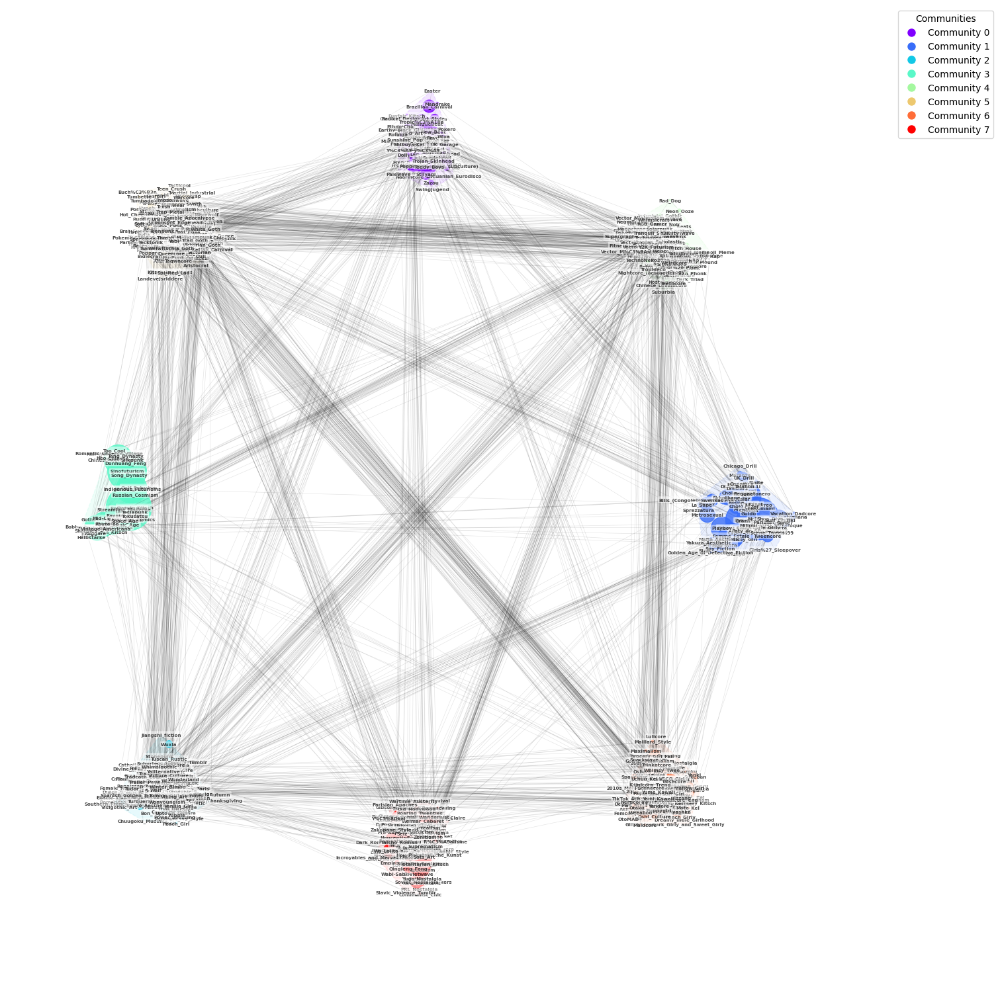

In [44]:
percent_keep = 1
community_scaling = 0.15

# Remove disconnected nodes
G = G.subgraph([n for n in G.nodes() if G.degree(n) > 0])

# Get unique communities
communities = {}
for node, comm in partition.items():
    if node in G.nodes():
        communities.setdefault(comm, []).append(node)

# Calculate betweenness centralities
global_betweenness = nx.betweenness_centrality(G)
local_betweenness = {}
for comm, nodes in communities.items():
    subgraph = G.subgraph(nodes)
    local_betweenness.update(nx.betweenness_centrality(subgraph))

# Filter nodes
filtered_nodes = []
for comm, nodes in communities.items():
    comm_betweenness = {n: local_betweenness[n] for n in nodes}
    sorted_nodes = sorted(comm_betweenness, key=comm_betweenness.get, reverse=True)
    keep_count = max(3, int(len(sorted_nodes) * percent_keep))
    filtered_nodes.extend(sorted_nodes[:keep_count])

# Create filtered view
view = G.subgraph(filtered_nodes)

# Create meta-graph for community layout
meta_G = nx.Graph()
for comm in communities:
    meta_G.add_node(comm)
for u, v in G.edges():
    if partition[u] != partition[v] and u in filtered_nodes and v in filtered_nodes:
        meta_G.add_edge(partition[u], partition[v])

# Compute layouts
if len(communities) > 1:
    meta_pos = nx.spring_layout(meta_G, seed=42, k=1.5, iterations=100)
else:
    meta_pos = {0: np.array([0, 0])}

pos = {}
for comm, nodes in communities.items():
    comm_nodes = [n for n in nodes if n in filtered_nodes]
    if not comm_nodes:
        continue
        
    subgraph = view.subgraph(comm_nodes)
    if len(comm_nodes) > 1:
        sub_pos = nx.spring_layout(subgraph, seed=42, k=0.2)
    else:
        sub_pos = {comm_nodes[0]: np.array([0, 0])}
    
    for node in comm_nodes:
        pos[node] = meta_pos[comm] + sub_pos[node] * community_scaling


community_betweenness = {}
for name, articles in communities.items():
    subgraph = G.subgraph(articles)
    community_betweenness[name] = dict(sorted(nx.betweenness_centrality(subgraph).items(), key=lambda item: item[1], reverse=True))

# Plot setup
plt.figure(figsize=(15, 15))

# Create legend handles
community_colors = plt.cm.rainbow(np.linspace(0, 1, len(communities)))
legend_handles = []
for (comm, nodes), color in zip(communities.items(), community_colors):
    comm_nodes = [n for n in view.nodes() if partition[n] == comm]
    if not comm_nodes:
        continue
    
    # Store legend entry
    legend_handles.append(plt.Line2D([0], [0], 
                                  marker='o', 
                                  color='w', 
                                  label=f'Community {comm}',
                                  markerfacecolor=color,
                                  markersize=10))
    
    # Draw nodes
    node_sizes = [5000 * local_betweenness[n] for n in comm_nodes]
    nx.draw_networkx_nodes(
        view, pos,
        nodelist=comm_nodes,
        node_color=[color] * len(comm_nodes),
        node_size=node_sizes,
        alpha=0.8
    )
    
    # Convex hull
    node_positions = np.array([pos[node] for node in comm_nodes])
    if len(node_positions) >= 3:
        hull = ConvexHull(node_positions)
        poly = plt.Polygon([node_positions[v] for v in hull.vertices], 
                          color=color, alpha=0.1, linewidth=1, linestyle='--')
        plt.gca().add_patch(poly)
    
    # # Community label
    # most_central = max(comm_nodes, key=lambda x: local_betweenness[x])
    # plt.text(pos[most_central][0], pos[most_central][1], 
    #          f'C{comm}', fontsize=10, ha='center', va='center',
    #          bbox=dict(facecolor='white', alpha=0.7, edgecolor='none'))

# Draw edges and labels
nx.draw_networkx_edges(view, pos, alpha=0.1, width=0.5)
label_options = {
    "font_size": 5,
    "font_color": "black",
    "font_weight": "bold",
    "alpha": 0.7,
    "bbox": dict(facecolor='white', edgecolor='none', alpha=0.5, boxstyle='round,pad=0.2')
}
nx.draw_networkx_labels(view, pos, **label_options)

# Add legend
plt.legend(handles=legend_handles, 
           loc='upper right',
           title="Communities",
           bbox_to_anchor=(1.15, 1.0),
           fontsize=10)

plt.axis('off')
plt.tight_layout()
plt.show()

In [141]:
N = 1000  # Top N nodes per community

top_n_per_community_flat = [list(community_betweenness[c].keys())[:N] for c in community_betweenness.keys()]

node_to_community = {}
for comm_id, nodes in communities.items():
    for node in nodes:
        node_to_community[node] = comm_id

# Add community column (NaN if node not in any community)
filtered_table['community'] = filtered_table['key'].map(node_to_community)

# Print as a Python list
print("\nMost influential nodes (highest betweenness centrality per community):")
for c in community_betweenness:
    nodes = [node for node, betweenness in community_betweenness[c].items()]
    print(f"Community {c}: {len(nodes)} nodes: {nodes[:N]}")


Most influential nodes (highest betweenness centrality per community):
Community 0: 79 nodes: ['Mod', 'Hippie', 'Rave', 'Psychedelia', 'Groovival', 'Ultras', 'Madchester', 'Disco', 'Pop_Art', 'Lad_Culture', 'Blokecore', 'Beatnik', 'Skinhead', 'Tropic%C3%A1lia', 'Gorpcore', 'Casuals', 'Teddy_Boys', 'Northern_Soul', 'Brazilian_Carnival', 'Cool_Britannia', 'Normcore', 'Paninaro', 'Y%C3%A9-y%C3%A9', 'Manguebeat', 'Peacock_Revolution', 'Stilyagi', 'Italo_Disco', 'Minet', 'Brazilcore', 'Funk', 'Acid_House', 'Bohemian', 'Britpop', 'Reggae', 'Disco_Polo', 'Gabber', 'New_Beat', 'Flower_Power', 'Balearic_Aesthetic', 'French_New_Wave', 'Zazou', 'Poppers_(German_subculture)', 'Rude_Boy', 'Bakala', 'Shibuya-Kei', 'Tenniscore', 'Corporate_Hippie', 'Suedehead', '2_Tone', 'Carson-Dellosa_Art_Style', 'Art_Hoe', 'Blokette', 'Trojan_Skinhead', 'Oi!_Skinhead', 'Mandrake', 'Mod_Revival', 'Boho-Chic', 'UK_Garage', 'Wixa', 'Funfair_Kitsch', 'Sunshine_Pop', 'Mid-Century_Medieval', 'Belgian_Popcorn', 'Op_Art'

Relaxing physics topology with fixed color attractor strength=1...


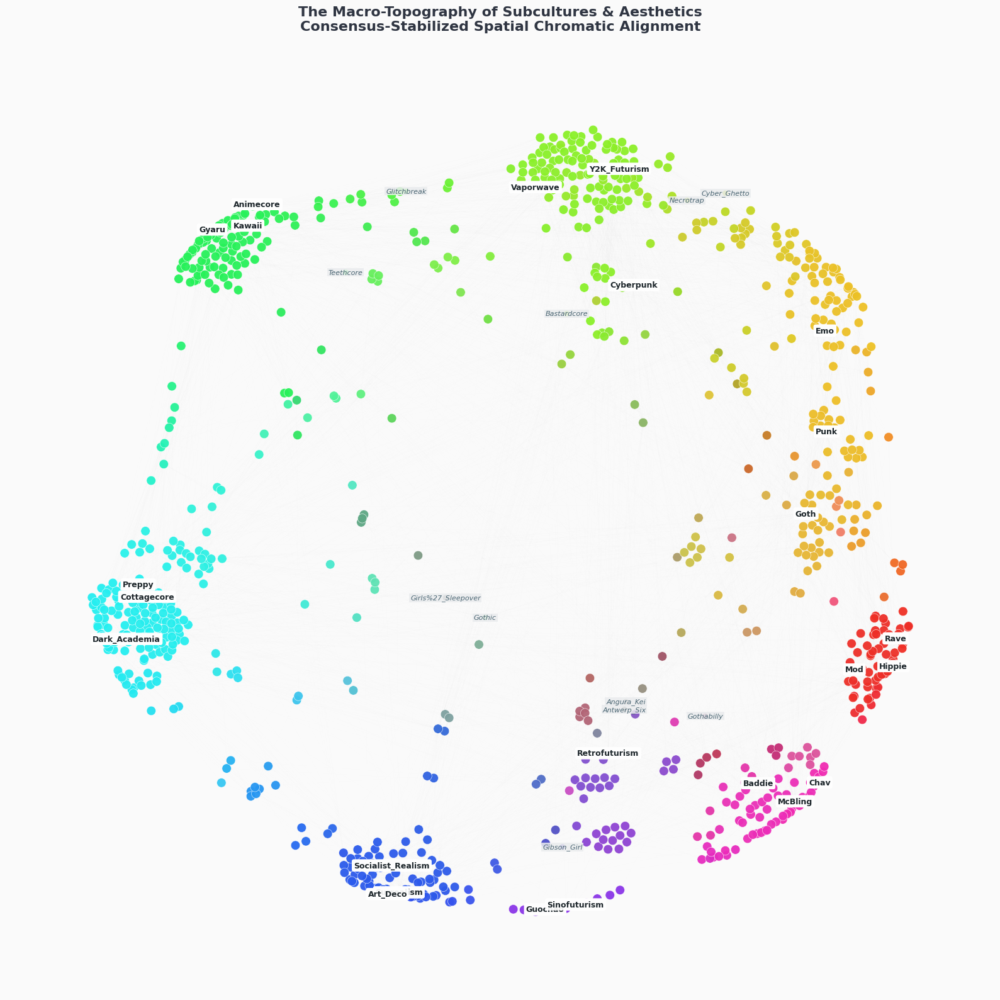

In [67]:
import networkx as nx
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

def plot_topological_circular_galaxy(
    G, CG, partition, community_betweenness, filtered_nodes, 
    N=3, GLOBAL_SATURATION=0.85, GLOBAL_VALUE=0.95, BRIDGE_THRESHOLD=0.70,
    K_DENSITY=1.25, HUE_START=0.15, RING_RADIUS=3.5, COLOR_FORCE_STRENGTH=0.35
):
    """
    Plots the network forcing BOTH the physical layout and the HSV color wheel 
    to follow an optimized community adjacency ring.
    
    CRITICAL FIX: Guarantees colors match physical community layout 
    by tying hue calculations strictly to the ordered greedy cycle sequence.
    """
    all_nodes = list(G.nodes())
    unique_communities = sorted(list(set(partition.values())))
    num_communities = len(unique_communities)
    
    comm_to_idx = {comm_id: idx for idx, comm_id in enumerate(unique_communities)}
    idx_to_comm = {idx: comm_id for comm_id, idx in comm_to_idx.items()}

    # 1. Calculate Cross-Community Edge Density Matrix
    edge_matrix = np.zeros((num_communities, num_communities))
    for u, v in G.edges():
        if u in partition and v in partition:
            idx_u = comm_to_idx[partition[u]]
            idx_v = comm_to_idx[partition[v]]
            if idx_u != idx_v:
                edge_matrix[idx_u][idx_v] += 1
                edge_matrix[idx_v][idx_u] += 1

    # 2. Optimize the Community Cycle Ordering (Greedy Ring)
    unvisited = set(range(num_communities))
    current_idx = 0  
    ordered_indices = [current_idx]
    unvisited.remove(current_idx)
    
    while unvisited:
        next_idx = max(unvisited, key=lambda x: edge_matrix[current_idx][x])
        ordered_indices.append(next_idx)
        unvisited.remove(next_idx)
        current_idx = next_idx

    ordered_community_ids = [idx_to_comm[idx] for idx in ordered_indices]

    # 3. Generate Community Spatial Centers & Hues Using the ORDERED Sequence
    community_centers = {}
    comm_angles = {}
    comm_colors_dict = {}
    
    # Map the unique community IDs to their position in the optimized ring cycle
    comm_to_order_pos = {comm_id: pos_idx for pos_idx, comm_id in enumerate(ordered_community_ids)}
    
    for position_idx, comm_id in enumerate(ordered_community_ids):
        angle = 2 * np.pi * (position_idx / num_communities)
        comm_angles[comm_id] = angle
        
        # Color Anchor: Tied directly to its sorted position on the wheel
        hue = (position_idx / num_communities + HUE_START) % 1.0
        rgb = mcolors.hsv_to_rgb([hue, GLOBAL_SATURATION, GLOBAL_VALUE])
        comm_colors_dict[comm_id] = np.append(rgb, 1.0)
        
        cx = RING_RADIUS * np.cos(angle)
        cy = RING_RADIUS * np.sin(angle)
        community_centers[comm_id] = (cx, cy)

    # 4. Compute Continuous Fractional Membership Matrix
    node_memberships = {}
    for node in all_nodes:
        membership_vector = np.zeros(num_communities)
        if node in CG:
            for neighbor in CG.neighbors(node):
                weight = CG[node][neighbor].get('weight', 0)
                if neighbor in partition:
                    # Collect weights matching the original identity mapping index
                    membership_vector[comm_to_idx[partition[neighbor]]] += weight
                    
        total_weight = np.sum(membership_vector)
        if total_weight > 0:
            node_memberships[node] = membership_vector / total_weight
        else:
            fallback = np.zeros(num_communities)
            if node in partition:
                fallback[comm_to_idx[partition[node]]] = 1.0
            else:
                fallback[:] = 1.0 / num_communities
            node_memberships[node] = fallback

    # 5. Blend Colors & Map Spatial Coordinates to Color Surface Target Vectors
    node_colors = []
    node_sizes = []
    intermediate_nodes = []
    initial_pos = {}
    color_target_pos = {}
    
    rng = np.random.default_rng(42)
    
    for node in all_nodes:
        profile = node_memberships[node]
        max_belonging = np.max(profile)
        
        blended_color = np.zeros(4)
        target_x, target_y = 0.0, 0.0
        
        # Use the original indexing map to extract fractional weights accurately
        for orig_idx, proportion in enumerate(profile):
            c_id = idx_to_comm[orig_idx]
            
            # Blend color using the ordered dictionary color map
            blended_color += proportion * comm_colors_dict[c_id]
            
            # Map geometric attractor coordinates based on the ordered angle profiles
            c_angle = comm_angles[c_id]
            target_x += proportion * (RING_RADIUS * np.cos(c_angle))
            target_y += proportion * (RING_RADIUS * np.sin(c_angle))
        
        blended_color = np.clip(blended_color, 0.0, 1.0)
        blended_color[3] = 1.0 
        node_colors.append(blended_color)
        
        color_target_pos[node] = np.array([target_x, target_y])
        
        if max_belonging < BRIDGE_THRESHOLD:
            intermediate_nodes.append(node)
            node_sizes.append(45)
        else:
            node_sizes.append(110)
            
        # Seed nodes directly near their calculated color target coordinate
        radius = rng.uniform(0.0, 0.3)
        theta = rng.uniform(0, 2 * np.pi)
        initial_pos[node] = np.array([
            target_x + radius * np.cos(theta),
            target_y + radius * np.sin(theta)
        ])

    # 6. Build Augmented Physics Graph containing Spatial Attractors
    physics_G = CG.copy()
    fixed_positions = {}
    
    for node in all_nodes:
        attractor_id = f"attr_{node}"
        target_coords = color_target_pos[node]
        
        physics_G.add_node(attractor_id)
        fixed_positions[attractor_id] = target_coords
        initial_pos[attractor_id] = target_coords
        
        physics_G.add_edge(node, attractor_id, weight=COLOR_FORCE_STRENGTH)

    # 7. Execute Simulation with Fixed Chromatic Attractor Pins
    plt.figure(figsize=(16, 16), facecolor='#FAFAFA')
    ax = plt.gca()
    ax.set_facecolor('#FAFAFA')
    
    print(f"Relaxing physics topology with fixed color attractor strength={COLOR_FORCE_STRENGTH}...")
    
    pos = nx.spring_layout(
        physics_G, 
        weight='weight', 
        k=K_DENSITY, 
        pos=initial_pos, 
        fixed=list(fixed_positions.keys()),
        iterations=85, 
        seed=42
    )
    
    pos = {node: pos[node] for node in all_nodes}
    
    # Draw background structural line framework
    nx.draw_networkx_edges(G, pos, alpha=0.008, edge_color='#2C3E50', width=0.4)
    
    # Draw core and intermediate elements
    nx.draw_networkx_nodes(G, pos, 
                           nodelist=all_nodes, 
                           node_color=node_colors, 
                           node_size=node_sizes, 
                           linewidths=0.4,
                           edgecolors='#FFFFFF', 
                           alpha=0.95)
    
    # 8. Dynamic Labeling Layer
    reconstructed_communities = {}
    for node, comm in partition.items():
        if node in G.nodes():
            reconstructed_communities.setdefault(comm, []).append(node)

    # 8. Dynamic Labeling Layer (Using community_betweenness)
    anchor_nodes = set()
    
    # Loop through the pre-calculated, ranked betweenness dictionary
    for comm_id, ranked_nodes_dict in community_betweenness.items():
        # Extrapolate nodes in their strict pre-sorted order of influence
        ordered_nodes = list(ranked_nodes_dict.keys())
        
        # Filter against your whitelist while preserving the pre-sorted rank
        valid_nodes = [node for node in ordered_nodes if node in filtered_nodes]
        
        # Harvest exactly the top N nodes for this community galaxy
        top_nodes = valid_nodes[:N]
        anchor_nodes.update(top_nodes)
    
    # Core Anchor Tags (Offset outward away from center coordinates)
    for node in anchor_nodes:
        if node in pos:
            x, y = pos[node]
            mag = np.sqrt(x**2 + y**2)
            ox, oy = (x/mag)*0.09, (y/mag)*0.09 if mag > 0 else (0, 0.09)
            
            plt.text(x + ox, y + oy, s=node, fontsize=9, fontweight='bold', color='#1E272C',
                     horizontalalignment='center', verticalalignment='center',
                     bbox=dict(facecolor='#FFFFFF', alpha=0.92, edgecolor='none', boxstyle='round,pad=0.25'))
    
    for node in anchor_nodes:
        if node in pos:
            x, y = pos[node]
            mag = np.sqrt(x**2 + y**2)
            ox, oy = (x/mag)*0.09, (y/mag)*0.09 if mag > 0 else (0, 0.09)
            
            plt.text(x + ox, y + oy, s=node, fontsize=9, fontweight='bold', color='#1E272C',
                     horizontalalignment='center', verticalalignment='center',
                     bbox=dict(facecolor='#FFFFFF', alpha=0.92, edgecolor='none', boxstyle='round,pad=0.25'))
                     
    bridge_degrees = {node: G.degree(node) for node in intermediate_nodes if node in pos}
    top_bridges = sorted(bridge_degrees, key=bridge_degrees.get, reverse=True)[:15]
    
    for node in top_bridges:
        if node not in anchor_nodes:
            x, y = pos[node]
            plt.text(x, y, s=node, fontsize=8, fontstyle='italic', color='#4A6572',
                     horizontalalignment='center', verticalalignment='center',
                     bbox=dict(facecolor='#EAECEE', alpha=0.85, edgecolor='none', boxstyle='square,pad=0.15'))

    plt.title("The Macro-Topography of Subcultures & Aesthetics\nConsensus-Stabilized Spatial Chromatic Alignment", 
              fontsize=16, fontweight='bold', color='#2F3542', pad=20)
    plt.axis('off')
    plt.tight_layout()
    plt.show()
    
    return node_memberships

# Execution with custom tuning parameters to expand density and balance the wheel
node_memberships = plot_topological_circular_galaxy(
    G, CG, partition, community_betweenness, filtered_nodes, 
    N=3, 
    GLOBAL_SATURATION=0.85, 
    GLOBAL_VALUE=0.95, 
    BRIDGE_THRESHOLD=0.50,
    K_DENSITY=8.0, 
    HUE_START=0.0, 
    RING_RADIUS=5.5, 
    COLOR_FORCE_STRENGTH=1
)

In [183]:
import json
from typing import Dict, List, Optional, Set, Tuple
import matplotlib.colors as mcolors
import networkx as nx
import numpy as np
import plotly.graph_objects as go


def plot_interactive_topological_galaxy(
    G: nx.Graph,
    CG: nx.Graph,
    partition: Dict[str, str],
    community_betweenness: Dict[str, Dict[str, float]],
    filtered_nodes: List[str],
    community_names: Optional[Dict[str, str]] = None,
    N: int = 3,
    GLOBAL_SATURATION: float = 0.85,
    GLOBAL_VALUE: float = 0.95,
    BRIDGE_THRESHOLD: float = 0.70,
    K_DENSITY: float = 1.25,
    HUE_START: float = 0.15,
    RING_RADIUS: float = 3.5,
    COLOR_FORCE_STRENGTH: float = 0.35,
    filename: str = "cultural_galaxy_atlas.html"
) -> Dict[str, np.ndarray]:
    """Translates static network topologies into an interactive, web-native visualization.

    Positions subcultures as a balanced macrocultural macro-ring layout using continuous
    fractional community memberships, blends custom color surfaces, relaxes spatial layouts
    via localized spring-physics simulation attractors, and embeds a clean JavaScript
    interaction engine for fluid autocomplete item lookups.

    Args:
        G: The primary visual/structural subculture network graph.
        CG: The condensed or auxiliary multi-community linkage/weights network graph.
        partition: Mapping dict translating subculture node keys to primary macrocommunity IDs.
        community_betweenness: Ranked dictionary nesting centrality metrics for identifying hub elements.
        filtered_nodes: Collection of node identifiers allowed to be flagged as major anchor labels.
        community_names: Optional custom lookup translation map for macroculture names.
        N: Number of top central nodes per community allowed to natively render text labels.
        GLOBAL_SATURATION: Base saturation component applied during HSV-to-RGB conversion.
        GLOBAL_VALUE: Base brightness/value component applied during HSV-to-RGB conversion.
        BRIDGE_THRESHOLD: Percentage point below which a node is flagged as a multi-hub structural bridge.
        K_DENSITY: Optimal structural separation distance variable used for the physics layout.
        HUE_START: Global angle position color shift factor offset [0.0 - 1.0].
        RING_RADIUS: Radial distance spacing defining the root center placement of macro-clusters.
        COLOR_FORCE_STRENGTH: Influence scale of anchored virtual coordinates during relaxation.
        filename: Target system destination disk string path for output visualization.

    Returns:
        Dict[str, np.ndarray]: A profile map linking node keys to their computed multi-cluster
            fractional membership probability arrays.
    """
    # -------------------------------------------------------------------------
    # 1. Structural Namespace Normalization & Mapping Data-Structures
    # -------------------------------------------------------------------------
    names_lookup = community_names or {}
    all_nodes = list(G.nodes())
    unique_communities = sorted(list(set(partition.values())))
    num_communities = len(unique_communities)
    
    comm_to_idx = {names_lookup.get(c, c): i for i, c in enumerate(unique_communities)}
    idx_to_comm = {i: names_lookup.get(c, c) for c, i in comm_to_idx.items()}
    
    local_partition = {node: names_lookup.get(c, c) for node, c in partition.items()}
    local_comm_betweenness = {names_lookup.get(c, c): val for c, val in community_betweenness.items()}

    # -------------------------------------------------------------------------
    # 2. Compute Cross-Community Structural Connectivity Density Matrix
    # -------------------------------------------------------------------------
    edge_matrix = np.zeros((num_communities, num_communities))
    for u, v in G.edges():
        if u in local_partition and v in local_partition:
            idx_u = comm_to_idx[local_partition[u]]
            idx_v = comm_to_idx[local_partition[v]]
            if idx_u != idx_v:
                edge_matrix[idx_u][idx_v] += 1
                edge_matrix[idx_v][idx_u] += 1

    # -------------------------------------------------------------------------
    # 3. Optimize Macro Ring Sequence Topology (Greedy Hamiltonian Path)
    # -------------------------------------------------------------------------
    unvisited = set(range(num_communities))
    current_idx = 0  
    ordered_indices = [current_idx]
    unvisited.remove(current_idx)
    
    while unvisited:
        next_idx = max(unvisited, key=lambda x: edge_matrix[current_idx][x])
        ordered_indices.append(next_idx)
        unvisited.remove(next_idx)
        current_idx = next_idx

    ordered_community_ids = [idx_to_comm[idx] for idx in ordered_indices]

    # -------------------------------------------------------------------------
    # 4. Synthesize Base Macroculture Spatials & Color Palettes
    # -------------------------------------------------------------------------
    community_centers: Dict[str, Tuple[float, float]] = {}
    comm_angles: Dict[str, float] = {}
    comm_colors_dict: Dict[str, np.ndarray] = {}
    
    for pos_idx, comm_id in enumerate(ordered_community_ids):
        angle = 2 * np.pi * (pos_idx / num_communities)
        comm_angles[comm_id] = angle
        
        hue = (pos_idx / num_communities + HUE_START) % 1.0
        rgb = mcolors.hsv_to_rgb([hue, GLOBAL_SATURATION, GLOBAL_VALUE])
        comm_colors_dict[comm_id] = np.append(rgb, 1.0)
        
        community_centers[comm_id] = (
            RING_RADIUS * np.cos(angle),
            RING_RADIUS * np.sin(angle)
        )

    # -------------------------------------------------------------------------
    # 5. Compute Continuous Mathematical Fractional Membership Mixes
    # -------------------------------------------------------------------------
    node_memberships: Dict[str, np.ndarray] = {}
    for node in all_nodes:
        membership_vector = np.zeros(num_communities)
        if node in CG:
            for neighbor in CG.neighbors(node):
                weight = CG[node][neighbor].get('weight', 0)
                if neighbor in local_partition:
                    membership_vector[comm_to_idx[local_partition[neighbor]]] += weight
                    
        total_weight = np.sum(membership_vector)
        if total_weight > 0:
            node_memberships[node] = membership_vector / total_weight
        else:
            fallback = np.zeros(num_communities)
            if node in local_partition:
                fallback[comm_to_idx[local_partition[node]]] = 1.0
            else:
                fallback[:] = 1.0 / num_communities
            node_memberships[node] = fallback

    # -------------------------------------------------------------------------
    # 6. Construct Continuous Color Profiles & Chromatic Target Arrays
    # -------------------------------------------------------------------------
    node_colors: List[np.ndarray] = []
    node_sizes: List[int] = []
    intermediate_nodes: List[str] = []
    initial_pos: Dict[str, np.ndarray] = {}
    color_target_pos: Dict[str, np.ndarray] = {}
    
    rng = np.random.default_rng(42)
    
    for node in all_nodes:
        profile = node_memberships[node]
        max_belonging = np.max(profile)
        
        blended_color = np.zeros(4)
        target_x, target_y = 0.0, 0.0
        
        for orig_idx, proportion in enumerate(profile):
            c_id = idx_to_comm[orig_idx]
            blended_color += proportion * comm_colors_dict[c_id]
            
            c_angle = comm_angles[c_id]
            target_x += proportion * (RING_RADIUS * np.cos(c_angle))
            target_y += proportion * (RING_RADIUS * np.sin(c_angle))
        
        blended_color = np.clip(blended_color, 0.0, 1.0)
        blended_color[3] = 1.0 
        node_colors.append(blended_color)
        
        color_target_pos[node] = np.array([target_x, target_y])
        
        if max_belonging < BRIDGE_THRESHOLD:
            intermediate_nodes.append(node)
            node_sizes.append(45)
        else:
            node_sizes.append(110)
            
        radius = rng.uniform(0.0, 0.3)
        theta = rng.uniform(0, 2 * np.pi)
        initial_pos[node] = np.array([
            target_x + radius * np.cos(theta),
            target_y + radius * np.sin(theta)
        ])

    # -------------------------------------------------------------------------
    # 7. Constrained Network Physics Relaxation Simulation
    # -------------------------------------------------------------------------
    physics_G = CG.copy()
    fixed_positions: Dict[str, np.ndarray] = {}
    
    for node in all_nodes:
        attractor_id = f"attr_{node}"
        target_coords = color_target_pos[node]
        
        physics_G.add_node(attractor_id)
        fixed_positions[attractor_id] = target_coords
        initial_pos[attractor_id] = target_coords
        physics_G.add_edge(node, attractor_id, weight=COLOR_FORCE_STRENGTH)

    print(f"Relaxing physics topology with fixed color attractor strength={COLOR_FORCE_STRENGTH}...")
    sim_pos = nx.spring_layout(
        physics_G, 
        weight='weight', 
        k=K_DENSITY, 
        pos=initial_pos, 
        fixed=list(fixed_positions.keys()),
        iterations=85, 
        seed=42
    )
    pos = {node: sim_pos[node] for node in all_nodes}

    # -------------------------------------------------------------------------
    # 8. Web Graphics Layer Assembly (Plotly Object Pipelines)
    # -------------------------------------------------------------------------
    rgba_colors: List[str] = []
    for col in node_colors:
        c = np.ravel(col)
        try:
            r = int(np.clip(c[0] * 255, 0, 255))
            g = int(np.clip(c[1] * 255, 0, 255))
            b = int(np.clip(c[2] * 255, 0, 255))
            a = float(np.clip(c[3], 0.0, 1.0))
            rgba_colors.append(f"rgba({r},{g},{b},{a})")
        except (IndexError, TypeError):
            rgba_colors.append("rgba(44,62,80,1.0)")

    edge_x: List[Optional[float]] = []
    edge_y: List[Optional[float]] = []
    for u, v in G.edges():
        if u in pos and v in pos:
            x0, y0 = pos[u]
            x1, y1 = pos[v]
            edge_x.extend([x0, x1, None])
            edge_y.extend([y0, y1, None])

    bg_edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=0.65, color='rgba(44, 62, 80, 0.09)'), 
        hoverinfo='none',
        mode='lines',
        showlegend=False
    )

    fg_edge_trace = go.Scatter(
        x=[], y=[],
        line=dict(width=3.5, color='rgba(30, 39, 44, 0.85)'),
        hoverinfo='none',
        mode='lines',
        showlegend=False
    )

    node_traces: List[go.Scatter] = []
    anchor_nodes: Set[str] = set()
    for comm_id, ranked_nodes_dict in local_comm_betweenness.items():
        ordered_nodes = list(ranked_nodes_dict.keys())
        valid_nodes = [node for node in ordered_nodes if node in filtered_nodes]
        anchor_nodes.update(valid_nodes[:N])

    for comm_id in ordered_community_ids:
        comm_x, comm_y, comm_hover_text, comm_marker_colors, comm_marker_sizes, node_labels, comm_node_ids = (
            [], [], [], [], [], [], []
        )
        display_mode = 'markers'

        for idx, node in enumerate(all_nodes):
            profile = node_memberships[node]
            
            if np.argmax(profile) == comm_to_idx[comm_id] and node in pos:
                x, y = pos[node]
                comm_x.append(x)
                comm_y.append(y)
                comm_node_ids.append(str(node))
                
                breakdown_lines = [
                    f" &nbsp;&nbsp;• {idx_to_comm[c_idx]}: {proportion*100:.1f}%"
                    for c_idx, proportion in enumerate(profile) if proportion > 0.05
                ]
                percentage_breakdown = "<br>".join(breakdown_lines)
                
                hover_billboard = (
                    f"<b>Aesthetic Element:</b> {node}<br>"
                    f"<b>Primary Hub:</b> {comm_id}<br>"
                    f"<b>Identity Profile:</b><br>{percentage_breakdown}"
                )
                comm_hover_text.append(hover_billboard)
                comm_marker_colors.append(rgba_colors[idx])
                
                plotly_size = 9 if node in intermediate_nodes else 18
                comm_marker_sizes.append(plotly_size)
                
                if node in anchor_nodes:
                    display_mode = 'markers+text'
                    node_labels.append(f"<b>{node}</b>")
                else:
                    node_labels.append("")

        trace = go.Scatter(
            x=comm_x, y=comm_y,
            mode=display_mode,
            name=f"{comm_id}",
            hoverinfo='text',
            hovertext=comm_hover_text,  
            customdata=comm_node_ids, 
            text=node_labels,  
            textposition="top center",
            texttemplate="%{text}",  
            textfont=dict(size=10, color="#1E272C", family="Arial, sans-serif", shadow="auto"),
            marker=dict(size=comm_marker_sizes, color=comm_marker_colors, line=dict(width=1.0, color='#FFFFFF')),
            unselected=dict(marker=dict(opacity=0.15))
        )
        node_traces.append(trace)

    layout = go.Layout(
        title=dict(
            text="The Microcultural Map<br><sup>Coloured by Macrocultures</sup>",
            font=dict(size=22, color='#2F3542', family="Helvetica, Arial, sans-serif"),
            x=0.5, y=0.96
        ),
        showlegend=True,
        legend=dict(
            title=dict(text="<b>Macrocultures</b>", font=dict(size=12)),
            x=1.01, y=1, 
            font=dict(size=11),
            bgcolor="rgba(255,255,255,0.6)",
            bordercolor="rgba(220,224,230,0.8)",
            borderwidth=1
        ),
        hovermode='closest',
        dragmode='pan',
        margin=dict(b=10, l=10, r=10, t=80), 
        paper_bgcolor='#FAFAFA',
        plot_bgcolor='#FAFAFA',
        xaxis=dict(showgrid=False, zeroline=False, showticklabels=False, scaleanchor="y", scaleratio=1),
        yaxis=dict(showgrid=False, zeroline=False, showticklabels=False),
        uniformtext=dict(mode="show", minsize=8),  
        autosize=True 
    )

    fig = go.Figure(data=[bg_edge_trace, fg_edge_trace] + node_traces, layout=layout)
    fig.update_layout(
        hoverlabel=dict(
            bgcolor="rgba(30, 39, 44, 0.95)",
            font_size=13,
            font_color="white",
            font_family="Arial, sans-serif",
            bordercolor="#1E272C"
        )
    )
    
    # Serialize Python runtime structures to pure standard JSON payloads
    adj_list_dict = {str(u): [str(v) for v in G.neighbors(u)] for u in G.nodes()}
    pos_json_dict = {str(k): [float(v[0]), float(v[1])] for k, v in pos.items()}
    sorted_aesthetics_master = sorted([str(n) for n in all_nodes])
    anchor_nodes_list = list(anchor_nodes)

    html_raw = fig.to_html(
        include_plotlyjs='cdn',
        full_html=True,
        config={
            'displayModeBar': True, 
            'scrollZoom': True,
            'responsive': True,
            'modeBarButtonsToRemove': [
                'zoom2d', 'pan2d', 'select2d', 'lasso2d', 'zoomIn2d', 
                'zoomOut2d', 'autoScale2d', 'resetScale2d', 'hoverClosestCartesian', 
                'hoverCompareClick', 'toggleSpikelines'
            ],
            'displaylogo': False
        }
    )
    
    # -------------------------------------------------------------------------
    # 9. Encapsulated JavaScript Frontend Injection Engine
    # -------------------------------------------------------------------------
    javascript_injection = f"""
    <div id="search-wrapper" style="position: absolute; top: 20px; left: 20px; z-index: 999999; font-family: Arial, sans-serif; width: 280px;">
        <input type="text" id="aesthetic-search" placeholder="Search aesthetics (e.g., academia)..." 
               style="width: 100%; padding: 10px 14px; border: 1px solid #DCDEDF; border-radius: 6px; box-shadow: 0 2px 8px rgba(0,0,0,0.06); font-size: 13px; outline: none; background-color: #FFFFFF; color: #2F3542;" />
        <div id="autocomplete-box" style="position: absolute; width: 100%; max-height: 240px; overflow-y: auto; background: #FFFFFF; border-radius: 0 0 6px 6px; box-shadow: 0 4px 12px rgba(0,0,0,0.1); display: none; margin-top: 2px; border: 1px solid #E8EAEB;"></div>
    </div>

    <style>
        html, body, .plotly-graph-div {{
            width: 100% !important;
            height: 100vh !important;
            margin: 0 !important;
            padding: 0 !important;
            overflow: hidden !important;
        }}
        .search-item {{
            padding: 9px 14px;
            cursor: pointer;
            font-size: 13px;
            color: #2F3542;
            border-bottom: 1px solid #F1F2F3;
            transition: background 0.15s ease-in-out;
        }}
        .search-item:last-child {{ border-bottom: none; }}
        .search-item:hover {{ background-color: #F1F2F3; }}
        
        .scatterlayer .text text {{
            paint-order: stroke fill;
            stroke: #FFFFFF !important;
            stroke-width: 1.5px !important;  
            stroke-linecap: round !important;
            stroke-linejoin: round !important;
        }}
    </style>
    <script>
    window.addEventListener('DOMContentLoaded', (event) => {{
        const gd = document.querySelector('.plotly-graph-div');
        if (!gd) return;

        window.addEventListener('resize', function() {{
            Plotly.Plots.resize(gd);
        }});

        const adjList = {json.dumps(adj_list_dict)};
        const nodePositions = {json.dumps(pos_json_dict)};
        const masterNodesList = {json.dumps(sorted_aesthetics_master)};
        const globalAnchors = {json.dumps(anchor_nodes_list)};

        const baseMarkerSizes = gd.data.map(t => t.marker ? [...t.marker.size || []] : []);
        const baseModes = gd.data.map(t => t.mode || 'markers');
        const baseTexts = gd.data.map(t => t.text ? [...t.text] : []);
        const baseBgEdgeWidth = gd.data[0].line.width;
        const baseBgEdgeColor = gd.data[0].line.color;

        let currentlyIsolatedNode = null;

        const searchInput = document.getElementById('aesthetic-search');
        const autoBox = document.getElementById('autocomplete-box');

        function openFandomWiki(nodeId) {{
            if (!nodeId) return;
            const cleanName = nodeId
                .replace(/_/g, ' ')
                .trim()
                .split(' ')
                .map(word => word.charAt(0).toUpperCase() + word.slice(1))
                .join('_');
            
            const targetUrl = `https://aesthetics.fandom.com/wiki/${{cleanName}}`;
            window.open(targetUrl, '_blank');
        }}

        function deselectNodeOnly() {{
            currentlyIsolatedNode = null;
            
            Plotly.restyle(gd, {{
                'line.width': [baseBgEdgeWidth],
                'line.color': [baseBgEdgeColor]
            }}, [0]);

            Plotly.restyle(gd, {{
                'x': [[]],
                'y': [[]]
            }}, [1]);

            baseMarkerSizes.forEach((origSizes, tIdx) => {{
                if (tIdx === 0 || tIdx === 1) return;
                Plotly.restyle(gd, {{
                    'mode': [baseModes[tIdx]],
                    'text': [baseTexts[tIdx]],
                    'marker.size': [origSizes],
                    'marker.line.width': [1.0],
                    'marker.line.color': ['#FFFFFF']
                }}, [tIdx]);
            }});
        }}

        function fullMapReset() {{
            deselectNodeOnly();
            Plotly.relayout(gd, {{
                'xaxis.autorange': true,
                'yaxis.autorange': true
            }});
        }}

        function isolateCultureNode(selectedNodeId) {{
            currentlyIsolatedNode = selectedNodeId;
            const connectedNeighbors = adjList[selectedNodeId] || [];
            
            const updateTracesObj = {{
                'mode': [],
                'text': [],
                'marker.size': [],
                'marker.line.width': [],
                'marker.line.color': []
            }};
            const targetIndices = [];

            gd.data.forEach((trace, tIdx) => {{
                if (tIdx === 0 || tIdx === 1) return; 
                
                targetIndices.push(tIdx);
                const sizes = [...baseMarkerSizes[tIdx]];
                const strokeWidths = new Array(sizes.length).fill(1.0);
                const strokeColors = new Array(sizes.length).fill('#FFFFFF');
                const dynamicTexts = new Array(sizes.length).fill("");

                if (trace.customdata) {{
                    trace.customdata.forEach((nodeId, nIdx) => {{
                        const isTarget = (nodeId === selectedNodeId);
                        const isNeighbor = connectedNeighbors.includes(nodeId);
                        const isGlobalAnchor = globalAnchors.includes(nodeId);
                        const cleanLabel = nodeId.replace(/_/g, ' ');

                        if (isTarget) {{
                            dynamicTexts[nIdx] = `<b>✨ ${{cleanLabel}}</b>`;
                            sizes[nIdx] = 24; 
                            strokeWidths[nIdx] = 3.0; 
                            strokeColors[nIdx] = '#1E272C'; 
                        }} else if (isNeighbor || isGlobalAnchor) {{
                            dynamicTexts[nIdx] = `<b>${{cleanLabel}}</b>`;
                        }}
                    }});
                }}
                
                updateTracesObj['mode'].push('markers+text');
                updateTracesObj['text'].push(dynamicTexts);
                updateTracesObj['marker.size'].push(sizes);
                updateTracesObj['marker.line.width'].push(strokeWidths);
                updateTracesObj['marker.line.color'].push(strokeColors);
            }});

            const activeEdgeX = [];
            const activeEdgeY = [];
            const centerCoords = nodePositions[selectedNodeId];

            if (centerCoords) {{
                connectedNeighbors.forEach(nb => {{
                    const targetCoords = nodePositions[nb];
                    if (targetCoords) {{
                        activeEdgeX.push(centerCoords[0], targetCoords[0], null);
                        activeEdgeY.push(centerCoords[1], targetCoords[1], null);
                    }}
                }});
            }}

            Plotly.restyle(gd, {{
                'x': [activeEdgeX],
                'y': [activeEdgeY],
                'line.width': [3.5],
                'line.color': ['rgba(30, 39, 44, 0.85)']
            }}, [1]);

            Plotly.restyle(gd, updateTracesObj, targetIndices);
        }}

        searchInput.addEventListener('input', function(e) {{
            const query = e.target.value.toLowerCase().trim();
            autoBox.innerHTML = '';
            
            if (!query) {{
                autoBox.style.display = 'none';
                return;
            }}

            const matches = masterNodesList.filter(n => n.toLowerCase().includes(query));
            if (matches.length === 0) {{
                autoBox.style.display = 'none';
                return;
            }}

            matches.forEach(match => {{
                const item = document.createElement('div');
                item.className = 'search-item';
                item.textContent = match.replace(/_/g, ' ');
                
                item.addEventListener('click', function() {{
                    searchInput.value = match.replace(/_/g, ' ');
                    autoBox.style.display = 'none';
                    isolateCultureNode(match);
                }});
                autoBox.appendChild(item);
            }});
            autoBox.style.display = 'block';
        }});

        document.addEventListener('click', function(e) {{
            if (!document.getElementById('search-wrapper').contains(e.target)) {{
                autoBox.style.display = 'none';
            }}
        }});

        gd.on('plotly_click', function(data) {{
            if (!data || !data.points || data.points.length === 0) {{
                deselectNodeOnly();
                searchInput.value = '';
                return;
            }}
            
            const pt = data.points[0];
            if (pt.curveNumber === 0 || pt.curveNumber === 1) {{
                deselectNodeOnly();
                searchInput.value = '';
                return;
            }}

            const selectedNodeId = pt.customdata;
            if (!selectedNodeId) {{
                deselectNodeOnly();
                searchInput.value = '';
                return;
            }}

            if (currentlyIsolatedNode === selectedNodeId) {{
                openFandomWiki(selectedNodeId);
            }} else {{
                searchInput.value = selectedNodeId.replace(/_/g, ' ');
                isolateCultureNode(selectedNodeId);
            }}
        }});

        gd.on('plotly_doubleclick', function(e) {{
            fullMapReset();
            searchInput.value = '';
            return false; 
        }});
    }});
    </script>
    </body>
    """
    
    html_customized = html_raw.replace("</body>", javascript_injection)
    
    with open(filename, "w", encoding="utf-8") as f:
        f.write(html_customized)
        
    print(f"Success! Fluid search autocomplete engine active. Saved to: '{filename}'")
    return node_memberships

In [184]:
my_culture_names = {
0: 'Sonic Psychedelia',
1: 'Hyper-Consumerist Street Glamour',
2: 'Academic Pastoral Romanticism',
3: 'Globalised Futurisms',
4: 'Cyberspace Culture',
5: 'Alt Rebellion',
6: 'East Asian Youth Maximalism',
7: 'Institutional Art'
}

# Clean runtime configuration invocation matching your exact metrics
node_memberships = plot_interactive_topological_galaxy(
    G=G, 
    CG=CG, 
    partition=partition, 
    community_betweenness=community_betweenness, 
    filtered_nodes=filtered_nodes, 
    community_names=my_culture_names,
    N=3, 
    GLOBAL_SATURATION=0.85, 
    GLOBAL_VALUE=0.95, 
    BRIDGE_THRESHOLD=0.50,
    K_DENSITY=8.0, 
    HUE_START=0.0, 
    RING_RADIUS=5.5, 
    COLOR_FORCE_STRENGTH=1.0,
    filename="cultural_galaxy_atlas.html"
)

Relaxing physics topology with fixed color attractor strength=1.0...
Success! Fluid search autocomplete engine active. Saved to: 'cultural_galaxy_atlas.html'


## Community Deep Dive

In [136]:
community_betweenness

{0: {'Mod': 0.21326291117769364,
  'Hippie': 0.1313680094191546,
  'Rave': 0.10470321241284022,
  'Psychedelia': 0.1046226695676006,
  'Groovival': 0.09966401488536725,
  'Ultras': 0.09904748258303406,
  'Madchester': 0.07689389331267385,
  'Disco': 0.06694901671496792,
  'Pop_Art': 0.06600060697847586,
  'Lad_Culture': 0.0627825293483165,
  'Blokecore': 0.053622224154555614,
  'Beatnik': 0.05323023893647269,
  'Skinhead': 0.0528881270533445,
  'Tropic%C3%A1lia': 0.04772062114630536,
  'Gorpcore': 0.044652720494525754,
  'Casuals': 0.04461242810943447,
  'Teddy_Boys': 0.043237881765246906,
  'Northern_Soul': 0.03717348094226256,
  'Brazilian_Carnival': 0.036276095079211465,
  'Cool_Britannia': 0.03621495959762581,
  'Normcore': 0.03573621036158499,
  'Paninaro': 0.030167111213889514,
  'Y%C3%A9-y%C3%A9': 0.029851622783729378,
  'Manguebeat': 0.02789691823858626,
  'Peacock_Revolution': 0.027193217275963234,
  'Stilyagi': 0.02582648802546045,
  'Italo_Disco': 0.021292360886164916,
  'Mi

In [32]:
earliset_year_com = -202000
latest_year_com = 300000
Com_index = 0


com_table = table[(table["earliest_origin"] >= earliset_year_com) & (table["latest_origin"] < latest_year_com) & (table["key"].isin(communities[Com_index]))].reset_index(drop=True).copy()

com_keys = com_table['key'].tolist()


print(Com_index,': ',list(community_betweenness[Com_index]))

com_table.head(20)

0 :  ['McBling', 'Baddie', 'Chav', 'Femme_Fatale', 'Racaille', 'Bubblegum_Bitch', 'Chonga', 'Choni', 'Cani', 'Playboy', 'Cholo', 'Reggaetonero', 'Film_Noir', 'Bimbocore', 'Zef', 'Barbiecore', 'UK_Drill', 'Cherry_Emoji_Twitter', 'Spy_Fiction', 'Cagole', 'Tweencore', 'Mafia_Aesthetic', 'Coconut_Girl', 'Maranza', 'Raxet', 'Heistcore', 'Guido', 'Cholombiano', 'Neoperreo', 'Ah_Beng', 'Curly_Girly', 'Flaite', 'MDLR', 'Talahon', 'Motomami', 'Cyber_Stylin%E2%80%99', 'Milipili', 'Bubblegum_Coquette', 'Bubblegum_Bling', '2000s_Preppy', 'Dizela%C5%A1i', 'Dresiarz', 'Gopnik', 'Cumbiero', 'Paty_de_SP', '2020s_Preppy', 'Golden_Age_of_Detective_Fiction', 'Tropicalcore', 'Parisian_Girly', 'Bogan', 'Cocalar', 'Pachuco', 'Eshay', 'Chicago_Drill', '2000s_Modern_Baroque', 'Scene_Tween', 'Yakuza_Aesthetic', 'Brazilian_Bombshell', 'Shoe_Diva', 'Pokero', 'Sizz', 'Mob_Wife', 'Asian_Baby_Girl', 'Juggalo']


,name,key,link,related_aesthetics,decade_of_origin,key_motifs,key_colours,key_values,related_media,earliest_origin,latest_origin
0,2000s Modern Baroque,2000s_Modern_Baroque,https://aesthetics.fandom.com/wiki/2000s_Moder...,"[Baroque, Curly_Girly, McBling, Parisian_Girly...",2000s,"Ornate details, gilded accents, sumptuous fabr...","Black and gold, but also a broader range inclu...","Opulence, drama, a reinterpretation of traditi...",NaN,2000.0,2000.0
1,2000s Preppy,2000s_Preppy,https://aesthetics.fandom.com/wiki/2000s_Preppy,"[Barbiecore, Basic_Girl, Boujee, Bubblegum_Bit...",2000s,"Wealth, popularity, femininity, elitism","Light and bright colors, a lot of pink, black ...",NaN,"lueless, Gossip Girl",2000.0,2000.0
2,2020s Preppy,2020s_Preppy,https://aesthetics.fandom.com/wiki/2020s_Preppy,"[Bubblegum_Bling, Coconut_Girl, Dopamine_Dress...",2020s,"Smiley faces, lightning bolts, chenille patche...","Hot pink, cyan, neon pastels, bright orange","Cheerfulness, affluence, cleanliness, popularity",NaN,2020.0,2020.0
3,Ah Beng,Ah_Beng,https://aesthetics.fandom.com/wiki/Ah_Beng,"[Bogan, B%C5%8Ds%C5%8Dzoku, Chav, McBling]",1990s,"Rebonded/dyed Hair (blonde/red), loud and flas...",NaN,"Materialism, anti-intellectualism, loyalty (to...","hua Chu Kang Pte Ltd (Sitcom), Army Daze (Film)",1990.0,1990.0
4,Asian Baby Girl,Asian_Baby_Girl,https://aesthetics.fandom.com/wiki/Asian_Baby_...,"[Baddie, Femme_Fatale, Sukeban]",1990s,"Raves, parties, boba, tattoos, dyed hair, nigh...",Black,"Rebellion against stereotypes, individuality, ...",NaN,1990.0,1990.0
5,Baddie,Baddie,https://aesthetics.fandom.com/wiki/Baddie,"[Barbiecore, Bimbocore, Cherry_Emoji_Twitter, ...",2010s,Bold makeup and fashion,"Black, red, camo, beige, white and pink.","Being confident, looking good, wearing makeup",NaN,2010.0,2010.0
6,Barbiecore,Barbiecore,https://aesthetics.fandom.com/wiki/Barbiecore,"[Bimbocore, Bubblegum_Bitch, Coconut_Girl, Cur...",2020s (with roots in early 2000sMcBlingfashion),NaN,"Holographic, hot pink, lavender, pastel pink, ...","Beauty, self care, fashion, female friendship","arbie, Disney tween shows, Nickelodeon tween s...",2000.0,2020.0
7,Bimbocore,Bimbocore,https://aesthetics.fandom.com/wiki/Bimbocore,"[Barbiecore, McBling, Y2K, Baddie, Guido, Hype...",Early 2020s,"Pink everything, glitter, velour tracksuits, m...","Hot pink, baby pink, magenta, pastels","Subversionand reclamation of femininity, pro-s...",NaN,2020.0,2020.0
8,Bogan,Bogan,https://aesthetics.fandom.com/wiki/Bogan,[Chav],1980’s,NaN,NaN,NaN,NaN,1980.0,1980.0
9,Brazilian Bombshell,Brazilian_Bombshell,https://aesthetics.fandom.com/wiki/Brazilian_B...,"[Barbiecore, Bimbocore, Heroin_Chic, McBling, ...",2000s,"Wavy hair, sun-kissed skin, lingerie, fashion ...",Vibrant colours,"Confidence, sexiness, sensuality, athleticism",NaN,2000.0,2000.0


In [33]:
# Create a subgraph with only the nodes we want to keep
GC = G.subgraph(com_keys).copy()  # .copy() creates a new graph instead of a view

# Now calculate your metrics on the filtered graph
betweenness_c_com = dict(sorted(nx.betweenness_centrality(GC).items(), key=lambda item: item[1], reverse=True))
clustering_coefficients_com = dict(sorted(nx.clustering(GC).items(), key=lambda item: item[1], reverse=True))
degree_com = dict(GC.degree())

def filter_betweenness(n):
    return betweenness_c_com[n]  > 0.01
betweenness_c_com

view = nx.subgraph_view(GC, filter_node = filter_betweenness)
view

pos = nx.spring_layout(view)  # You can use different layout algorithms
plt.figure(figsize=(100, 100))
node_colors = [0.01*np.log(clustering_coefficients_com[v]*degree_com[v]*100) for v in list(view.nodes())]
node_sizes = [3000000 * betweenness_c_com[v] for v in list(view.nodes())]
nx.draw(view, pos, node_size=node_sizes, width=2, node_color = node_colors, font_size=40, with_labels=True)
plt.show()

/var/folders/yb/_73rmj_j1p58s6zk51glp1y80000gn/T/ipykernel_44338/1197127696.py:18: RuntimeWarning: divide by zero encountered in log
  node_colors = [0.01*np.log(clustering_coefficients_com[v]*degree_com[v]*100) for v in list(view.nodes())]


In [34]:
top_n = 10000
community_list_ordered = [i[0] for i in list(betweenness_c_com.items())[:top_n]]
community_list_ordered

['McBling',
 'Baddie',
 'Chav',
 'Femme_Fatale',
 'Racaille',
 'Bubblegum_Bitch',
 'Chonga',
 'Choni',
 'Cani',
 'Playboy',
 'Cholo',
 'Reggaetonero',
 'Film_Noir',
 'Bimbocore',
 'Zef',
 'Barbiecore',
 'UK_Drill',
 'Cherry_Emoji_Twitter',
 'Spy_Fiction',
 'Cagole',
 'Tweencore',
 'Mafia_Aesthetic',
 'Coconut_Girl',
 'Maranza',
 'Raxet',
 'Heistcore',
 'Guido',
 'Cholombiano',
 'Neoperreo',
 'Ah_Beng',
 'Curly_Girly',
 'Flaite',
 'MDLR',
 'Talahon',
 'Motomami',
 'Cyber_Stylin%E2%80%99',
 'Milipili',
 'Bubblegum_Coquette',
 'Bubblegum_Bling',
 '2000s_Preppy',
 'Dizela%C5%A1i',
 'Dresiarz',
 'Gopnik',
 'Cumbiero',
 'Paty_de_SP',
 '2020s_Preppy',
 'Golden_Age_of_Detective_Fiction',
 'Tropicalcore',
 'Parisian_Girly',
 'Bogan',
 'Cocalar',
 'Pachuco',
 'Eshay',
 'Chicago_Drill',
 '2000s_Modern_Baroque',
 'Scene_Tween',
 'Yakuza_Aesthetic',
 'Brazilian_Bombshell',
 'Shoe_Diva',
 'Pokero',
 'Sizz',
 'Mob_Wife',
 'Asian_Baby_Girl',
 'Juggalo']

# Popularity 

In [38]:
def format_article_names_for_wiki(raw_names):
    """
    Takes a list of raw names like ['Dark_Academia', 'Cyberpunk_']
    Returns a list of properly formatted names like ['Dark_academia', 'Cyberpunk']
    """
    formatted = []
    for raw_name in raw_names:
        name = raw_name.strip("_")
        parts = name.split("_")
        if not parts:
            formatted.append(name)
        else:
            formatted_name = "_".join([parts[0].capitalize()] + [part.lower() for part in parts[1:]])
            formatted.append(formatted_name)
    return formatted
    
def get_wiki_pageviews(articles, start="20200101", end="20250901", resolution="monthly"):
    """
    Fetches Wikipedia pageviews for a list of articles with specified resolution.
    
    Parameters:
        articles (list): List of article titles.
        start (str): Start date in YYYYMMDD format.
        end (str): End date in YYYYMMDD format.
        resolution (str): 'monthly', 'daily', or 'hourly'.
    
    Returns:
        pd.DataFrame with columns: aesthetic, timestamp, views
    """
    headers = {"User-Agent": "AestheticTrendResearch/1.0 (contact: louisdweck@gmail.com)"}
    all_data = []

    for article in articles:
        article_encoded = quote(article)
        url = f"https://wikimedia.org/api/rest_v1/metrics/pageviews/per-article/en.wikipedia.org/all-access/user/{article_encoded}/{resolution}/{start}/{end}"
        r = requests.get(url, headers=headers)
        if r.status_code != 200:
            print(f"{article}: Failed ({r.status_code})")
            continue

        try:
            items = r.json()["items"]
            for item in items:
                timestamp = item["timestamp"]
                if resolution == "monthly":
                    date = pd.to_datetime(timestamp[:6], format="%Y%m")
                elif resolution == "daily":
                    date = pd.to_datetime(timestamp[:8], format="%Y%m%d")
                elif resolution == "hourly":
                    date = pd.to_datetime(timestamp, format="%Y%m%d%H")
                else:
                    raise ValueError("Unsupported resolution: choose 'monthly', 'daily', or 'hourly'.")

                all_data.append({
                    "aesthetic": article,
                    "timestamp": date,
                    "views": item["views"]
                })
        except Exception as e:
            print(f"Error parsing data for {article}: {e}")
            continue

    return pd.DataFrame(all_data)

def pivot_pageviews_by_timestamp(df):
    """
    Transforms the pageviews DataFrame so that:
    - rows = timestamps (monthly/daily/hourly)
    - columns = aesthetics
    - values = views
    """
    pivoted = df.pivot(index="timestamp", columns="aesthetic", values="views")
    pivoted = pivoted.sort_index()
    return pivoted



def plot_pageviews_plotly(df):
    """
    Interactive line plot of Wikipedia views using Plotly.
    Supports either:
    - long-form DataFrame: columns = timestamp, aesthetic, views
    - pivoted DataFrame: index = timestamp, columns = aesthetics
    """
    if "aesthetic" in df.columns and "views" in df.columns:
        # Long-form
        fig = px.line(df, x="timestamp", y="views", color="aesthetic",
                      title="Wikipedia Pageviews Over Time by Aesthetic")
    else:
        # Pivoted DataFrame
        fig = go.Figure()
        for aesthetic in df.columns:
            fig.add_trace(go.Scatter(
                x=df.index,
                y=df[aesthetic],
                mode="lines",
                name=aesthetic
            ))
        fig.update_layout(
            title="Wikipedia Pageviews Over Time by Aesthetic",
            xaxis_title="Timestamp",
            yaxis_title="Views",
            template="plotly_white"
        )
    fig.show()


Coastal_style: Failed (404)
International_typographic_style: Failed (404)
Tomato_girl_summer: Failed (404)
Scandi_girl_winter: Failed (404)
Coastal_cowgirl: Failed (404)


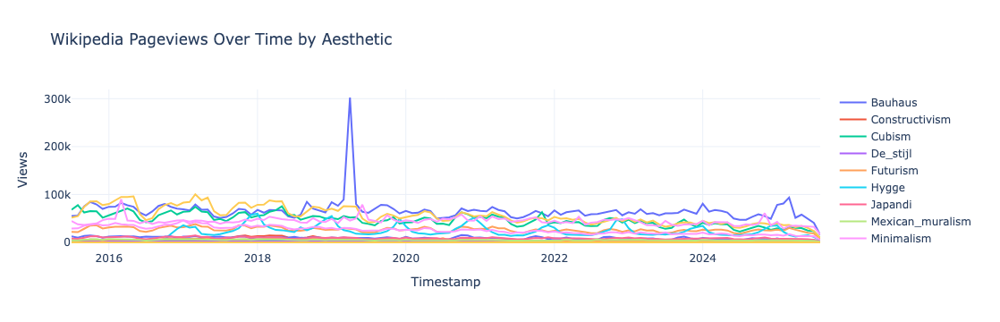

In [40]:
articles = ['Coastal_Style',
 'Constructivism',
 'Scandinavian_Design',
 'International_Typographic_Style',
 'Precisionism',
 'Minimalism',
 'Mexican_Muralism',
 'Signalism',
 'Tomato_Girl_Summer',
 'Scandi_Girl_Winter',
 'Wabi-Sabi',
 'Cubism',
 'De_Stijl',
 'Coastal_Cowgirl',
 'Hygge',
 'Modernism',
 'Suprematism',
 'Zenitism',
 'Purism',
 'Futurism',
 'Plakatstil',
 'Japandi',
 'Bauhaus',
 'Vorticism',
 'Op_Art']
# Long-form
formated_articles = format_article_names_for_wiki(articles)
df = get_wiki_pageviews(formated_articles, start="20100101", end="20250901")

# # Pivoted form
pivoted_df = pivot_pageviews_by_timestamp(df)
plot_pageviews_plotly(pivoted_df)

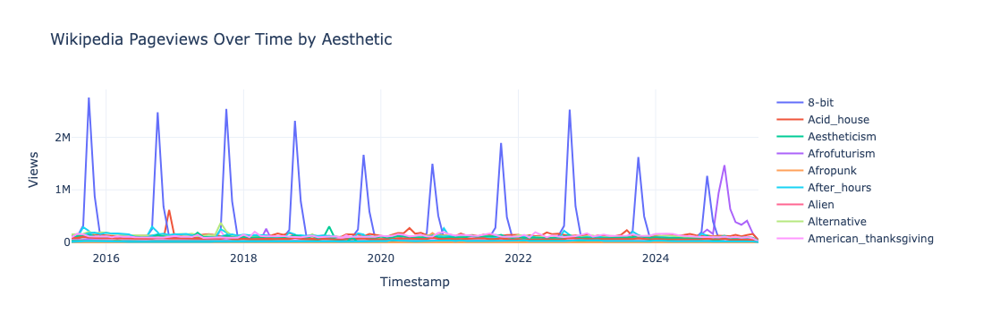

In [41]:
startdate = '19000101'
enddate   = '20280901'

pull_from_saved_data = True

articles = community_list_ordered
# articles = filtered_table['key'].tolist() #only use to save data of every aesthetic

# Long-form
formated_articles = format_article_names_for_wiki(articles)

if not pull_from_saved_data:
    wiki_data = get_wiki_pageviews(formated_articles, start=startdate, end=enddate)
    pivoted_wiki_data = pivot_pageviews_by_timestamp(wiki_data)
    # pivoted_wiki_data.to_csv("aesthetic_wiki_pageviews.csv") #only use to save data of every aesthetic
else:
    pivoted_wiki_data = pd.read_csv("aesthetic_wiki_pageviews.csv", index_col=0, parse_dates=True)
    
    # Convert start/end dates to datetime for filtering
    start_ts = pd.to_datetime(startdate)
    end_ts = pd.to_datetime(enddate)
    
    # Filter by date range
    pivoted_wiki_data = pivoted_wiki_data.loc[start_ts:end_ts]

# Plot
plot_pageviews_plotly(pivoted_wiki_data)

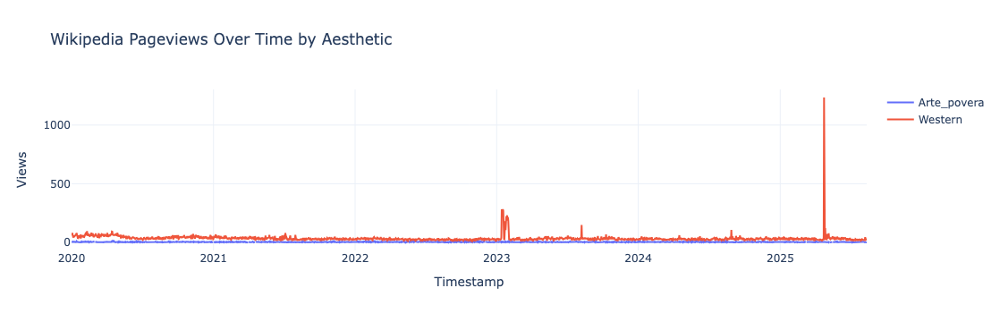

In [42]:
startdate = '20200101'
enddate = '20251201'

articles = ['Western','Arte_povera']


# Long-form
formated_articles_deep = format_article_names_for_wiki(articles)
wiki_data_deep = get_wiki_pageviews(formated_articles_deep, start = startdate, end = enddate, resolution = 'daily')

# Pivoted form
pivoted_wiki_data_deep = pivot_pageviews_by_timestamp(wiki_data_deep)
plot_pageviews_plotly(pivoted_wiki_data_deep)

## Popularity Causal Discovery 

In [47]:
def get_top_upstream_nodes(graph, top_n=10):
    # Compute reachability: number of descendants for each node
    reachability = {
        node: len(nx.descendants(graph, node))
        for node in graph.nodes
    }

    # Sort by reachability (descending)
    top_influencers = sorted(reachability.items(), key=lambda x: x[1], reverse=True)

    # Display top N
    print(f"Top {top_n} most upstream nodes (by number of influenced nodes):\n")
    for rank, (node, count) in enumerate(top_influencers[:top_n], 1):
        print(f"{rank}. {node} → {count} downstream nodes")

    return top_influencers[:top_n]

def get_top_strongest_links(graph, top_n=20):
    # Extract all edges with weights
    edge_weights = nx.get_edge_attributes(graph, "weight")
    
    # Sort by absolute weight (descending)
    top_edges = sorted(edge_weights.items(), key=lambda x: abs(x[1]), reverse=True)

    # Print results
    print(f"Top {top_n} strongest causal links (by absolute weight):\n")
    for rank, ((src, tgt), weight) in enumerate(top_edges[:top_n], 1):
        print(f"{rank}. {src} → {tgt} (weight = {weight:.3f})")
    
    return top_edges[:top_n]

def draw_causal_hierarchy_with_lags(graph, base_aesthetics, max_depth=5):
    # === 1. Find all nodes that match base aesthetic names (with or without lags) ===
    base_pattern = re.compile(f"^({'|'.join(re.escape(a) for a in base_aesthetics)})(\\(t-\\d+\\))?$")
    start_nodes = [node for node in graph.nodes if base_pattern.match(node)]

    # === 2. BFS for layered exploration ===
    visited = set()
    layers = defaultdict(list)
    queue = deque()

    for node in start_nodes:
        queue.append((node, 0))
        visited.add(node)
        layers[0].append(node)

    while queue:
        current_node, layer = queue.popleft()
        if layer >= max_depth:
            continue
        for neighbor in graph.successors(current_node):
            if neighbor not in visited:
                visited.add(neighbor)
                layers[layer + 1].append(neighbor)
                queue.append((neighbor, layer + 1))

    # === 3. Build layered subgraph ===
    sub_nodes = [node for layer_nodes in layers.values() for node in layer_nodes]
    layered_subgraph = graph.subgraph(sub_nodes)

    # === 4. Manual layered layout ===
    pos = {}
    layer_gap = 4
    node_gap = 1.5

    for layer_idx, nodes in layers.items():
        for i, node in enumerate(sorted(nodes)):
            pos[node] = (layer_idx * layer_gap, -i * node_gap)

    # === 5. Draw ===
    plt.figure(figsize=(22, 10))
    nx.draw_networkx_nodes(layered_subgraph, pos, node_size=2000, node_color="#F1E0FF", edgecolors="black")
    nx.draw_networkx_edges(layered_subgraph, pos, edge_color="#666666", arrows=True, width=2, arrowsize=12)
    nx.draw_networkx_labels(layered_subgraph, pos, font_size=10, font_color="black")

    plt.title(f"Causal Flow from: {', '.join(base_aesthetics)}", fontsize=18)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    return layered_subgraph

In [49]:
pivoted_wiki_data

,8-bit,Acid_house,Aestheticism,Afrofuturism,Afropunk,After_hours,Alien,Alternative,American_thanksgiving,Americana,...,Y2k,Yabi,Yakuza,Yandere,Yanki,Yugo-nostalgia,Yuppie,Zazou,Zenitism,Zombie_apocalypse
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,13212.0,18995.0,14007.0,5666.0,111.0,257.0,37396.0,3016.0,NaN,17825.0,...,803.0,NaN,97509.0,8162.0,313.0,1991.0,28667.0,2178.0,106.0,8077.0
2015-08-01,13452.0,18383.0,14565.0,6500.0,492.0,248.0,35913.0,2825.0,NaN,17508.0,...,706.0,NaN,163944.0,10823.0,294.0,2048.0,27088.0,2449.0,69.0,14366.0
2015-09-01,15743.0,17909.0,17183.0,6478.0,135.0,239.0,31337.0,3173.0,NaN,17414.0,...,762.0,NaN,151721.0,9770.0,274.0,1880.0,29422.0,3025.0,114.0,21773.0
2015-10-01,16022.0,17710.0,19321.0,7640.0,93.0,239.0,29244.0,3249.0,NaN,18272.0,...,755.0,NaN,114097.0,7620.0,309.0,2255.0,29106.0,3521.0,154.0,24506.0
2015-11-01,15378.0,18213.0,20196.0,7750.0,84.0,526.0,25467.0,3100.0,NaN,18792.0,...,594.0,NaN,109474.0,6031.0,297.0,2002.0,26559.0,3244.0,120.0,20997.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,1289.0,11622.0,13037.0,14471.0,33.0,214.0,7942.0,877.0,NaN,3241.0,...,469.0,NaN,101032.0,2376.0,848.0,3184.0,20545.0,2215.0,333.0,17306.0
2025-04-01,1247.0,11915.0,11745.0,11368.0,37.0,182.0,7566.0,1101.0,NaN,2056.0,...,677.0,NaN,90271.0,2584.0,707.0,2909.0,21664.0,1984.0,411.0,20585.0
2025-05-01,1113.0,14820.0,12126.0,11267.0,33.0,170.0,7276.0,808.0,NaN,3311.0,...,457.0,NaN,100012.0,2579.0,770.0,3342.0,21607.0,2416.0,420.0,21054.0


In [51]:
use_saved = True

lag = 5
# STEP 1: Filter out aesthetics with too much missing data
filtered = pivoted_wiki_data.dropna(axis=1, thresh=30)  # keep aesthetics with ≥ 30 months of data

# STEP 2: Interpolate missing values (linear interpolation)
interpolated = filtered.interpolate(method='linear', limit_direction='both')

# STEP 3: Prepare data for Tigramite
data_array = interpolated.values  # shape: (time, variables)
var_names = interpolated.columns.tolist()

tigra_df = TigraDataFrame(data_array, var_names=var_names)

# STEP 4: Run PCMCI
pcmci = PCMCI(dataframe=tigra_df, cond_ind_test=ParCorr())

if not use_saved:
    # You can adjust tau_max depending on what you consider a plausible causal lag
    results = pcmci.run_pcmci(tau_max=lag, pc_alpha=0.05)
    # joblib.dump(results, 'pcmci_results.pkl') #perminantly save result

else:
    results = joblib.load('pcmci_results.pkl')
    
# STEP 5: Print Significant Causal Links
print("\nSignificant Causal Relationships:")
pcmci.print_significant_links(p_matrix=results['p_matrix'],
                              val_matrix=results['val_matrix'],
                              alpha_level=0.05)

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)

/opt/anaconda3/lib/python3.12/site-packages/tigramite/data_processing.py:308: UserWarning:

In analysis mode 'single', 'data'.shape = (121, 343); is it of shape (observations, variables)?



In [53]:
alpha = 0.05 #<------------------------------ this is the statistical significance we are testing at
alpha_correction = False

p_matrix = results['p_matrix']
val_matrix = results['val_matrix']

# Clear and rebuild graph
aesthetic_causal_graph = nx.DiGraph()

# Set significance threshold

if alpha_correction:
    numb_test_performed = float((pivoted_wiki_data.shape[1]-1)*((pivoted_wiki_data.shape[1]-1)*lag))
    alpha = alpha/numb_test_performed #Bonferroni correction

num_vars = len(var_names)
max_lag_index = p_matrix.shape[2]

# Build full causal graph
for target in range(num_vars):
    for source in range(num_vars):
        for lag in range(1, max_lag_index):  # lag = 1 to tau_max
            p_val = p_matrix[target, source, lag]
            val = val_matrix[target, source, lag]

            if p_val < alpha:
                source_node = f"{var_names[source]}(t-{lag})"
                target_node = var_names[target]
                aesthetic_causal_graph.add_edge(source_node, target_node, weight=val)

for target in range(num_vars):
    for source in range(num_vars):
        for lag in range(1, max_lag_index):
            if p_matrix[target, source, lag] < alpha:
                source_node = f"{var_names[source]}(t-{lag})"
                target_node = var_names[target]
                aesthetic_causal_graph.add_edge(source_node, target_node, weight=val_matrix[target, source, lag])

print(f"Graph with {aesthetic_causal_graph.number_of_nodes()} nodes and {aesthetic_causal_graph.number_of_edges()} edges.")

# === PageRank filter ===
pagerank = nx.pagerank(aesthetic_causal_graph, alpha=0.85)
filtered_graph = nx.subgraph_view(aesthetic_causal_graph, filter_node=lambda n: pagerank.get(n, 0) > 0.001)

# === Visual styling ===
pr_vals = np.array([pagerank[n] for n in filtered_graph.nodes()])
norm = Normalize(vmin=pr_vals.min(), vmax=pr_vals.max())
colors = [cm.viridis(np.sqrt(norm(pagerank[n]*1000))*0.1) for n in filtered_graph.nodes()]
sizes = [3000 + 60000 * pagerank[n] for n in filtered_graph.nodes()]

# # === Plot ===
# plt.figure(figsize=(40, 40))
# pos = nx.spring_layout(filtered_graph, k=0.5, iterations=100)

# nx.draw_networkx_nodes(
#     filtered_graph, pos,
#     node_color=colors,
#     node_size=sizes,
#     edgecolors="black",
#     linewidths=1.5
# )

# nx.draw_networkx_edges(
#     filtered_graph, pos,
#     edge_color="#666666",
#     width=2,
#     alpha=0.5
# )

# nx.draw_networkx_labels(
#     filtered_graph, pos,
#     font_size=26,
#     font_color="black",
#     font_family="sans-serif"
# )

# plt.title("Wikipedia Aesthetic Causal Graph via PCMCI (Stylized)", fontsize=36)
# plt.axis("off")
# plt.tight_layout()
# plt.show()


Graph with 2058 nodes and 38597 edges.


In [55]:
top_upstream = get_top_upstream_nodes(aesthetic_causal_graph, top_n=10) #not so useful in full graph

Top 10 most upstream nodes (by number of influenced nodes):

1. Minimal_wave(t-1) → 82 downstream nodes
2. Playboy(t-4) → 73 downstream nodes
3. Bardcore(t-3) → 72 downstream nodes
4. Steampunk(t-4) → 69 downstream nodes
5. Ukiyo-e(t-1) → 68 downstream nodes
6. Webcore(t-2) → 66 downstream nodes
7. Post-punk(t-1) → 63 downstream nodes
8. Shabby_chic(t-1) → 62 downstream nodes
9. Peeps(t-4) → 58 downstream nodes
10. Hypebeast(t-4) → 56 downstream nodes


In [57]:
top_strongest_links = get_top_strongest_links(aesthetic_causal_graph, top_n = 15) #very useful in full graph

Top 15 strongest causal links (by absolute weight):

1. Halloween(t-1) → Oktoberfest (weight = 0.881)
2. Solarpunk(t-3) → Hip-hop (weight = 0.777)
3. Film_noir(t-2) → Nerdcore (weight = 0.767)
4. New_beat(t-3) → Hip-hop (weight = 0.750)
5. Foodie(t-1) → Nerdcore (weight = 0.745)
6. Rococo(t-3) → Afropunk (weight = 0.731)
7. 8-bit(t-1) → 8-bit (weight = 0.727)
8. Trillwave(t-1) → Trillwave (weight = 0.712)
9. Western(t-1) → Arte_povera (weight = 0.695)
10. Webcore(t-2) → Bauhaus (weight = 0.692)
11. Hypebeast(t-1) → Hypebeast (weight = 0.689)
12. Mallgoth(t-1) → Mallgoth (weight = 0.687)
13. Post-impressionism(t-1) → Post-impressionism (weight = 0.686)
14. Analog_horror(t-1) → Analog_horror (weight = 0.686)
15. Lo-fi(t-1) → Lo-fi (weight = 0.685)


In [59]:
#draw_causal_hierarchy_with_lags(aesthetic_causal_graph, ["Minimal_wave"], max_depth=10)

## Collapsed Graph

In [62]:
def collapse_time_lagged_nodes(graph, min_weight=0.0, mode='decay'):
    """
    Collapse a time-lagged graph by aggregating weights across time-lagged nodes.

    Parameters:
    - graph: original time-lagged DiGraph
    - min_weight: minimum weight to retain in collapsed graph
    - mode: one of 'decay', 'max', or 'sum'
    """
    assert mode in ['decay', 'max', 'sum'], "Mode must be 'decay', 'max', or 'sum'"

    collapsed_graph = nx.DiGraph()
    pattern = re.compile(r"^(.*?)(?:\(t-(\d+)\))?$")  # Capture base name and lag if present

    # === 1. Group nodes by base aesthetic name ===
    aesthetic_groups = defaultdict(list)
    node_lags = {}
    
    for node in graph.nodes():
        match = pattern.match(node)
        if match:
            base_name = match.group(1)
            lag = int(match.group(2)) if match.group(2) else 0
            aesthetic_groups[base_name].append(node)
            node_lags[node] = lag

    # === 2. Combine edges between groups ===
    for base_src, src_variants in aesthetic_groups.items():
        for base_tgt, tgt_variants in aesthetic_groups.items():
            if base_src == base_tgt:
                continue

            weights = []
            for src_node in src_variants:
                for tgt_node in tgt_variants:
                    if graph.has_edge(src_node, tgt_node):
                        w = graph[src_node][tgt_node]['weight']
                        lag = node_lags[src_node]
                        if mode == 'decay':
                            adjusted = w / lag if lag > 0 else w
                        else:
                            adjusted = w
                        weights.append(adjusted)

            if weights:
                if mode == 'max':
                    final_weight = max(weights)
                elif mode == 'sum':
                    final_weight = sum(weights)
                else:  # decay
                    final_weight = sum(weights)

                if final_weight > min_weight:
                    collapsed_graph.add_edge(base_src, base_tgt, weight=final_weight)

    return collapsed_graph

def lagged_correlations(source, sink, pivoted_wiki_data, k=5):
    """
    Compute Pearson correlations between source(t - lag) and sink(t)
    for lags from 0 to k using raw pivoted_wiki_data.
    
    Parameters:
        source (str): Name of the source aesthetic.
        sink (str): Name of the sink aesthetic.
        pivoted_wiki_data (DataFrame): Raw time series data.
        k (int): Maximum lag to consider.

    Returns:
        dict: Mapping lag → {'correlation': r, 'p-value': p}
    """
    results = {}

    if source not in pivoted_wiki_data.columns or sink not in pivoted_wiki_data.columns:
        print(f"One or both columns not found: {source}, {sink}")
        return results

    x = pivoted_wiki_data[source].values
    y = pivoted_wiki_data[sink].values

    for lag in range(k + 1):
        if lag == 0:
            x_lagged = x
            y_lagged = y
        else:
            x_lagged = x[:-lag]
            y_lagged = y[lag:]

        if len(x_lagged) < 10:
            continue

        mask = ~np.isnan(x_lagged) & ~np.isnan(y_lagged)
        if np.sum(mask) < 10:
            continue

        r, p = pearsonr(x_lagged[mask], y_lagged[mask])
        results[lag] = {'correlation': r, 'p-value': p}
        print(f"Lag {lag}: corr = {r:.3f}, p = {p:.4f}")

    return results
def plot_k_shortest_influence_paths_horizontal(graph, source, sink, k=5):
    """
    Plots the k shortest paths from source to sink in a horizontal left-to-right layout,
    using log(2 - weight) as the path cost for positive weights only.
    The sink node is forced into the final layer.
    """
    # === Transform weights using log(2 - w) for positive weights only ===
    transformed_graph = nx.DiGraph()
    for u, v, data in graph.edges(data=True):
        w = data.get("weight", 0)
        if w > 0 and w < 2:
            transformed_weight = np.log(2 - w)
            transformed_graph.add_edge(u, v, weight=transformed_weight)

    # === Compute shortest paths ===
    try:
        paths_gen = nx.shortest_simple_paths(transformed_graph, source, sink, weight='weight')
        paths = list(islice(paths_gen, k))
    except nx.NetworkXNoPath:
        print(f"No path from {source} to {sink}.")
        return

    def path_weight(path):
        return sum(transformed_graph[path[i]][path[i + 1]]["weight"] for i in range(len(path) - 1))

    # === Print paths ===
    print(f"\nTop {len(paths)} shortest paths from {source} to {sink} (using log(2 - w)):\n")
    for i, path in enumerate(paths, 1):
        print(f"{i}. {' → '.join(path)} (total transformed weight = {path_weight(path):.3f})")

    # === Build subgraph ===
    sub_nodes = set()
    sub_edges = []
    for path in paths:
        for i in range(len(path) - 1):
            u, v = path[i], path[i + 1]
            sub_nodes.update([u, v])
            sub_edges.append((u, v))

    subgraph = transformed_graph.subgraph(sub_nodes)

    # === Manual horizontal layout ===
    layer_map = {}
    for path in paths:
        for i, node in enumerate(path):
            if node not in layer_map:
                layer_map[node] = i
            else:
                layer_map[node] = min(layer_map[node], i)

    # Push sink to the far-right layer
    max_layer = max(layer_map.values())
    layer_map[sink] = max_layer + 1

    # Assign positions: x by layer, y by index
    layer_nodes = {}
    for node, layer in layer_map.items():
        layer_nodes.setdefault(layer, []).append(node)

    pos = {}
    layer_gap = 3
    node_gap = 1.5
    for layer, nodes in layer_nodes.items():
        for i, node in enumerate(sorted(nodes)):
            pos[node] = (layer * layer_gap, -i * node_gap)

    # === Plot ===
    plt.figure(figsize=(14, 8))
    nx.draw_networkx_nodes(subgraph, pos, node_size=2000, node_color="#AED6F1", edgecolors="black")
    nx.draw_networkx_labels(subgraph, pos, font_size=10)
    nx.draw_networkx_edges(
        subgraph,
        pos,
        edgelist=sub_edges,
        edge_color="black",
        arrows=True,
        arrowstyle='-|>',
        arrowsize=25,
        width=2
    )
    plt.title(f"Top {len(paths)} Shortest Influence Paths from {source} to {sink}", fontsize=14)
    plt.axis("off")
    plt.tight_layout()
    plt.show()

In [64]:
collapsed_graph = collapse_time_lagged_nodes(aesthetic_causal_graph, mode='max')
print(f"Collapsed graph has {collapsed_graph.number_of_nodes()} nodes and {collapsed_graph.number_of_edges()} edges.")


# Compute graph metrics on collapsed graph
betweenness_c = nx.betweenness_centrality(collapsed_graph)
clustering_coefficients = nx.clustering(collapsed_graph.to_undirected())
degree = dict(collapsed_graph.degree())

def filter_betweenness(n):
    return betweenness_c[n]  >= 0.0

betweenness_c

view = nx.subgraph_view(collapsed_graph, filter_node = filter_betweenness)
view

# pos = nx.spring_layout(view, k=1.5)  # You can use different layout algorithms
# # pos = nx.spring_layout(view)  # simple

# plt.figure(figsize=(100, 100))
# node_colors = [0.01*np.log(clustering_coefficients[v]*degree[v]*100) for v in list(view.nodes())]
# node_sizes = [3*3000000 * betweenness_c[v] for v in list(view.nodes())]
# # nx.draw(view, pos, node_size=node_sizes, width=2, node_color = node_colors, font_size=60, with_labels=True)
# nx.draw(view, pos, node_size=100000, width=2, font_size=60, with_labels=True) # simple

# plt.show()

Collapsed graph has 343 nodes and 14658 edges.


In [66]:
top_n = 10
[i[0] for i in list(betweenness_c.items())[:top_n]]

['8-bit',
 'Afropunk',
 'Bankara',
 'Constructivism',
 'Cubism',
 'Diner',
 'Film_noir',
 'Futurism',
 'Golden_age_of_detective_fiction',
 'Juggalo']

In [68]:
top_upstream = get_top_upstream_nodes(collapsed_graph, top_n=10)  #much more usefull in collapsed graph

Top 10 most upstream nodes (by number of influenced nodes):

1. 8-bit → 342 downstream nodes
2. Afropunk → 342 downstream nodes
3. Bankara → 342 downstream nodes
4. Constructivism → 342 downstream nodes
5. Cubism → 342 downstream nodes
6. Diner → 342 downstream nodes
7. Film_noir → 342 downstream nodes
8. Futurism → 342 downstream nodes
9. Golden_age_of_detective_fiction → 342 downstream nodes
10. Juggalo → 342 downstream nodes


In [70]:
# draw_causal_hierarchy_with_lags(collapsed_graph, ["Mallsoft"], max_depth=10) 

In [72]:
top_strongest_links = get_top_strongest_links(collapsed_graph, top_n=15) #not as usefull in collapsed graph

Top 15 strongest causal links (by absolute weight):

1. Halloween → Oktoberfest (weight = 0.881)
2. Solarpunk → Hip-hop (weight = 0.777)
3. Film_noir → Nerdcore (weight = 0.767)
4. New_beat → Hip-hop (weight = 0.750)
5. Foodie → Nerdcore (weight = 0.745)
6. Rococo → Afropunk (weight = 0.731)
7. Western → Arte_povera (weight = 0.695)
8. Webcore → Bauhaus (weight = 0.692)
9. Skeuomorphism → Solarpunk (weight = 0.683)
10. Bauhaus → Stilyagi (weight = 0.660)
11. Solarpunk → Northern_soul (weight = 0.636)
12. Bosozoku → Solarpunk (weight = 0.623)
13. Arte_povera → Bauhaus (weight = 0.613)
14. Bosozoku → New_beat (weight = 0.595)
15. Ultras → Glam_rock (weight = 0.591)


In [74]:
lagged_correlations("Film_noir", "Hip-hop", pivoted_wiki_data, k=5)

Lag 0: corr = -0.084, p = 0.3624
Lag 1: corr = -0.074, p = 0.4206
Lag 2: corr = -0.068, p = 0.4616
Lag 3: corr = -0.059, p = 0.5266
Lag 4: corr = -0.054, p = 0.5648
Lag 5: corr = -0.046, p = 0.6238


{0: {'correlation': -0.08351748917941648, 'p-value': 0.3624277516260494},
 1: {'correlation': -0.07418983823278147, 'p-value': 0.42063906353217095},
 2: {'correlation': -0.06812886651363405, 'p-value': 0.46160321536180393},
 3: {'correlation': -0.05886919875063372, 'p-value': 0.5265865450496138},
 4: {'correlation': -0.05375857009022369, 'p-value': 0.5648442536888058},
 5: {'correlation': -0.046014146341903775, 'p-value': 0.62379399201477}}

In [76]:
# plot_k_shortest_influence_paths_horizontal(collapsed_graph, "Western", "Yuppie", k=5)

# Community Causality

In [79]:
# Create a new DataFrame to hold standardized & averaged traffic per community
summed_traffic = pd.DataFrame(index=pivoted_wiki_data.index)

# Loop over each community
for name, articles in communities.items():
    # Format article names to match DataFrame columns
    formatted_articles = format_article_names_for_wiki(articles)
    
    # Keep only those present in pivoted_wiki_data
    valid_articles = [a for a in formatted_articles if a in pivoted_wiki_data.columns]
    
    if not valid_articles:
        continue  # skip empty communities

    # Standardize each column by its max (avoiding division by zero)
    standardized = pivoted_wiki_data[valid_articles].apply(
        lambda col: (col-col.min()) / (col.max()-col.min()) if col.max() != 0 else col
    )

    # Average the standardized values across the columns
    averaged = standardized.sum(axis=1) / len(valid_articles)

    # Create a descriptive column name with top 3 betweenness nodes
    label = str(name) + ":" + ", ".join(list(community_betweenness[name].keys())[:3])
    summed_traffic[label] = averaged


summed_traffic.index = pd.to_datetime(summed_traffic.index)
summed_traffic['month'] = summed_traffic.index.month
summed_traffic['total_wiki_interest'] = pivoted_wiki_data.sum(axis=1)
# Resulting DataFrame: each column is a community-level averaged normalized traffic time series
summed_traffic

,"0:Cottagecore, Preppy, Dark_Academia","1:McBling, Scene, Y2K","2:Kawaii, Animecore, E-Girl","9:Rockabilly, Burlesque, Greaser","4:Cyberpunk, Y2K_Futurism, Minimalism","5:Punk, Goth, Rave","7:Modernism, Art_Deco, Baroque","8:Femme_Fatale, Maximalism, Mob_Wife","12:Flamenco, Tango",month,total_wiki_interest
timestamp,,,,,,,,,,,
2015-07-01,0.446584,0.341476,0.371409,0.413451,0.326701,0.406330,0.417528,0.312872,0.382010,7,4510678.0
2015-08-01,0.433561,0.344147,0.341273,0.423888,0.302311,0.437750,0.404466,0.289409,0.417486,8,4668078.0
2015-09-01,0.433991,0.341016,0.328296,0.414685,0.343189,0.446561,0.489016,0.288422,0.532178,9,5357586.0
2015-10-01,0.393943,0.344248,0.353113,0.422482,0.367082,0.478588,0.538079,0.294071,0.616940,10,7990009.0
2015-11-01,0.387708,0.323915,0.330076,0.393967,0.343770,0.440653,0.521049,0.304167,0.558263,11,5797887.0
...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,0.336219,0.325275,0.408369,0.302436,0.289398,0.384526,0.356600,0.353664,0.349864,3,4376480.0
2025-04-01,0.248968,0.263238,0.354481,0.292300,0.252397,0.327138,0.323252,0.311151,0.310242,4,3804706.0
2025-05-01,0.282180,0.281230,0.335189,0.312022,0.271141,0.350399,0.337989,0.257058,0.353415,5,4144773.0


In [81]:
use_saved = False
lag = 13

# STEP 1: Filter out communities with too much missing data
filtered = summed_traffic.dropna(axis=1, thresh=30)  # keep communities with ≥ 30 months of data

# STEP 2: Interpolate missing values (linear interpolation)
interpolated = filtered.interpolate(method='linear', limit_direction='both')

# STEP 3: Prepare data for Tigramite
data_array = interpolated.values  # shape: (time, variables)
var_names = interpolated.columns.tolist()

tigra_df = TigraDataFrame(data_array, var_names=var_names)

# STEP 4: Run PCMCI
pcmci = PCMCI(dataframe=tigra_df, cond_ind_test=ParCorr())

if not use_saved:
    results = pcmci.run_pcmci(tau_max=lag, pc_alpha=0.05)
    # joblib.dump(results, 'pcmci_results_community.pkl')  # Save results for reuse
else:
    results = joblib.load('pcmci_results_community.pkl')

# STEP 5: Print Significant Causal Links
print("\nSignificant Causal Relationships:")
pcmci.print_significant_links(
    p_matrix=results['p_matrix'],
    val_matrix=results['val_matrix'],
    alpha_level=0.05
)


Significant Causal Relationships:

## Significant links at alpha = 0.05:

    Variable 0:Cottagecore, Preppy, Dark_Academia has 23 link(s):
        (5:Punk, Goth, Rave  0): pval = 0.00000 | val =  0.829
        (9:Rockabilly, Burlesque, Greaser  0): pval = 0.00000 | val =  0.746
        (1:McBling, Scene, Y2K  0): pval = 0.00000 | val =  0.715
        (7:Modernism, Art_Deco, Baroque  0): pval = 0.00000 | val =  0.689
        (2:Kawaii, Animecore, E-Girl  0): pval = 0.00000 | val =  0.675
        (total_wiki_interest  0): pval = 0.00000 | val =  0.664
        (8:Femme_Fatale, Maximalism, Mob_Wife  0): pval = 0.00000 | val =  0.646
        (4:Cyberpunk, Y2K_Futurism, Minimalism  0): pval = 0.00000 | val =  0.599
        (12:Flamenco, Tango  0): pval = 0.00001 | val =  0.460
        (5:Punk, Goth, Rave -7): pval = 0.00205 | val =  0.324
        (4:Cyberpunk, Y2K_Futurism, Minimalism -1): pval = 0.00563 | val = -0.291
        (7:Modernism, Art_Deco, Baroque -3): pval = 0.01244 | val =  0.

In [83]:
correction_method = "none"  # Options: "none", "bonferroni", "stepdown"
alpha = 0.05

p_matrix = results['p_matrix']
val_matrix = results['val_matrix']
num_vars = len(var_names)
max_lag_index = p_matrix.shape[2]

# Step 1: Collect all p-values
all_tests = []
for target in range(num_vars):
    for source in range(num_vars):
        for l in range(1, max_lag_index):
            p_val = p_matrix[target, source, l]
            val = val_matrix[target, source, l]
            all_tests.append((p_val, source, target, l, val))

# Step 2: Apply correction
if correction_method == "bonferroni":
    corrected_alpha = alpha / len(all_tests)
    significant = [(p < corrected_alpha, source, target, l, val)
                   for (p, source, target, l, val) in all_tests]

elif correction_method == "stepdown":
    pvals = [t[0] for t in all_tests]
    reject, _, _, _ = multipletests(pvals, alpha=alpha, method='holm')
    significant = [(rej, t[1], t[2], t[3], t[4])
                   for rej, t in zip(reject, all_tests)]

else:  # "none"
    significant = [(p < alpha, source, target, l, val)
                   for (p, source, target, l, val) in all_tests]

# Step 3: Build causal graph
community_causal_graph = nx.DiGraph()
for keep, source, target, l, val in significant:
    if keep:
        source_node = f"{var_names[source]}(t-{l})"
        target_node = var_names[target]
        community_causal_graph.add_edge(source_node, target_node, weight=val)

print(f"Graph with {community_causal_graph.number_of_nodes()} nodes and {community_causal_graph.number_of_edges()} edges.")

# === PageRank filter ===
pagerank = nx.pagerank(community_causal_graph, alpha=0.85)
filtered_graph = nx.subgraph_view(community_causal_graph, filter_node=lambda n: pagerank.get(n, 0) > 0.001)

# === Visual styling ===
pr_vals = np.array([pagerank[n] for n in filtered_graph.nodes()])
norm = Normalize(vmin=pr_vals.min(), vmax=pr_vals.max())
colors = [cm.viridis(np.sqrt(norm(pagerank[n] * 1000)) * 0.1) for n in filtered_graph.nodes()]
sizes = [3000 + 60000 * pagerank[n] for n in filtered_graph.nodes()]

# # === Plot ===
# plt.figure(figsize=(40, 40))
# pos = nx.spring_layout(filtered_graph, k=0.5, iterations=100)

# nx.draw_networkx_nodes(
#     filtered_graph, pos,
#     node_color=colors,
#     node_size=sizes,
#     edgecolors="black",
#     linewidths=1.5
# )

# nx.draw_networkx_edges(
#     filtered_graph, pos,
#     edge_color="#666666",
#     width=2,
#     alpha=0.5
# )

# nx.draw_networkx_labels(
#     filtered_graph, pos,
#     font_size=26,
#     font_color="black",
#     font_family="sans-serif"
# )

# plt.title("Wikipedia Community Causal Graph via PCMCI (Stylized)", fontsize=36)
# plt.axis("off")
# plt.tight_layout()
# plt.show()

Graph with 91 nodes and 127 edges.


In [85]:
top_upstream = get_top_upstream_nodes(community_causal_graph, top_n=10) #not so useful in full graph

print("___________________________")

top_strongest_links = get_top_strongest_links(community_causal_graph, top_n = 15) #very useful in full graph

Top 10 most upstream nodes (by number of influenced nodes):

1. 1:McBling, Scene, Y2K(t-4) → 5 downstream nodes
2. 12:Flamenco, Tango(t-8) → 4 downstream nodes
3. 12:Flamenco, Tango(t-1) → 4 downstream nodes
4. 9:Rockabilly, Burlesque, Greaser(t-4) → 3 downstream nodes
5. total_wiki_interest(t-1) → 3 downstream nodes
6. 9:Rockabilly, Burlesque, Greaser(t-1) → 3 downstream nodes
7. 7:Modernism, Art_Deco, Baroque(t-1) → 3 downstream nodes
8. 8:Femme_Fatale, Maximalism, Mob_Wife(t-1) → 3 downstream nodes
9. 9:Rockabilly, Burlesque, Greaser(t-3) → 3 downstream nodes
10. 5:Punk, Goth, Rave(t-5) → 3 downstream nodes
___________________________
Top 15 strongest causal links (by absolute weight):

1. month(t-12) → month (weight = 1.000)
2. month(t-1) → month (weight = 0.862)
3. month(t-13) → month (weight = 0.862)
4. month(t-9) → month (weight = -0.690)
5. 12:Flamenco, Tango(t-1) → 12:Flamenco, Tango (weight = 0.636)
6. month(t-5) → month (weight = 0.627)
7. month(t-6) → month (weight = -0.556

### Communities Collapsed:

In [88]:
collapsed_com_graph = collapse_time_lagged_nodes(community_causal_graph, mode='max')
print(f"Collapsed graph has {collapsed_com_graph.number_of_nodes()} nodes and {collapsed_com_graph.number_of_edges()} edges.")


# Compute graph metrics on collapsed graph
betweenness_c = nx.betweenness_centrality(collapsed_com_graph)
clustering_coefficients = nx.clustering(collapsed_com_graph.to_undirected())
degree = dict(collapsed_com_graph.degree())

def filter_betweenness(n):
    return betweenness_c[n]  >= 0.0

betweenness_c

view = nx.subgraph_view(collapsed_com_graph, filter_node = filter_betweenness)
view

# pos = nx.spring_layout(view, k=1.5)  # You can use different layout algorithms
# # pos = nx.spring_layout(view)  # simple

# plt.figure(figsize=(100, 100))
# node_colors = [0.01*np.log(clustering_coefficients[v]*degree[v]*100) for v in list(view.nodes())]
# node_sizes = [3*3000000 * betweenness_c[v] for v in list(view.nodes())]
# nx.draw(view, pos, node_size=node_sizes, width=2, node_color = node_colors, font_size=60, with_labels=True)
# # nx.draw(view, pos, node_size=100000, width=2, font_size=60, with_labels=True) # simple

# plt.show()

Collapsed graph has 10 nodes and 44 edges.


In [90]:
top_n = 10
[i[0] for i in list(betweenness_c.items())[:top_n]]

['1:McBling, Scene, Y2K',
 '0:Cottagecore, Preppy, Dark_Academia',
 '9:Rockabilly, Burlesque, Greaser',
 '8:Femme_Fatale, Maximalism, Mob_Wife',
 '12:Flamenco, Tango',
 'total_wiki_interest',
 '2:Kawaii, Animecore, E-Girl',
 '5:Punk, Goth, Rave',
 '7:Modernism, Art_Deco, Baroque',
 '4:Cyberpunk, Y2K_Futurism, Minimalism']

In [92]:
top_upstream = get_top_upstream_nodes(collapsed_com_graph, top_n=10)  #much more usefull in collapsed graph

Top 10 most upstream nodes (by number of influenced nodes):

1. 1:McBling, Scene, Y2K → 9 downstream nodes
2. 0:Cottagecore, Preppy, Dark_Academia → 9 downstream nodes
3. 9:Rockabilly, Burlesque, Greaser → 9 downstream nodes
4. 8:Femme_Fatale, Maximalism, Mob_Wife → 9 downstream nodes
5. 12:Flamenco, Tango → 9 downstream nodes
6. total_wiki_interest → 9 downstream nodes
7. 2:Kawaii, Animecore, E-Girl → 9 downstream nodes
8. 5:Punk, Goth, Rave → 9 downstream nodes
9. 7:Modernism, Art_Deco, Baroque → 9 downstream nodes
10. 4:Cyberpunk, Y2K_Futurism, Minimalism → 9 downstream nodes


In [94]:
# draw_causal_hierarchy_with_lags(collapsed_com_graph, ["0:Dandy, Preppy, Peacock_Revolution"], max_depth=10) 

In [96]:
top_strongest_links = get_top_strongest_links(collapsed_com_graph, top_n=15) #not as usefull in collapsed graph


Top 15 strongest causal links (by absolute weight):

1. 8:Femme_Fatale, Maximalism, Mob_Wife → 5:Punk, Goth, Rave (weight = 0.367)
2. 5:Punk, Goth, Rave → 12:Flamenco, Tango (weight = 0.342)
3. 9:Rockabilly, Burlesque, Greaser → 7:Modernism, Art_Deco, Baroque (weight = 0.337)
4. total_wiki_interest → 9:Rockabilly, Burlesque, Greaser (weight = 0.325)
5. 0:Cottagecore, Preppy, Dark_Academia → 5:Punk, Goth, Rave (weight = 0.324)
6. 12:Flamenco, Tango → 5:Punk, Goth, Rave (weight = 0.320)
7. total_wiki_interest → 7:Modernism, Art_Deco, Baroque (weight = 0.319)
8. 8:Femme_Fatale, Maximalism, Mob_Wife → 0:Cottagecore, Preppy, Dark_Academia (weight = 0.315)
9. 12:Flamenco, Tango → 9:Rockabilly, Burlesque, Greaser (weight = 0.312)
10. 12:Flamenco, Tango → 2:Kawaii, Animecore, E-Girl (weight = 0.300)
11. 9:Rockabilly, Burlesque, Greaser → 0:Cottagecore, Preppy, Dark_Academia (weight = 0.297)
12. 5:Punk, Goth, Rave → 2:Kawaii, Animecore, E-Girl (weight = 0.297)
13. 2:Kawaii, Animecore, E-Girl → 

In [98]:
lagged_correlations("6:Modernism, Art_Deco, Modernisme", "3:Burlesque, Rockabilly, Americana", summed_traffic, k=5)


One or both columns not found: 6:Modernism, Art_Deco, Modernisme, 3:Burlesque, Rockabilly, Americana


{}

In [100]:
# plot_k_shortest_influence_paths_horizontal(collapsed_com_graph, "6:Modernism, Art_Deco, Modernisme", "3:Burlesque, Rockabilly, Americana", k=5)


# Sub_Communities:
note this is an well thought out section and the previous one is missing a lot of nuances that I have accounted for here

In [103]:
def find_nested_communities(G, communities, min_subgraph_size=5):
    """
    Detects sub-communities within a given dict of communities.

    Parameters:
    - G: NetworkX graph
    - communities: dict {community_id: list of nodes}
    - min_subgraph_size: minimum size to attempt sub-community detection

    Returns:
    - nested_partition: dict mapping 'community.subcommunity' → list of nodes
    """
    from collections import defaultdict
    import community as community_louvain
    nested_partition = {}

    for comm_id, nodes in communities.items():
        subgraph = G.subgraph(nodes)

        # Skip empty or disconnected subgraphs
        if len(subgraph) == 0:
            continue

        # If too small or poorly connected, keep as a single group
        if len(subgraph) < min_subgraph_size or not nx.is_connected(subgraph.to_undirected()):
            nested_partition[f"{comm_id}.0"] = list(subgraph.nodes())
            continue

        # Apply Louvain on the subgraph
        sub_partition = community_louvain.best_partition(subgraph)

        # Group by sub-community
        sub_communities = defaultdict(list)
        for node, sub_id in sub_partition.items():
            label = f"{comm_id}.{sub_id}"
            sub_communities[label].append(node)

        nested_partition.update(sub_communities)

    return nested_partition



nested = find_nested_communities(G, communities)

sub_community_betweenness = {}
for name, articles in nested.items():
    subgraph = G.subgraph(articles)
    sub_community_betweenness[name] = dict(sorted(nx.betweenness_centrality(subgraph).items(), key=lambda item: item[1], reverse=True))

nested

{'0.4': ['Tuscan_Rustic',
  'Ethno-Chic',
  'Bohemian',
  'Northerness',
  'Earthy_Black_Girl',
  'Safari',
  'Adventurecore',
  'Viking',
  'Western',
  'Cabincore',
  'Ligne_Claire',
  'Rustic',
  'Campcore',
  'Granola',
  'French_Provincial_Style',
  'Junglecore'],
 '0.1': ['Preppy',
  'Power_Dressing',
  'Sprezzatura',
  'Pijo',
  'Bon_Chic,_Bon_Genre',
  'Hypebeast',
  'Tenniscore',
  'Jock',
  'Yuppie',
  'Blokette',
  'Popper',
  'Sloanie',
  'Paninaro',
  '1999_Mundane_Office_Space',
  'Metrosexual',
  'Cayetana',
  'La_Sape',
  'Southern_Belle',
  'Blokecore',
  'Dandy'],
 '0.5': ['Downtown_Girl',
  'Clean_Girl',
  'Vanilla_Girl',
  'Thought_Daughter',
  'Peoplehood',
  'That_Girl',
  'Uptown_Girl',
  'TikTok_Preppy',
  'Sad_Beige'],
 '0.3': ['Fairycore',
  'FantasY2K',
  'Shabby_Chic',
  '2014_Girly',
  'Bloomcore',
  'Dolly_Kei',
  'Goblincore',
  'Plant_Mom',
  'Mori_Kei',
  'Twilightcore',
  'Fairy_Grunge',
  'Live_Laugh_Love',
  'Industrial_Design',
  'Danish_Pastel',
  

In [105]:
pivoted_wiki_data

,8-bit,Acid_house,Aestheticism,Afrofuturism,Afropunk,After_hours,Alien,Alternative,American_thanksgiving,Americana,...,Y2k,Yabi,Yakuza,Yandere,Yanki,Yugo-nostalgia,Yuppie,Zazou,Zenitism,Zombie_apocalypse
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,13212.0,18995.0,14007.0,5666.0,111.0,257.0,37396.0,3016.0,NaN,17825.0,...,803.0,NaN,97509.0,8162.0,313.0,1991.0,28667.0,2178.0,106.0,8077.0
2015-08-01,13452.0,18383.0,14565.0,6500.0,492.0,248.0,35913.0,2825.0,NaN,17508.0,...,706.0,NaN,163944.0,10823.0,294.0,2048.0,27088.0,2449.0,69.0,14366.0
2015-09-01,15743.0,17909.0,17183.0,6478.0,135.0,239.0,31337.0,3173.0,NaN,17414.0,...,762.0,NaN,151721.0,9770.0,274.0,1880.0,29422.0,3025.0,114.0,21773.0
2015-10-01,16022.0,17710.0,19321.0,7640.0,93.0,239.0,29244.0,3249.0,NaN,18272.0,...,755.0,NaN,114097.0,7620.0,309.0,2255.0,29106.0,3521.0,154.0,24506.0
2015-11-01,15378.0,18213.0,20196.0,7750.0,84.0,526.0,25467.0,3100.0,NaN,18792.0,...,594.0,NaN,109474.0,6031.0,297.0,2002.0,26559.0,3244.0,120.0,20997.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,1289.0,11622.0,13037.0,14471.0,33.0,214.0,7942.0,877.0,NaN,3241.0,...,469.0,NaN,101032.0,2376.0,848.0,3184.0,20545.0,2215.0,333.0,17306.0
2025-04-01,1247.0,11915.0,11745.0,11368.0,37.0,182.0,7566.0,1101.0,NaN,2056.0,...,677.0,NaN,90271.0,2584.0,707.0,2909.0,21664.0,1984.0,411.0,20585.0
2025-05-01,1113.0,14820.0,12126.0,11267.0,33.0,170.0,7276.0,808.0,NaN,3311.0,...,457.0,NaN,100012.0,2579.0,770.0,3342.0,21607.0,2416.0,420.0,21054.0


In [107]:
# Create a new DataFrame to hold standardized & averaged traffic per community
summed_traffic = pd.DataFrame(index=pivoted_wiki_data.index)
raw_traffic = pd.DataFrame(index=pivoted_wiki_data.index)

# Loop over each community
for name, articles in nested.items():
    # Format article names to match DataFrame columns
    formatted_articles = format_article_names_for_wiki(articles)
    
    # Keep only those present in pivoted_wiki_data
    valid_articles = [a for a in formatted_articles if a in pivoted_wiki_data.columns]
    
    if not valid_articles:
        continue  # skip empty nested

    # Standardize each column by its max (avoiding division by zero)
    standardized = pivoted_wiki_data[valid_articles].apply(
        lambda col: (col-col.min()) / (col.max()-col.min()) if col.max() != 0 else col
    )
    raw = pivoted_wiki_data[valid_articles]

    # Average the standardized values across the columns
    averaged = standardized.sum(axis=1) / len(valid_articles)
    averaged_raw = raw.sum(axis=1) / len(valid_articles)

    # Create a descriptive column name with top 3 betweenness nodes
    label = str(name) + ":" + ", ".join(list(sub_community_betweenness[name].keys())[:3])
    summed_traffic[label] = averaged
    raw_traffic[label] = averaged_raw


summed_traffic.index = pd.to_datetime(summed_traffic.index)
summed_traffic['month'] = summed_traffic.index.month
summed_traffic['total_wiki_interest'] = pivoted_wiki_data.sum(axis=1)

# For each column, calculate the forward difference
forward_diff = summed_traffic.shift(-1) - summed_traffic
# Add a prefix to indicate it's a day-ahead difference
forward_diff.columns = ['D ' + col for col in forward_diff.columns]
# Concatenate to original DataFrame
summed_traffic = pd.concat([summed_traffic, forward_diff], axis=1)
summed_traffic = summed_traffic.iloc[:-1]
true_summed_traffic = summed_traffic
summed_traffic = summed_traffic.iloc[:-13]

# Resulting DataFrame: each column is a community-level averaged normalized traffic time series
raw_traffic.index = pd.to_datetime(raw_traffic.index)
raw_traffic['month'] = raw_traffic.index.month
raw_traffic['total_wiki_interest'] = pivoted_wiki_data.sum(axis=1)

# For each column, calculate the forward difference
forward_diff = raw_traffic.shift(-1) - raw_traffic
# Add a prefix to indicate it's a day-ahead difference
forward_diff.columns = ['D ' + col for col in forward_diff.columns]
# Concatenate to original DataFrame
raw_traffic = pd.concat([raw_traffic, forward_diff], axis=1)
raw_traffic = raw_traffic.iloc[:-1]
true_raw_traffic = raw_traffic
raw_traffic = raw_traffic.iloc[:-13]

summed_traffic

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,"D 7.2:Socialist_Realism, Politicalwave, Soviet_Nostalgia","D 7.0:Art_Deco, Taisho_Roman, Ukiyo-e","D 7.3:Surrealism, Pop_Art, Modernism","D 7.4:Art_Nouveau, Aestheticism, Newlyn_School","D 8.1:Maximalism, Grocery_Girl_Fall, Dopamine_Dressing","D 8.0:Film_Noir, Spy_Fiction, Femme_Fatale","D 8.2:Asian_Baby_Girl, Chunyu","D 12.0:Flamenco, Tango",D month,D total_wiki_interest
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,0.606596,0.553918,0.152502,0.364346,0.265440,0.409167,0.626665,0.587780,0.157364,0.256064,...,-0.007149,-0.021913,0.019294,-0.022691,0.066457,-0.002230,-0.177083,0.035476,1.0,157400.0
2015-08-01,0.593759,0.519751,0.123568,0.355393,0.228721,0.390218,0.854836,0.557707,0.166247,0.305859,...,0.060698,0.000425,0.125827,0.101478,-0.034093,-0.004169,0.041667,0.114691,1.0,689508.0
2015-09-01,0.524876,0.554589,0.326100,0.343013,0.218324,0.399422,0.636227,0.521994,0.182216,0.258477,...,0.059634,0.096955,0.020919,0.055185,0.007768,0.041548,-0.104167,0.084763,1.0,2632423.0
2015-10-01,0.490896,0.494973,0.151899,0.363099,0.212279,0.328394,0.635844,0.503122,0.175157,0.246799,...,-0.041809,0.009499,0.013866,0.003101,0.060719,-0.013829,0.031250,-0.058677,1.0,-2192122.0
2015-11-01,0.482521,0.461261,0.277878,0.337198,0.237949,0.323623,0.571613,0.412954,0.166159,0.269509,...,-0.046702,-0.064899,-0.093102,-0.095607,-0.177685,-0.001518,0.020833,-0.123270,1.0,-1145538.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,0.306745,0.423742,0.129295,0.387485,0.129549,0.548256,0.428226,0.312700,0.225839,0.397884,...,-0.084865,-0.050002,-0.055238,-0.028232,-0.026129,-0.053510,0.116667,-0.086024,1.0,-521107.0
2024-02-01,0.270729,0.334249,0.117239,0.272560,0.126718,0.495877,0.380986,0.290649,0.206981,0.321992,...,0.033225,0.067705,0.020791,0.051051,-0.022254,-0.007950,0.170833,0.064363,1.0,307918.0
2024-03-01,0.284165,0.371580,0.207806,0.339162,0.132925,0.575905,0.383357,0.255972,0.214437,0.353780,...,0.035498,-0.042711,-0.028054,-0.041590,-0.037760,-0.005872,-0.329167,0.021094,1.0,-116642.0


In [109]:
use_saved = False
lag = 13

# STEP 1: Filter out sub_communities with too much missing data
filtered = summed_traffic.dropna(axis=1, thresh=30)  # keep sub_communities with ≥ 30 months of data

# STEP 2: Interpolate missing values (linear interpolation)
interpolated = filtered.interpolate(method='linear', limit_direction='both')

# STEP 3: Prepare data for Tigramite
data_array = interpolated.values  # shape: (time, variables)
var_names = interpolated.columns.tolist()

tigra_df = TigraDataFrame(data_array, var_names=var_names)

# STEP 4: Run PCMCI
pcmci = PCMCI(dataframe=tigra_df, cond_ind_test=ParCorr())

if not use_saved:
    results = pcmci.run_pcmci(tau_max=lag, tau_min=1, pc_alpha=0.05)
    # joblib.dump(results, 'pcmci_results_sub_community.pkl')  # Save results for reuse
else:
    results = joblib.load('pcmci_results_sub_community.pkl')

# STEP 5: Print Significant Causal Links
print("\nSignificant Causal Relationships:")
pcmci.print_significant_links(
    p_matrix=results['p_matrix'],
    val_matrix=results['val_matrix'],
    alpha_level=0.05
)

/opt/anaconda3/lib/python3.12/site-packages/tigramite/independence_tests/parcorr.py:146: ConstantInputWarning:

An input array is constant; the correlation coefficient is not defined.




Significant Causal Relationships:

## Significant links at alpha = 0.05:

    Variable 0.4:Adventurecore, Rustic, Safari has 43 link(s):
        (0.4:Adventurecore, Rustic, Safari -1): pval = 0.00000 | val =  1.000
        (D 0.4:Adventurecore, Rustic, Safari -1): pval = 0.00000 | val =  0.713
        (D 0.4:Adventurecore, Rustic, Safari -2): pval = 0.00002 | val =  0.485
        (7.1:Baroque, Classicism, Medieval -4): pval = 0.00004 | val =  0.475
        (D 0.1:Preppy, Dandy, Paninaro -1): pval = 0.00095 | val =  0.400
        (D 2.4:Kawaii, Gyaru, Kogal -12): pval = 0.00106 | val =  0.391
        (1.0:Normcore, Indie_Sleaze, Surf_Crush -4): pval = 0.00111 | val = -0.390
        (9.2:Americana, Diner, American_Thanksgiving -5): pval = 0.00911 | val = -0.319
        (D 5.1:Mod, Cool_Britannia, Indie -8): pval = 0.00809 | val =  0.319
        (D 5.1:Mod, Cool_Britannia, Indie -10): pval = 0.00851 | val = -0.317
        (D 2.4:Kawaii, Gyaru, Kogal -1): pval = 0.00997 | val =  0.313
   

In [110]:
correction_method = "none"  # Options: "none", "bonferroni", "stepdown"
alpha = 0.10

p_matrix = results['p_matrix']
val_matrix = results['val_matrix']
num_vars = len(var_names)
max_lag_index = p_matrix.shape[2]

# Step 1: Collect all p-values
all_tests = []
for target in range(num_vars):
    for source in range(num_vars):
        for l in range(1, max_lag_index):
            p_val = p_matrix[target, source, l]
            val = val_matrix[target, source, l]
            all_tests.append((p_val, source, target, l, val))

# Step 2: Apply correction
if correction_method == "bonferroni":
    corrected_alpha = alpha / len(all_tests)
    significant = [(p < corrected_alpha, source, target, l, val)
                   for (p, source, target, l, val) in all_tests]

elif correction_method == "stepdown":
    pvals = [t[0] for t in all_tests]
    reject, _, _, _ = multipletests(pvals, alpha=alpha, method='holm')
    significant = [(rej, t[1], t[2], t[3], t[4])
                   for rej, t in zip(reject, all_tests)]

else:  # "none"
    significant = [(p < alpha, source, target, l, val)
                   for (p, source, target, l, val) in all_tests]

# Step 3: Build causal graph
community_causal_graph = nx.DiGraph()
for keep, source, target, l, val in significant:
    if keep:
        source_node = f"{var_names[source]}(t-{l})"
        target_node = var_names[target]
        community_causal_graph.add_edge(source_node, target_node, weight=val)

print(f"Graph with {community_causal_graph.number_of_nodes()} nodes and {community_causal_graph.number_of_edges()} edges.")

# === PageRank filter ===
pagerank = nx.pagerank(community_causal_graph, alpha=0.85)
filtered_graph = nx.subgraph_view(community_causal_graph, filter_node=lambda n: pagerank.get(n, 0) > 0.001)

# === Visual styling ===
pr_vals = np.array([pagerank[n] for n in filtered_graph.nodes()])
norm = Normalize(vmin=pr_vals.min(), vmax=pr_vals.max())
colors = [cm.viridis(np.sqrt(norm(pagerank[n] * 1000)) * 0.1) for n in filtered_graph.nodes()]
sizes = [3000 + 60000 * pagerank[n] for n in filtered_graph.nodes()]

# # === Plot ===
# plt.figure(figsize=(40, 40))
# pos = nx.spring_layout(filtered_graph, k=0.5, iterations=100)

# nx.draw_networkx_nodes(
#     filtered_graph, pos,
#     node_color=colors,
#     node_size=sizes,
#     edgecolors="black",
#     linewidths=1.5
# )

# nx.draw_networkx_edges(
#     filtered_graph, pos,
#     edge_color="#666666",
#     width=2,
#     alpha=0.5
# )

# nx.draw_networkx_labels(
#     filtered_graph, pos,
#     font_size=26,
#     font_color="black",
#     font_family="sans-serif"
# )

# plt.title("Wikipedia Community Causal Graph via PCMCI (Stylized)", fontsize=36)
# plt.axis("off")
# plt.tight_layout()
# plt.show()

Graph with 1226 nodes and 14361 edges.


In [111]:
top_upstream = get_top_upstream_nodes(community_causal_graph, top_n=10) #not so useful in full graph

print("___________________________")

top_strongest_links = get_top_strongest_links(community_causal_graph, top_n = 15) #very useful in full graph

Top 10 most upstream nodes (by number of influenced nodes):

1. 1.2:Scene, Emo, 2010s_Internet(t-1) → 32 downstream nodes
2. 9.1:Yanki, Greaser, Sukeban(t-11) → 30 downstream nodes
3. 5.4:Rave, Disco, Psychedelia(t-1) → 30 downstream nodes
4. 8.0:Film_Noir, Spy_Fiction, Femme_Fatale(t-12) → 30 downstream nodes
5. 0.5:Thought_Daughter, That_Girl, Clean_Girl(t-4) → 29 downstream nodes
6. 1.5:Glitch_Art, Drain, Trillwave(t-11) → 29 downstream nodes
7. 9.3:Rockabilly, Rock_%27n%27_Roll, Raggare(t-2) → 29 downstream nodes
8. 5.1:Mod, Cool_Britannia, Indie(t-4) → 29 downstream nodes
9. 5.2:New_Wave, New_Romantic, Post-Punk(t-8) → 29 downstream nodes
10. 12.0:Flamenco, Tango(t-5) → 29 downstream nodes
___________________________
Top 15 strongest causal links (by absolute weight):

1. 4.0:Minimalism, International_Typographic_Style, Flat_Design(t-1) → 4.0:Minimalism, International_Typographic_Style, Flat_Design (weight = 1.000)
2. 0.1:Preppy, Dandy, Paninaro(t-1) → D 0.1:Preppy, Dandy, Paninar

### Sub_Communities Collapsed:

In [113]:
for a in collapsed_com_graph.nodes():
    if a == 'month':
        print(a)

In [114]:
collapsed_com_graph = collapse_time_lagged_nodes(community_causal_graph, mode='max')
print(f"Collapsed graph has {collapsed_com_graph.number_of_nodes()} nodes and {collapsed_com_graph.number_of_edges()} edges.")


# Compute graph metrics on collapsed graph
betweenness_c = nx.betweenness_centrality(collapsed_com_graph)
clustering_coefficients = nx.clustering(collapsed_com_graph.to_undirected())
degree = dict(collapsed_com_graph.degree())

def filter_betweenness(n):
    return betweenness_c[n]  >= 0.0

betweenness_c

# view = nx.subgraph_view(collapsed_com_graph, filter_node = filter_betweenness)
# view

# pos = nx.spring_layout(view, k=1.5)  # You can use different layout algorithms
# # pos = nx.spring_layout(view)  # simple

# plt.figure(figsize=(100, 100))
# node_colors = [0.01*np.log(clustering_coefficients[v]*degree[v]*100) for v in list(view.nodes())]
# node_sizes = [3*3000000 * betweenness_c[v] for v in list(view.nodes())]
# nx.draw(view, pos, node_size=node_sizes, width=2, node_color = node_colors, font_size=60, with_labels=True)
# # nx.draw(view, pos, node_size=100000, width=2, font_size=60, with_labels=True) # simple

# plt.show()

Collapsed graph has 88 nodes and 2533 edges.


{'0.4:Adventurecore, Rustic, Safari': 0.005122104498468523,
 '1.0:Normcore, Indie_Sleaze, Surf_Crush': 0.0027462244454267057,
 '1.4:McBling, Y2K, Frutiger_Metro': 0.006343464730265614,
 '9.2:Americana, Diner, American_Thanksgiving': 0.002228170445515432,
 '7.1:Baroque, Classicism, Medieval': 0.005803026949869397,
 '7.3:Surrealism, Pop_Art, Modernism': 0.002825131588920997,
 '8.2:Asian_Baby_Girl, Chunyu': 0.0035648991983922933,
 'D 0.4:Adventurecore, Rustic, Safari': 0.002900767144895393,
 'D 0.1:Preppy, Dandy, Paninaro': 0.00865009544081529,
 'D 0.5:Thought_Daughter, That_Girl, Clean_Girl': 0.009211360691626319,
 'D 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic': 0.006113256012106608,
 'D 0.2:Romantic_Academia, Dark_Academia, Light_Academia': 0.008304400872311221,
 'D 1.0:Normcore, Indie_Sleaze, Surf_Crush': 0.0033825572011558524,
 'D 1.3:Baddie, Gangsta_Rap, Bimbocore': 0.010029874874056963,
 'D 1.4:McBling, Y2K, Frutiger_Metro': 0.005572858145894557,
 'D 2.4:Kawaii, Gyaru, Kogal':

In [115]:
top_n = 10
[i[0] for i in list(betweenness_c.items())[:top_n]]

['0.4:Adventurecore, Rustic, Safari',
 '1.0:Normcore, Indie_Sleaze, Surf_Crush',
 '1.4:McBling, Y2K, Frutiger_Metro',
 '9.2:Americana, Diner, American_Thanksgiving',
 '7.1:Baroque, Classicism, Medieval',
 '7.3:Surrealism, Pop_Art, Modernism',
 '8.2:Asian_Baby_Girl, Chunyu',
 'D 0.4:Adventurecore, Rustic, Safari',
 'D 0.1:Preppy, Dandy, Paninaro',
 'D 0.5:Thought_Daughter, That_Girl, Clean_Girl']

In [116]:
top_upstream = get_top_upstream_nodes(collapsed_com_graph, top_n=10)  #much more usefull in collapsed graph

Top 10 most upstream nodes (by number of influenced nodes):

1. 0.1:Preppy, Dandy, Paninaro → 87 downstream nodes
2. 0.5:Thought_Daughter, That_Girl, Clean_Girl → 87 downstream nodes
3. 0.3:Cottagecore, Shabby_Chic, Goblincore → 87 downstream nodes
4. 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic → 87 downstream nodes
5. 0.2:Romantic_Academia, Dark_Academia, Light_Academia → 87 downstream nodes
6. 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother → 87 downstream nodes
7. 1.5:Glitch_Art, Drain, Trillwave → 87 downstream nodes
8. 1.3:Baddie, Gangsta_Rap, Bimbocore → 87 downstream nodes
9. 1.2:Scene, Emo, 2010s_Internet → 87 downstream nodes
10. 2.1:Dark_Nymphet, Waif, Dollette → 87 downstream nodes


In [117]:
# draw_causal_hierarchy_with_lags(collapsed_com_graph, ["0.0:Preppy, Pijo, Yuppie"], max_depth=10) 

In [118]:
top_strongest_links = get_top_strongest_links(collapsed_com_graph, top_n=15) #not as usefull in collapsed graph

Top 15 strongest causal links (by absolute weight):

1. 0.1:Preppy, Dandy, Paninaro → D 0.1:Preppy, Dandy, Paninaro (weight = 1.000)
2. 0.5:Thought_Daughter, That_Girl, Clean_Girl → D 0.5:Thought_Daughter, That_Girl, Clean_Girl (weight = 1.000)
3. 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic → D 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic (weight = 1.000)
4. 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother → D 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother (weight = 1.000)
5. 1.5:Glitch_Art, Drain, Trillwave → D 1.5:Glitch_Art, Drain, Trillwave (weight = 1.000)
6. 1.2:Scene, Emo, 2010s_Internet → D 1.2:Scene, Emo, 2010s_Internet (weight = 1.000)
7. 2.1:Dark_Nymphet, Waif, Dollette → D 2.1:Dark_Nymphet, Waif, Dollette (weight = 1.000)
8. 2.3:E-Girl, Babygirl, Lovecore → D 2.3:E-Girl, Babygirl, Lovecore (weight = 1.000)
9. 2.2:Fairy_Kei, Yume_Kawaii, Decora → D 2.2:Fairy_Kei, Yume_Kawaii, Decora (weight = 1.000)
10. 2.4:Kawaii, Gyaru, Kogal → D 2.4:Kawaii, Gyaru, Kogal (weig

In [119]:
lagged_correlations("9.0:Whimsigothic, New_Age, Silkpunk", "7.4:Gyaru, Girly_Kei, Jirai_Kei", summed_traffic, k=5)

One or both columns not found: 9.0:Whimsigothic, New_Age, Silkpunk, 7.4:Gyaru, Girly_Kei, Jirai_Kei


{}

In [120]:
# plot_k_shortest_influence_paths_horizontal(collapsed_com_graph, "9.0:Whimsigothic, New_Age, Silkpunk", "7.4:Gyaru, Girly_Kei, Jirai_Kei", k=5)


# Predict

In [135]:
summed_traffic

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,"D 7.2:Socialist_Realism, Politicalwave, Soviet_Nostalgia","D 7.0:Art_Deco, Taisho_Roman, Ukiyo-e","D 7.3:Surrealism, Pop_Art, Modernism","D 7.4:Art_Nouveau, Aestheticism, Newlyn_School","D 8.1:Maximalism, Grocery_Girl_Fall, Dopamine_Dressing","D 8.0:Film_Noir, Spy_Fiction, Femme_Fatale","D 8.2:Asian_Baby_Girl, Chunyu","D 12.0:Flamenco, Tango",D month,D total_wiki_interest
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,0.606596,0.553918,0.152502,0.364346,0.265440,0.409167,0.626665,0.587780,0.157364,0.256064,...,-0.007149,-0.021913,0.019294,-0.022691,0.066457,-0.002230,-0.177083,0.035476,1.0,157400.0
2015-08-01,0.593759,0.519751,0.123568,0.355393,0.228721,0.390218,0.854836,0.557707,0.166247,0.305859,...,0.060698,0.000425,0.125827,0.101478,-0.034093,-0.004169,0.041667,0.114691,1.0,689508.0
2015-09-01,0.524876,0.554589,0.326100,0.343013,0.218324,0.399422,0.636227,0.521994,0.182216,0.258477,...,0.059634,0.096955,0.020919,0.055185,0.007768,0.041548,-0.104167,0.084763,1.0,2632423.0
2015-10-01,0.490896,0.494973,0.151899,0.363099,0.212279,0.328394,0.635844,0.503122,0.175157,0.246799,...,-0.041809,0.009499,0.013866,0.003101,0.060719,-0.013829,0.031250,-0.058677,1.0,-2192122.0
2015-11-01,0.482521,0.461261,0.277878,0.337198,0.237949,0.323623,0.571613,0.412954,0.166159,0.269509,...,-0.046702,-0.064899,-0.093102,-0.095607,-0.177685,-0.001518,0.020833,-0.123270,1.0,-1145538.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,0.306745,0.423742,0.129295,0.387485,0.129549,0.548256,0.428226,0.312700,0.225839,0.397884,...,-0.084865,-0.050002,-0.055238,-0.028232,-0.026129,-0.053510,0.116667,-0.086024,1.0,-521107.0
2024-02-01,0.270729,0.334249,0.117239,0.272560,0.126718,0.495877,0.380986,0.290649,0.206981,0.321992,...,0.033225,0.067705,0.020791,0.051051,-0.022254,-0.007950,0.170833,0.064363,1.0,307918.0
2024-03-01,0.284165,0.371580,0.207806,0.339162,0.132925,0.575905,0.383357,0.255972,0.214437,0.353780,...,0.035498,-0.042711,-0.028054,-0.041590,-0.037760,-0.005872,-0.329167,0.021094,1.0,-116642.0


In [137]:
tigra_df.var_names

['0.4:Adventurecore, Rustic, Safari',
 '0.1:Preppy, Dandy, Paninaro',
 '0.5:Thought_Daughter, That_Girl, Clean_Girl',
 '0.3:Cottagecore, Shabby_Chic, Goblincore',
 '0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic',
 '0.2:Romantic_Academia, Dark_Academia, Light_Academia',
 '0.0:Dark_Nautical, Fisherman, Coastal_Grandmother',
 '1.0:Normcore, Indie_Sleaze, Surf_Crush',
 '1.5:Glitch_Art, Drain, Trillwave',
 '1.3:Baddie, Gangsta_Rap, Bimbocore',
 '1.4:McBling, Y2K, Frutiger_Metro',
 '1.2:Scene, Emo, 2010s_Internet',
 '1.1:8-Bit, Pixel_UI, PC-98',
 '2.1:Dark_Nymphet, Waif, Dollette',
 '2.3:E-Girl, Babygirl, Lovecore',
 '2.2:Fairy_Kei, Yume_Kawaii, Decora',
 '2.0:Animecore, Mall_Ninja, Cutecore',
 '2.4:Kawaii, Gyaru, Kogal',
 '2.5:Girly_Kei, Larme_Kei, Jirai_Kei',
 '9.0:Burlesque, Fanfare, Clowncore',
 '9.1:Yanki, Greaser, Sukeban',
 '9.2:Americana, Diner, American_Thanksgiving',
 '9.3:Rockabilly, Rock_%27n%27_Roll, Raggare',
 '4.0:Minimalism, International_Typographic_Style, Flat_Design',
 

In [139]:
def find_sig(results,var_order,child, parent, lag):
    return results['p_matrix'][var_order.index(child)][var_order.index(parent)][lag]

def significant_covariates(results,var_order, alpha = 0.05):
    covariates = {}
    for child in range(len(var_order)):
        covariates[var_order[child]] = {}
        for parent in range(len(var_order)):
            covariates[var_order[child]][var_order[parent]] = results['p_matrix'][child][parent] <= alpha
    return covariates

def compress_significant_covariates(covariates,var_order):
    compress_covariates = {}
    for child in var_order:
        compress_covariates[child] = []
        for parent in var_order:
            for i in range(len(covariates[child][parent])):
                if covariates[child][parent][i]:
                    compress_covariates[child] += [parent + f'(t-{i})']
    return compress_covariates


var_order = tigra_df.var_names
covariates = significant_covariates(results, var_order, alpha = 0.05)
compress_covariates = compress_significant_covariates(covariates,var_order)
compress_covariates

{'0.4:Adventurecore, Rustic, Safari': ['0.4:Adventurecore, Rustic, Safari(t-1)',
  '1.1:8-Bit, Pixel_UI, PC-98(t-13)',
  '9.2:Americana, Diner, American_Thanksgiving(t-13)',
  '4.0:Minimalism, International_Typographic_Style, Flat_Design(t-1)',
  '4.0:Minimalism, International_Typographic_Style, Flat_Design(t-2)',
  '4.4:Cyberpunk, Retrofuturism, Steampunk(t-6)',
  '4.4:Cyberpunk, Retrofuturism, Steampunk(t-10)',
  '7.1:Baroque, Classicism, Medieval(t-4)',
  '7.1:Baroque, Classicism, Medieval(t-5)',
  '7.3:Surrealism, Pop_Art, Modernism(t-13)',
  '8.2:Asian_Baby_Girl, Chunyu(t-5)',
  '8.2:Asian_Baby_Girl, Chunyu(t-8)',
  'total_wiki_interest(t-9)',
  'total_wiki_interest(t-10)',
  'D 0.4:Adventurecore, Rustic, Safari(t-1)',
  'D 0.4:Adventurecore, Rustic, Safari(t-4)',
  'D 0.1:Preppy, Dandy, Paninaro(t-3)',
  'D 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic(t-3)',
  'D 1.4:McBling, Y2K, Frutiger_Metro(t-3)',
  'D 1.1:8-Bit, Pixel_UI, PC-98(t-8)',
  'D 2.1:Dark_Nymphet, Waif, Dollet

In [141]:
for v in compress_covariates:
    print(v,'size: ', len(compress_covariates[v]))

0.4:Adventurecore, Rustic, Safari size:  39
0.1:Preppy, Dandy, Paninaro size:  305
0.5:Thought_Daughter, That_Girl, Clean_Girl size:  285
0.3:Cottagecore, Shabby_Chic, Goblincore size:  266
0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic size:  246
0.2:Romantic_Academia, Dark_Academia, Light_Academia size:  287
0.0:Dark_Nautical, Fisherman, Coastal_Grandmother size:  293
1.0:Normcore, Indie_Sleaze, Surf_Crush size:  37
1.5:Glitch_Art, Drain, Trillwave size:  292
1.3:Baddie, Gangsta_Rap, Bimbocore size:  284
1.4:McBling, Y2K, Frutiger_Metro size:  30
1.2:Scene, Emo, 2010s_Internet size:  287
1.1:8-Bit, Pixel_UI, PC-98 size:  31
2.1:Dark_Nymphet, Waif, Dollette size:  278
2.3:E-Girl, Babygirl, Lovecore size:  276
2.2:Fairy_Kei, Yume_Kawaii, Decora size:  274
2.0:Animecore, Mall_Ninja, Cutecore size:  302
2.4:Kawaii, Gyaru, Kogal size:  255
2.5:Girly_Kei, Larme_Kei, Jirai_Kei size:  98
9.0:Burlesque, Fanfare, Clowncore size:  290
9.1:Yanki, Greaser, Sukeban size:  281
9.2:Americana, Dine

In [143]:
compress_covariates['D 0.3:Cottagecore, Shabby_Chic, Goblincore']

['0.3:Cottagecore, Shabby_Chic, Goblincore(t-1)',
 '1.0:Normcore, Indie_Sleaze, Surf_Crush(t-1)',
 '1.0:Normcore, Indie_Sleaze, Surf_Crush(t-2)',
 '1.0:Normcore, Indie_Sleaze, Surf_Crush(t-4)',
 'total_wiki_interest(t-6)',
 'D 0.1:Preppy, Dandy, Paninaro(t-1)',
 'D 0.1:Preppy, Dandy, Paninaro(t-13)',
 'D 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother(t-5)',
 'D 1.5:Glitch_Art, Drain, Trillwave(t-4)',
 'D 1.5:Glitch_Art, Drain, Trillwave(t-5)',
 'D 1.5:Glitch_Art, Drain, Trillwave(t-8)',
 'D 1.5:Glitch_Art, Drain, Trillwave(t-12)',
 'D 1.4:McBling, Y2K, Frutiger_Metro(t-5)',
 'D 1.4:McBling, Y2K, Frutiger_Metro(t-10)',
 'D 1.4:McBling, Y2K, Frutiger_Metro(t-12)',
 'D 2.1:Dark_Nymphet, Waif, Dollette(t-9)',
 'D 2.3:E-Girl, Babygirl, Lovecore(t-1)',
 'D 2.3:E-Girl, Babygirl, Lovecore(t-3)',
 'D 2.0:Animecore, Mall_Ninja, Cutecore(t-1)',
 'D 2.0:Animecore, Mall_Ninja, Cutecore(t-6)',
 'D 2.4:Kawaii, Gyaru, Kogal(t-1)',
 'D 2.4:Kawaii, Gyaru, Kogal(t-4)',
 'D 2.4:Kawaii, Gyaru, Kogal(t-9

In [145]:
def generate_lagged_features(df, variables, lag):
    """
    Generate lagged features for a list of variables in a time series DataFrame.

    Parameters:
    - df: pd.DataFrame, original time series data (indexed by time)
    - variables: list of str, column names to generate lags for
    - lag: int, maximum lag to include

    Returns:
    - pd.DataFrame with original and lagged features
    """
    shifted_cols = {}

    for var in variables:
        for l in range(lag + 1):
            shifted_name = f'{var}(t-{l})'
            shifted_cols[shifted_name] = df[var].shift(l)

    # Concatenate original and lagged features efficiently
    lagged_df = pd.concat([df] + [pd.Series(v, name=k) for k, v in shifted_cols.items()], axis=1)

    return lagged_df

shift_summed_traffic = generate_lagged_features(summed_traffic, var_order, 13)
shift_summed_traffic

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,D total_wiki_interest(t-4),D total_wiki_interest(t-5),D total_wiki_interest(t-6),D total_wiki_interest(t-7),D total_wiki_interest(t-8),D total_wiki_interest(t-9),D total_wiki_interest(t-10),D total_wiki_interest(t-11),D total_wiki_interest(t-12),D total_wiki_interest(t-13)
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,0.606596,0.553918,0.152502,0.364346,0.265440,0.409167,0.626665,0.587780,0.157364,0.256064,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-08-01,0.593759,0.519751,0.123568,0.355393,0.228721,0.390218,0.854836,0.557707,0.166247,0.305859,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-01,0.524876,0.554589,0.326100,0.343013,0.218324,0.399422,0.636227,0.521994,0.182216,0.258477,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-01,0.490896,0.494973,0.151899,0.363099,0.212279,0.328394,0.635844,0.503122,0.175157,0.246799,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-01,0.482521,0.461261,0.277878,0.337198,0.237949,0.323623,0.571613,0.412954,0.166159,0.269509,...,157400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,0.306745,0.423742,0.129295,0.387485,0.129549,0.548256,0.428226,0.312700,0.225839,0.397884,...,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0,-524317.0,422053.0
2024-02-01,0.270729,0.334249,0.117239,0.272560,0.126718,0.495877,0.380986,0.290649,0.206981,0.321992,...,-1441264.0,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0,-524317.0
2024-03-01,0.284165,0.371580,0.207806,0.339162,0.132925,0.575905,0.383357,0.255972,0.214437,0.353780,...,-413688.0,-1441264.0,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0


In [147]:
shift_raw_traffic = generate_lagged_features(raw_traffic, var_order, 13)
shift_raw_traffic

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,D total_wiki_interest(t-4),D total_wiki_interest(t-5),D total_wiki_interest(t-6),D total_wiki_interest(t-7),D total_wiki_interest(t-8),D total_wiki_interest(t-9),D total_wiki_interest(t-10),D total_wiki_interest(t-11),D total_wiki_interest(t-12),D total_wiki_interest(t-13)
timestamp,,,,,,,,,,,,,,,,,,,,,
2015-07-01,13042.000000,12120.230769,92.333333,4827.857143,454.857143,903.75,57245.5,5358.875,2411.111111,12137.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-08-01,12598.857143,10953.923077,76.333333,5003.142857,359.714286,884.75,57336.5,5041.750,3026.222222,17118.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-09-01,12706.142857,11475.230769,188.333333,5146.428571,339.142857,956.00,51641.0,4898.625,4668.611111,14099.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-10-01,12365.857143,11074.615385,92.000000,5005.714286,358.714286,733.00,53030.0,4604.250,2743.222222,12432.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2015-11-01,12457.857143,11102.076923,161.666667,4957.142857,388.857143,664.50,49617.0,4080.250,3200.388889,13104.5,...,157400.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2024-01-01,7351.142857,9270.000000,42.000000,5887.285714,370.714286,7370.50,38265.5,3841.625,7380.555556,12483.2,...,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0,-524317.0,422053.0
2024-02-01,6588.428571,7994.461538,35.333333,5231.000000,347.428571,5816.00,34986.0,3429.875,7383.111111,10813.7,...,-1441264.0,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0,-524317.0
2024-03-01,6998.000000,8393.461538,41.666667,5860.571429,366.142857,5747.25,35062.0,3267.125,8017.222222,11329.4,...,-413688.0,-1441264.0,1548714.0,230675.0,179835.0,150252.0,-283452.0,110668.0,-477427.0,507974.0


In [378]:
import numpy as np
import pandas as pd
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import ElasticNetCV
from sklearn.neighbors import KernelDensity
from sklearn.model_selection import KFold
from scipy.stats import ks_2samp

# ---------- helpers ----------
def _silverman_bandwidth(arr):
    x = np.asarray(arr).ravel()
    n  = max(1, x.size)
    s  = np.std(x, ddof=1) if n > 1 else 0.0
    iqr = np.subtract(*np.percentile(x, [75, 25])) if n > 1 else 0.0
    sigma = s if iqr == 0 else min(s, iqr/1.349)
    return max(0.9 * sigma * n ** (-1/5), 1e-12)

def _lepski_kde_1d(x, kernel='gaussian', grid_pts=600, C=2.0):
    """Return (KernelDensity model, bandwidth) via simple 1D Lepski."""
    x = np.asarray(x).ravel()
    n = x.size
    if n < 3 or np.isclose(np.std(x), 0.0):
        h = _silverman_bandwidth(x)
        return KernelDensity(kernel=kernel, bandwidth=h).fit(x[:, None]), h

    lo, hi = x.min(), x.max()
    pad = (hi - lo) * 0.2 if hi > lo else max(1e-8, abs(hi) * 0.2)
    Xg = np.linspace(lo - pad, hi + pad, grid_pts)[:, None]

    base = _silverman_bandwidth(x)
    H = np.sort(base * np.logspace(-2, 2, 25))

    R_K = 1.0 / (2.0 * np.sqrt(np.pi))  # ∫K^2 for Gaussian
    curves, tols, models = [], [], []
    for h in H:
        kde = KernelDensity(kernel=kernel, bandwidth=h).fit(x[:, None])
        fh = np.exp(kde.score_samples(Xg))
        models.append(kde)
        curves.append(fh)
        tol = C * np.sqrt((R_K * np.maximum(fh, 1e-12)) / (n * h) * np.log(max(n, 3)))
        tols.append(tol)

    ok_idx = []
    for j, fj in enumerate(curves):
        good = True
        for i in range(j):
            if np.max(np.abs(curves[i] - fj)) > np.max(tols[i] + tols[j]):
                good = False; break
        if good: ok_idx.append(j)

    j_star = ok_idx[-1] if ok_idx else 0
    return models[j_star], H[j_star]

def _kde_cv_score(x, bandwidth, folds=5):
    """Average K-fold log-likelihood for given bandwidth."""
    x = np.asarray(x).ravel()[:, None]
    kf = KFold(n_splits=min(folds, len(x)))
    scores = []
    for train, test in kf.split(x):
        kde = KernelDensity(kernel='gaussian', bandwidth=bandwidth).fit(x[train])
        scores.append(kde.score(x[test]))  # log-likelihood
    return np.mean(scores)

def _fit_kde_robust(errors, folds=5, lepski_C=2.0):
    """
    Robust KDE fit:
      1) z-score residuals,
      2) candidate grid around Silverman,
      3) add Lepski candidate,
      4) pick by CV log-like,
      5) return model in ORIGINAL units with sampling helpers.
    """
    e = np.asarray(errors).ravel()
    mu, sig = np.mean(e), np.std(e, ddof=1) if e.size > 1 else 1.0
    if sig == 0:  # degenerate case
        # tiny bandwidth around a point mass
        kde = KernelDensity(bandwidth=1e-6).fit(np.zeros((len(e), 1)))
        return {'model': kde, 'mu': mu, 'sig': sig, 'bandwidth': 1e-6, 'domain': 'original'}

    # standardize
    z = (e - mu) / sig

    # grid around Silverman on standardized data
    base = _silverman_bandwidth(z)
    grid = np.unique(base * np.logspace(-2, 2, 25))

    # CV over grid
    cv_scores = np.array([_kde_cv_score(z, h, folds=folds) for h in grid])
    h_cv = grid[np.argmax(cv_scores)]
    kde_cv = KernelDensity(bandwidth=h_cv).fit(z[:, None])

    # Lepski on standardized data
    kde_lep, h_lep = _lepski_kde_1d(z, C=lepski_C)

    # pick the better of CV vs Lepski by CV score (fair tie-breaker)
    if _kde_cv_score(z, h_lep, folds=folds) > _kde_cv_score(z, h_cv, folds=folds):
        best_kde, best_h = kde_lep, h_lep
    else:
        best_kde, best_h = kde_cv, h_cv

    # Wrap: store z-space model + (mu,sig) to sample/evaluate in original units
    return {'model': best_kde, 'mu': mu, 'sig': sig, 'bandwidth': best_h, 'domain': 'standardized'}

# -----------------------------------


def fit_elastic_net(shifted_df, target_col, predictor_cols, return_error=False,
                    folds=5, lepski_C=2.0):
    """
    ElasticNet fit + robust KDE over residuals.

    Returns:
      model, coefs_df, R_sqrd, R2_MG, error_model,
      avg_loglik, ks_stat, ks_p [, errors]
    """
    # clean
    df_clean = shifted_df[[target_col] + predictor_cols].dropna()

    # X, y
    X = df_clean[predictor_cols].values
    y = df_clean[target_col].values

    # ElasticNet
    model = make_pipeline(
        StandardScaler(),
        ElasticNetCV(cv=folds, l1_ratio=[0.1, 0.5, 0.9, 1.0], max_iter=10000)
    )
    model.fit(X, y)

    # coefficients
    enet = model.named_steps['elasticnetcv']
    coefs_df = pd.DataFrame({
        'predictor': predictor_cols + ['(intercept)'],
        'coefficient': list(enet.coef_) + [enet.intercept_]
    }).sort_values(by='coefficient', key=np.abs, ascending=False)

    # R^2
    R_sqrd = model.score(X, y)

    # baseline vs martingale
    y_actual = df_clean[target_col].iloc[1:].values
    X_for_preds = df_clean[predictor_cols].iloc[1:].values
    y_pred_model = model.predict(X_for_preds).ravel()
    y_pred_mg = df_clean[target_col].shift(1).dropna().values

    mart_err = np.sum((y_actual - y_pred_mg) ** 2)
    mod_err  = np.sum((y_actual - y_pred_model) ** 2)
    R2_MG = 1 - (mod_err / mart_err)

    # residuals
    errors = (y_actual - y_pred_model).ravel()

    # robust KDE (Lepski + CV combo)
    error_model = _fit_kde_robust(errors, folds=folds, lepski_C=lepski_C)

    # --------- fit quality metrics ----------
    # Average log-likelihood under the KDE
    if error_model['domain'] == 'standardized':
        z = ((errors - error_model['mu']) / error_model['sig']).reshape(-1, 1)
        logpdf = error_model['model'].score_samples(z) - np.log(error_model['sig'])
    else:
        logpdf = error_model['model'].score_samples(errors.reshape(-1, 1))
    avg_loglik = float(np.mean(logpdf))

    # KS statistic (two-sample) vs draws from KDE
    n_draws = max(5000, 50 * len(errors))
    draws = sample_error(error_model, n=n_draws, seed=0)
    ks_stat, ks_p = ks_2samp(errors, draws)

    if return_error:
        return (model, coefs_df, R_sqrd, R2_MG, error_model,
                avg_loglik, ks_stat, ks_p, errors)
    else:
        return model, coefs_df, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p

# Define your target and covariates
target_col = 'D 0.3:Cottagecore, Shabby_Chic, Goblincore'  # replace with your actual target
covariate_cols = compress_covariates[target_col]  # example predictor columns

model, coefs_df, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p, errors = fit_elastic_net(shift_summed_traffic, target_col=target_col, predictor_cols=covariate_cols, return_error = True)
print(round(R_sqrd,2), round(R2_MG,2), round(avg_loglik,2), round(ks_p,2))
coefs

0.0 0.65 1.56 0.71


,predictor,coefficient
287,(intercept),0.454670
273,month(t-5),0.014543
239,"7.0:Art_Deco, Taisho_Roman, Ukiyo-e(t-12)",0.012378
270,"12.0:Flamenco, Tango(t-12)",0.008624
184,"5.3:Industrial, Techwear, Electronic_Body_Musi...",0.006160
...,...,...
114,"2.4:Kawaii, Gyaru, Kogal(t-2)",-0.000000
115,"2.4:Kawaii, Gyaru, Kogal(t-3)",-0.000000
116,"2.4:Kawaii, Gyaru, Kogal(t-4)",-0.000000
117,"2.4:Kawaii, Gyaru, Kogal(t-5)",-0.000000


In [364]:
def sample_error(err_model, n=1, seed=None):
    """
    Draw samples from a fitted error_model dict.
    seed: int or None — passed directly to sklearn's random_state.
    """
    z = err_model['model'].sample(n, random_state=seed).ravel()
    if err_model['domain'] == 'standardized':
        return err_model['mu'] + err_model['sig'] * z
    else:
        return err_model['mu'] + z

# examples
e1 = sample_error(error_model, n=1)[0]       # one draw (float)
e10 = sample_error(error_model, n=10)        # 10 draws (numpy array)

e10

array([ 0.10747795,  0.0536725 ,  0.10014554, -0.02396532,  0.04683093,
       -0.00192553,  0.0211679 ,  0.02708031, -0.01192872, -0.04976208])

In [398]:
eps = sample_error(error_model, n=1)[0]
eps

-157895.9154074769

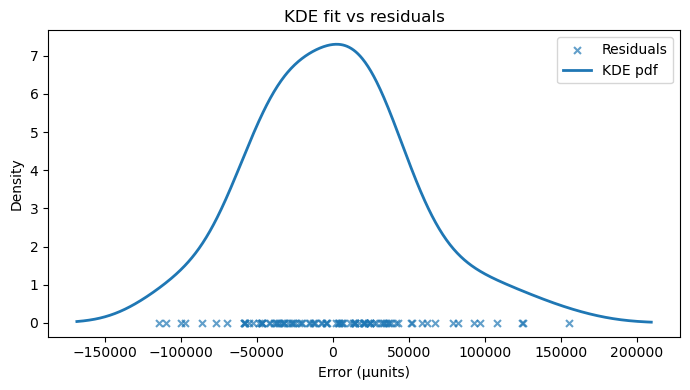

In [368]:
# --- density fit plot (KDE vs data as rug) ---
def plot_kde_fit(error_model, errors, unit_scale=1.0, unit_label=''):
    """
    Overlay KDE pdf (red line) and residuals as x-marks on y=0 (rug).
    If your errors are tiny (e.g., ~1e-4), set unit_scale=1e6 and unit_label='µ'
    to show micro-units on the x-axis.
    """
    e = np.asarray(errors).ravel()
    e_scaled = e * unit_scale

    # x-grid in ORIGINAL units (scaled for nicer ticks)
    lo, hi = e.min(), e.max()
    pad = (hi - lo) * 0.2 if hi > lo else max(1e-8, abs(hi) * 0.2)
    x_grid = np.linspace(lo - pad, hi + pad, 800)
    x_grid_scaled = x_grid * unit_scale

    # Evaluate pdf properly in original units
    if error_model['domain'] == 'standardized':
        z_grid = (x_grid - error_model['mu']) / error_model['sig']
        # f_X(x) = (1/sigma) f_Z((x-mu)/sigma)
        pdf = np.exp(error_model['model'].score_samples(z_grid.reshape(-1, 1))) / error_model['sig']
    else:
        pdf = np.exp(error_model['model'].score_samples(x_grid.reshape(-1, 1)))

    # Plot: rug (x’s) + KDE curve
    plt.figure(figsize=(7, 4))
    plt.scatter(e_scaled, np.zeros_like(e_scaled), marker='x', s=25, alpha=0.7, label='Residuals')
    plt.plot(x_grid_scaled, pdf, lw=2, label='KDE pdf')

    xlabel = "Error" + (f" ({unit_label}units)" if unit_label else "")
    plt.xlabel(xlabel)
    plt.ylabel("Density")
    plt.title("KDE fit vs residuals")
    plt.legend()
    plt.tight_layout()
    plt.show()

# --- Q–Q plot to check distributional fit ---
def plot_kde_qq(error_model, errors, n_draws=5000, seed=0, unit_scale=1.0, unit_label=''):
    """
    Q–Q plot: empirical residual quantiles vs KDE-sampled quantiles.
    Perfect fit lies on the 45° line.
    """
    e = np.asarray(errors).ravel()
    draws = sample_error(error_model, n=n_draws, seed=seed)

    q = np.linspace(0.01, 0.99, 199)
    q_data  = np.quantile(e, q) * unit_scale
    q_model = np.quantile(draws, q) * unit_scale

    lim_lo = min(q_data.min(), q_model.min())
    lim_hi = max(q_data.max(), q_model.max())

    plt.figure(figsize=(5.5, 5))
    plt.scatter(q_data, q_model, s=18, alpha=0.8)
    plt.plot([lim_lo, lim_hi], [lim_lo, lim_hi], lw=2)  # 45° line
    xlabel = "Empirical residual quantiles" + (f" ({unit_label}units)" if unit_label else "")
    ylabel = "KDE-sampled quantiles" + (f" ({unit_label}units)" if unit_label else "")
    plt.xlabel(xlabel); plt.ylabel(ylabel)
    plt.title("Q–Q plot: KDE vs residuals")
    plt.tight_layout()
    plt.show()

# Example usage after fitting:
plot_kde_fit(error_model, errors, unit_scale=1e6, unit_label='µ')

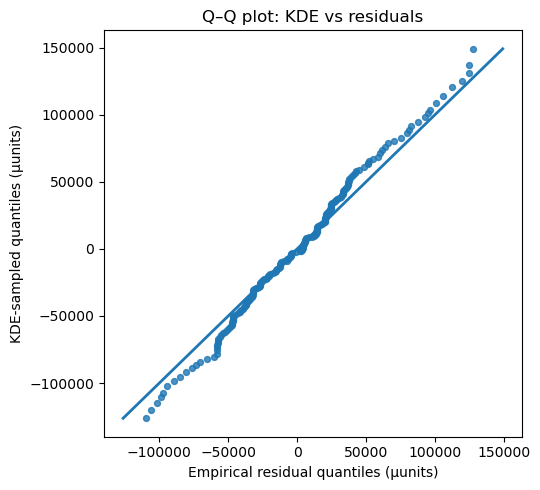

In [370]:
plot_kde_qq(error_model, errors, unit_scale=1e6, unit_label='µ')

In [388]:
use_raw_numbers = False

models = {}
for c in var_order:
    if use_raw_numbers:
        model, coefs_df, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p = fit_elastic_net(shift_raw_traffic, target_col=c, predictor_cols=compress_covariates[c])
    else:
        model, coefs_df, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p = fit_elastic_net(shift_summed_traffic, target_col=c, predictor_cols=compress_covariates[c])
    models[c] = model, coefs, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p
    print(f'{c} has been trained with stats:')
    print(f'            net fit:   R^2={round(R_sqrd,2)}         ||| R^2_MG={round(R2_MG,2)}')
    print(f'            error fit: avg_loglik={round(avg_loglik,2)} ||| ks_p={round(ks_p,2)}')
    
models

print("")

0.4:Adventurecore, Rustic, Safari has been trained with stats:
            net fit:   R^2=1.0         ||| R^2_MG=1.0
            error fit: avg_loglik=7.59 ||| ks_p=0.59
0.1:Preppy, Dandy, Paninaro has been trained with stats:
            net fit:   R^2=0.9         ||| R^2_MG=0.89
            error fit: avg_loglik=2.73 ||| ks_p=0.98
0.5:Thought_Daughter, That_Girl, Clean_Girl has been trained with stats:
            net fit:   R^2=0.49         ||| R^2_MG=0.47
            error fit: avg_loglik=2.55 ||| ks_p=0.14
0.3:Cottagecore, Shabby_Chic, Goblincore has been trained with stats:
            net fit:   R^2=0.57         ||| R^2_MG=0.62
            error fit: avg_loglik=2.11 ||| ks_p=0.6
0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic has been trained with stats:
            net fit:   R^2=0.69         ||| R^2_MG=0.76
            error fit: avg_loglik=2.23 ||| ks_p=0.51
0.2:Romantic_Academia, Dark_Academia, Light_Academia has been trained with stats:
            net fit:   R^2=0.75     

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:678: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 0.000e+00, tolerance: 0.000e+00

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model

2.5:Girly_Kei, Larme_Kei, Jirai_Kei has been trained with stats:
            net fit:   R^2=0.48         ||| R^2_MG=-0.12
            error fit: avg_loglik=1.13 ||| ks_p=0.0
9.0:Burlesque, Fanfare, Clowncore has been trained with stats:
            net fit:   R^2=0.67         ||| R^2_MG=0.38
            error fit: avg_loglik=2.1 ||| ks_p=0.42
9.1:Yanki, Greaser, Sukeban has been trained with stats:
            net fit:   R^2=0.57         ||| R^2_MG=0.47
            error fit: avg_loglik=1.84 ||| ks_p=1.0
9.2:Americana, Diner, American_Thanksgiving has been trained with stats:
            net fit:   R^2=0.82         ||| R^2_MG=0.58
            error fit: avg_loglik=2.13 ||| ks_p=0.31
9.3:Rockabilly, Rock_%27n%27_Roll, Raggare has been trained with stats:
            net fit:   R^2=0.98         ||| R^2_MG=0.97
            error fit: avg_loglik=3.33 ||| ks_p=0.96
4.0:Minimalism, International_Typographic_Style, Flat_Design has been trained with stats:
            net fit:   R^2=0.91      

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:664: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:664: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:664: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent.py:664: ConvergenceWarning:

Objective did not converge. You might want to increase the number of iterations. Duality gap: 0.0, tolerance: 0.0

/opt/anaconda3/lib/python3.12/site-packages/sklearn/linear_model/_coordinate_descent

D 2.5:Girly_Kei, Larme_Kei, Jirai_Kei has been trained with stats:
            net fit:   R^2=0.0         ||| R^2_MG=0.45
            error fit: avg_loglik=1.07 ||| ks_p=0.0
D 9.0:Burlesque, Fanfare, Clowncore has been trained with stats:
            net fit:   R^2=0.37         ||| R^2_MG=0.76
            error fit: avg_loglik=2.06 ||| ks_p=0.87
D 9.1:Yanki, Greaser, Sukeban has been trained with stats:
            net fit:   R^2=0.56         ||| R^2_MG=0.85
            error fit: avg_loglik=1.82 ||| ks_p=0.64
D 9.2:Americana, Diner, American_Thanksgiving has been trained with stats:
            net fit:   R^2=0.27         ||| R^2_MG=0.77
            error fit: avg_loglik=1.8 ||| ks_p=0.72
D 9.3:Rockabilly, Rock_%27n%27_Roll, Raggare has been trained with stats:
            net fit:   R^2=0.16         ||| R^2_MG=0.71
            error fit: avg_loglik=1.63 ||| ks_p=0.35
D 4.0:Minimalism, International_Typographic_Style, Flat_Design has been trained with stats:
            net fit:   R^2

{'0.4:Adventurecore, Rustic, Safari': (Pipeline(steps=[('standardscaler', StandardScaler()),
                  ('elasticnetcv',
                   ElasticNetCV(cv=5, l1_ratio=[0.1, 0.5, 0.9, 1.0],
                                max_iter=10000))]),
                                               predictor  coefficient
  287                                        (intercept)     0.454670
  273                                         month(t-5)     0.014543
  239          7.0:Art_Deco, Taisho_Roman, Ukiyo-e(t-12)     0.012378
  270                         12.0:Flamenco, Tango(t-12)     0.008624
  184  5.3:Industrial, Techwear, Electronic_Body_Musi...     0.006160
  ..                                                 ...          ...
  114                      2.4:Kawaii, Gyaru, Kogal(t-2)    -0.000000
  115                      2.4:Kawaii, Gyaru, Kogal(t-3)    -0.000000
  116                      2.4:Kawaii, Gyaru, Kogal(t-4)    -0.000000
  117                      2.4:Kawaii, Gyaru, Kogal

In [392]:
print("r^2 of different___________________________________________________________________________________________")
for c in var_order:
    if models[c][2] <= models[c][3]:
        print('   ->',round(models[c][2],2), c)
    else:
        print(round(models[c][2],2), c)
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print()
print("r^2_MG of different___________________________________________________________________________________________")
for c in var_order:
    if models[c][3]<=0.5:
        print('   ->',round(models[c][3],2), c)
    else:
        print(round(models[c][3],2), c)

r^2 of different___________________________________________________________________________________________
1.0 0.4:Adventurecore, Rustic, Safari
0.9 0.1:Preppy, Dandy, Paninaro
0.49 0.5:Thought_Daughter, That_Girl, Clean_Girl
   -> 0.57 0.3:Cottagecore, Shabby_Chic, Goblincore
   -> 0.69 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic
0.75 0.2:Romantic_Academia, Dark_Academia, Light_Academia
0.89 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother
1.0 1.0:Normcore, Indie_Sleaze, Surf_Crush
   -> 0.4 1.5:Glitch_Art, Drain, Trillwave
   -> 0.0 1.3:Baddie, Gangsta_Rap, Bimbocore
1.0 1.4:McBling, Y2K, Frutiger_Metro
0.62 1.2:Scene, Emo, 2010s_Internet
0.89 1.1:8-Bit, Pixel_UI, PC-98
0.58 2.1:Dark_Nymphet, Waif, Dollette
0.66 2.3:E-Girl, Babygirl, Lovecore
0.71 2.2:Fairy_Kei, Yume_Kawaii, Decora
0.94 2.0:Animecore, Mall_Ninja, Cutecore
   -> 0.49 2.4:Kawaii, Gyaru, Kogal
0.48 2.5:Girly_Kei, Larme_Kei, Jirai_Kei
0.67 9.0:Burlesque, Fanfare, Clowncore
0.57 9.1:Yanki, Greaser, Sukeban
0.82 9.2

In [532]:
def predict_next_step(test_var,models, shifted_df, predictor_cols, R2_MG_reject = 0, add_noice = False):
    """
    Predict the next value for the target variable using the latest available lags.
    
    Parameters:
    - model: fitted pipeline (StandardScaler + ElasticNetCV)
    - shifted_df: dataframe with lagged variables
    - predictor_cols: list of predictor column names used in training
    
    Returns:
    - float: predicted value for next time step
    """

    # models has form: model, coefs_df, R_sqrd, R2_MG, error_model, avg_loglik, ks_stat, ks_p
    
    model = models[test_var][0]
    R2_MG = models[test_var][3]
    error_model = models[test_var][4]
    ks_p = models[test_var][7]
    predictor_cols = compress_covariates[test_var]
    
    # Get the most recent (last) row with all predictors available
    latest_row = shifted_df[predictor_cols].iloc[-1]

    # Reshape to (1, n_features)
    x_latest = latest_row.values.reshape(1, -1)

    #add noice
    if add_noice:
        if ks_p > 0.05:
            eps = sample_error(error_model, n=1)[0]
        else:
            eps = 0
    else:
        eps = 0

    # Predict
    if R2_MG > R2_MG_reject: 
        prediction = model.predict(x_latest)[0]
    else:
        prediction = shift_summed_traffic[test_var].iloc[-1]
    return prediction + eps

test_var = 'D 0.3:Cottagecore, Shabby_Chic, Goblincore'

next_pred = predict_next_step(test_var, models, shift_summed_traffic, compress_covariates, add_noice = True)
print(f"Predicted next value for {target_col}: {next_pred}. R2_MG = {models[test_var][3]}")

Predicted next value for D 0.3:Cottagecore, Shabby_Chic, Goblincore: -0.011748224551536105. R2_MG = 0.6474587531054116


In [164]:
def append_row_from_dict(df, row_dict):
    """
    Append a new row (given as a dict of {column: value}) to the end of a DataFrame,
    assigning the next monthly timestamp as the index.

    Parameters:
    - df: pd.DataFrame with datetime index
    - row_dict: dict with column names as keys and values to insert

    Returns:
    - df with new row appended
    """
    # Compute next timestamp
    next_date = df.index[-1] + pd.DateOffset(months=1)

    # Build new row as DataFrame
    new_row = pd.DataFrame([row_dict], index=[next_date])

    # Ensure all columns match (fill missing with NaN, drop extra keys)
    new_row = new_row.reindex(columns=df.columns)

    # Append
    return pd.concat([df, new_row])

# predicted_row = {}
# for c in var_order:
#     predicted_row[c] = predict_next_step(models[c][0], prediction_shift_df, compress_covariates[c])

# predicted_row

# append_row_from_dict(prediction_df, predicted_row)

In [616]:
max_time = 15
add_noice = True


prediction_df = shift_summed_traffic[var_order].copy()
prediction_df = prediction_df.iloc[:-1]
# for c in 


prediction_shift_df = generate_lagged_features(prediction_df, var_order, 13)


last_month = int(prediction_df['month'].iloc[-1])

for t in range(max_time):
    prediction_shift_df = generate_lagged_features(prediction_df, var_order, 13)
    predicted_row = {}
    if last_month < 12:
        last_month += 1
    else:
        last_month = 1
    if last_month < 12:
        month_delta = 1
    else:
        month_delta = -11

    
    for c in var_order:
        if c == 'month': 
            predicted_row[c] = last_month
        elif c == 'D month':
            predicted_row[c] = month_delta
        else:  
            predicted_row[c] = predict_next_step(c, models, prediction_shift_df, compress_covariates, R2_MG_reject = 0.8, add_noice = add_noice)
            
    prediction_df = append_row_from_dict(prediction_df, predicted_row)

prediction_df

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,"D 7.2:Socialist_Realism, Politicalwave, Soviet_Nostalgia","D 7.0:Art_Deco, Taisho_Roman, Ukiyo-e","D 7.3:Surrealism, Pop_Art, Modernism","D 7.4:Art_Nouveau, Aestheticism, Newlyn_School","D 8.1:Maximalism, Grocery_Girl_Fall, Dopamine_Dressing","D 8.0:Film_Noir, Spy_Fiction, Femme_Fatale","D 8.2:Asian_Baby_Girl, Chunyu","D 12.0:Flamenco, Tango",D month,D total_wiki_interest
2015-07-01,0.606596,0.553918,0.152502,0.364346,0.265440,0.409167,0.626665,0.587780,0.157364,0.256064,...,-0.007149,-0.021913,0.019294,-0.022691,0.066457,-0.002230,-0.177083,0.035476,1.0,1.574000e+05
2015-08-01,0.593759,0.519751,0.123568,0.355393,0.228721,0.390218,0.854836,0.557707,0.166247,0.305859,...,0.060698,0.000425,0.125827,0.101478,-0.034093,-0.004169,0.041667,0.114691,1.0,6.895080e+05
2015-09-01,0.524876,0.554589,0.326100,0.343013,0.218324,0.399422,0.636227,0.521994,0.182216,0.258477,...,0.059634,0.096955,0.020919,0.055185,0.007768,0.041548,-0.104167,0.084763,1.0,2.632423e+06
2015-10-01,0.490896,0.494973,0.151899,0.363099,0.212279,0.328394,0.635844,0.503122,0.175157,0.246799,...,-0.041809,0.009499,0.013866,0.003101,0.060719,-0.013829,0.031250,-0.058677,1.0,-2.192122e+06
2015-11-01,0.482521,0.461261,0.277878,0.337198,0.237949,0.323623,0.571613,0.412954,0.166159,0.269509,...,-0.046702,-0.064899,-0.093102,-0.095607,-0.177685,-0.001518,0.020833,-0.123270,1.0,-1.145538e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,0.323143,0.322348,0.116996,0.334116,0.134008,0.570838,0.348067,0.281243,0.225826,0.268755,...,-0.043528,-0.082118,-0.124814,0.038328,-0.062305,0.046725,-0.113246,-0.151014,1.0,-1.629416e+04
2025-04-01,0.291285,0.356878,0.132012,0.396509,0.198207,0.595622,0.320097,0.271027,0.248194,0.293845,...,-0.108320,-0.009718,-0.084338,-0.117348,0.004204,-0.019788,0.099767,-0.095268,1.0,1.551385e+05
2025-05-01,0.299191,0.407248,0.079621,0.297396,0.165756,0.565593,0.328396,0.246654,0.218383,0.399044,...,-0.035850,-0.177442,-0.102710,0.011759,-0.066189,-0.021810,-0.269889,-0.133650,1.0,-1.903913e+05
2025-06-01,0.253931,0.384379,0.136053,0.336646,0.133639,0.558844,0.321269,0.250232,0.243081,0.454964,...,-0.078564,-0.083932,-0.085073,0.040316,-0.003618,0.005772,-0.277941,-0.292198,1.0,8.551260e+05


In [603]:
# Ensure prediction_df is sorted by date (just in case)
prediction_df = prediction_df.sort_index()

# Loop over all "D " columns
for d_col in [col for col in prediction_df.columns if col.startswith("D ")]:
    base_col = d_col.replace("D ", "")  # e.g. "0.0:Preppy..."
    p_col = "P " + base_col

    # Initialise P column with zeros
    prediction_df[p_col] = 0.0

    # Set first value from original (non-D) column
    prediction_df.iloc[0, prediction_df.columns.get_loc(p_col)] = prediction_df.iloc[0][base_col]

    # Fill remaining values recursively
    for t in range(1, len(prediction_df)):
        prev_p = prediction_df.iloc[t - 1][p_col]
        prev_d = prediction_df.iloc[t - 1][d_col]
        prediction_df.iloc[t, prediction_df.columns.get_loc(p_col)] = prev_p + prev_d

prediction_df

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,"P 7.2:Socialist_Realism, Politicalwave, Soviet_Nostalgia","P 7.0:Art_Deco, Taisho_Roman, Ukiyo-e","P 7.3:Surrealism, Pop_Art, Modernism","P 7.4:Art_Nouveau, Aestheticism, Newlyn_School","P 8.1:Maximalism, Grocery_Girl_Fall, Dopamine_Dressing","P 8.0:Film_Noir, Spy_Fiction, Femme_Fatale","P 8.2:Asian_Baby_Girl, Chunyu","P 12.0:Flamenco, Tango",P month,P total_wiki_interest
2015-07-01,0.606596,0.553918,0.152502,0.364346,0.265440,0.409167,0.626665,0.587780,0.157364,0.256064,...,0.284257,0.489449,0.389261,0.516814,0.597437,0.225086,0.291667,0.382010,7.0,4.510678e+06
2015-08-01,0.593759,0.519751,0.123568,0.355393,0.228721,0.390218,0.854836,0.557707,0.166247,0.305859,...,0.277108,0.467535,0.408555,0.494123,0.663894,0.222855,0.114583,0.417486,8.0,4.668078e+06
2015-09-01,0.524876,0.554589,0.326100,0.343013,0.218324,0.399422,0.636227,0.521994,0.182216,0.258477,...,0.337806,0.467960,0.534382,0.595601,0.629801,0.218686,0.156250,0.532178,9.0,5.357586e+06
2015-10-01,0.490896,0.494973,0.151899,0.363099,0.212279,0.328394,0.635844,0.503122,0.175157,0.246799,...,0.397440,0.564915,0.555301,0.650786,0.637570,0.260234,0.052083,0.616940,10.0,7.990009e+06
2015-11-01,0.482521,0.461261,0.277878,0.337198,0.237949,0.323623,0.571613,0.412954,0.166159,0.269509,...,0.355631,0.574414,0.569167,0.653887,0.698289,0.246405,0.083333,0.558263,11.0,5.797887e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-03-01,0.290065,0.337887,0.049947,0.339952,0.251369,0.520024,0.227495,0.295452,0.202129,0.337580,...,-0.516518,-0.655631,-0.498664,0.328712,-0.300979,0.215242,-0.044528,-1.028213,3.0,4.098229e+06
2025-04-01,0.288778,0.363091,0.093631,0.299378,0.178135,0.534837,0.224773,0.186488,0.204870,0.398310,...,-0.496889,-0.795827,-0.610505,0.287127,-0.378040,0.231750,0.187042,-1.102885,4.0,4.337870e+06
2025-05-01,0.293973,0.415260,0.054675,0.305455,0.142722,0.591654,0.234412,0.344143,0.222510,0.429931,...,-0.487577,-0.911993,-0.653596,0.289177,-0.469337,0.250126,0.247895,-1.333400,5.0,5.121701e+06
2025-06-01,0.314243,0.369902,0.092803,0.337149,0.110778,0.470724,0.247156,0.199054,0.178710,0.343658,...,-0.465677,-1.070306,-0.774179,0.336590,-0.580031,0.282858,0.099951,-1.412721,6.0,4.777399e+06


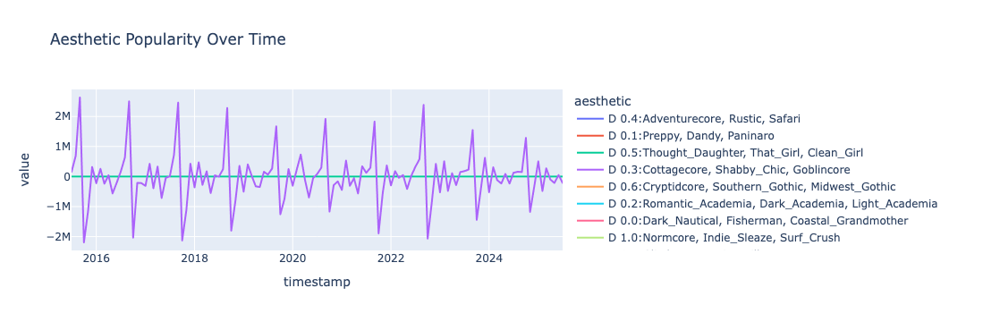

In [570]:
import plotly.express as px

# Select plotting mode
mode = 1  # 0 = all, 1 = D cols, 2 = non-D cols, 3 = P cols

# Choose columns based on mode
if mode == 0:
    cols = prediction_df.columns
elif mode == 1:
    cols = [col for col in prediction_df.columns if col.startswith("D ")]
elif mode == 2:
    cols = [col for col in prediction_df.columns if not col.startswith("D ")]
elif mode == 3:
    cols = [col for col in prediction_df.columns if col.startswith("P ")]

# Reset index and rename the index column to 'timestamp'
df_plot = prediction_df[cols].reset_index()
df_plot = df_plot.rename(columns={df_plot.columns[0]: 'timestamp'})

# Melt the DataFrame to long format
df_long = df_plot.melt(id_vars='timestamp', var_name='aesthetic', value_name='value')

# Plot all aesthetics over time
fig = px.line(df_long, x='timestamp', y='value', color='aesthetic',
              title='Aesthetic Popularity Over Time')

fig.show()

In [572]:
# Set your date range
start_date = "2024-05-01"
end_date = "2025-06-01"

# Slice both dataframes over the specified date range
true_slice = true_summed_traffic.loc[start_date:end_date].copy()
for col in [col for col in true_slice.columns if not col.startswith("D ")]:
    true_slice["P "+col] = true_slice[col]
    
pred_slice = prediction_df.loc[start_date:end_date]

percent_error_table = (true_slice - pred_slice)

percent_error_table

,"0.4:Adventurecore, Rustic, Safari","0.1:Preppy, Dandy, Paninaro","0.5:Thought_Daughter, That_Girl, Clean_Girl","0.3:Cottagecore, Shabby_Chic, Goblincore","0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic","0.2:Romantic_Academia, Dark_Academia, Light_Academia","0.0:Dark_Nautical, Fisherman, Coastal_Grandmother","1.0:Normcore, Indie_Sleaze, Surf_Crush","1.5:Glitch_Art, Drain, Trillwave","1.3:Baddie, Gangsta_Rap, Bimbocore",...,"P 7.2:Socialist_Realism, Politicalwave, Soviet_Nostalgia","P 7.0:Art_Deco, Taisho_Roman, Ukiyo-e","P 7.3:Surrealism, Pop_Art, Modernism","P 7.4:Art_Nouveau, Aestheticism, Newlyn_School","P 8.1:Maximalism, Grocery_Girl_Fall, Dopamine_Dressing","P 8.0:Film_Noir, Spy_Fiction, Femme_Fatale","P 8.2:Asian_Baby_Girl, Chunyu","P 12.0:Flamenco, Tango",P month,P total_wiki_interest
timestamp,,,,,,,,,,,,,,,,,,,,,
2024-05-01,-0.001483,-0.006851,0.000000,0.000000,0.000000,0.000000,0.000000,0.001919,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.110223e-16,0.000000,0.0,0.000000e+00
2024-06-01,-0.028996,-0.019573,0.022001,-0.100589,-0.033185,-0.098242,-0.042777,-0.019816,-0.010616,-0.041742,...,0.000000,0.000000,0.000000,-0.093616,0.000000,0.000000,-2.711889e-01,0.000000,0.0,-5.154038e+05
2024-07-01,-0.055005,0.004251,0.025467,-0.073228,-0.044697,-0.040774,-0.023520,0.020446,-0.005075,-0.040016,...,0.077407,0.206064,0.076632,-0.053723,0.128207,0.010893,-1.382197e-01,0.103446,0.0,-3.347447e+05
2024-08-01,-0.016159,0.010454,0.090567,-0.051758,-0.041909,0.002736,-0.000072,0.149992,-0.016764,-0.081507,...,0.169165,0.224725,0.152843,-0.026402,0.250169,0.007516,2.293504e-03,0.255518,0.0,-2.465073e+05
2024-09-01,-0.023312,0.003575,0.062236,-0.039774,-0.031227,0.018487,-0.026438,0.026746,-0.024258,-0.114580,...,0.254268,0.320716,0.261881,0.017166,0.338034,0.009155,-6.837937e-02,0.485643,0.0,-1.234096e+05
2024-10-01,0.000301,0.035049,0.175859,-0.014296,-0.036157,0.029620,-0.036163,0.022903,0.004297,-0.025843,...,0.373980,0.477964,0.364664,0.051476,0.466402,0.039853,8.751469e-03,0.715984,0.0,1.133164e+06
2024-11-01,-0.043618,0.000950,0.293701,-0.109258,-0.021400,-0.007639,-0.064570,0.004142,-0.012825,-0.049096,...,0.413120,0.547878,0.452650,-0.060710,0.479058,0.043963,-6.385956e-02,0.792827,0.0,-1.469490e+06
2024-12-01,-0.051173,0.013066,0.211121,-0.069973,-0.031285,-0.040234,-0.074857,-0.040019,0.010679,-0.069614,...,0.466733,0.665561,0.487847,-0.087375,0.602167,0.078248,1.762783e-03,0.900017,0.0,7.237305e+04
2025-01-01,0.023927,0.035391,-0.037824,-0.084407,-0.005103,-0.039751,-0.058216,-0.020801,0.068612,-0.045888,...,0.575873,0.829941,0.618414,-0.071549,0.705606,0.065864,2.003048e-01,1.053589,0.0,1.251417e+06


In [600]:
def rowwise_vector_scores(true_slice, pred_slice):
    # Use common columns only
    cols = [c for c in true_slice.columns if c in pred_slice.columns]

    T = true_slice[cols].to_numpy(float)
    F = pred_slice[cols].to_numpy(float)

    normT = np.linalg.norm(T, axis=1)
    normF = np.linalg.norm(F, axis=1)

    # Direction score (cosine similarity)
    dir_score = (np.sum(T * F, axis=1)) / (normT * normF)

    # Magnitude score
    mag_score = 1 - np.abs(normF - normT) / normT

    return pd.DataFrame({
        'dir_score': dir_score,
        'mag_score': mag_score
    }, index=true_slice.index)

# Select plotting mode
mode = 1  # 0 = all, 1 = D cols, 2 = non-D cols, 3 = P cols, 4 = normal

# Choose columns based on mode
if mode == 0:
    cols = percent_error_table.columns
elif mode == 1:
    cols = [col for col in percent_error_table.columns if col.startswith("D ")]
elif mode == 2:
    cols = [col for col in percent_error_table.columns if not col.startswith("D ")]
elif mode == 3:
    cols = [col for col in percent_error_table.columns if col.startswith("P ")]
elif mode == 4:
    cols = [col for col in percent_error_table.columns if (not col.startswith("P ")) and (not col.startswith("D "))]

cols = [c for c in cols if not (( c == 'total_wiki_interest') or (c == 'D total_wiki_interest') or (c == 'P total_wiki_interest') or (c == 'month') or (c == 'D month') or (c == 'P month')) ]
print("collumns: ", cols)
print()
print()
scores = rowwise_vector_scores(true_slice[cols], pred_slice[cols])

print("TEST WHOLE MODEL FIT:")
print("avg dir:", round(scores['dir_score'].mean(),2))
print("avg mag:", round(scores['mag_score'].mean(),2))
print()
scores

collumns:  ['D 0.4:Adventurecore, Rustic, Safari', 'D 0.1:Preppy, Dandy, Paninaro', 'D 0.5:Thought_Daughter, That_Girl, Clean_Girl', 'D 0.3:Cottagecore, Shabby_Chic, Goblincore', 'D 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic', 'D 0.2:Romantic_Academia, Dark_Academia, Light_Academia', 'D 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother', 'D 1.0:Normcore, Indie_Sleaze, Surf_Crush', 'D 1.5:Glitch_Art, Drain, Trillwave', 'D 1.3:Baddie, Gangsta_Rap, Bimbocore', 'D 1.4:McBling, Y2K, Frutiger_Metro', 'D 1.2:Scene, Emo, 2010s_Internet', 'D 1.1:8-Bit, Pixel_UI, PC-98', 'D 2.1:Dark_Nymphet, Waif, Dollette', 'D 2.3:E-Girl, Babygirl, Lovecore', 'D 2.2:Fairy_Kei, Yume_Kawaii, Decora', 'D 2.0:Animecore, Mall_Ninja, Cutecore', 'D 2.4:Kawaii, Gyaru, Kogal', 'D 2.5:Girly_Kei, Larme_Kei, Jirai_Kei', 'D 9.0:Burlesque, Fanfare, Clowncore', 'D 9.1:Yanki, Greaser, Sukeban', 'D 9.2:Americana, Diner, American_Thanksgiving', 'D 9.3:Rockabilly, Rock_%27n%27_Roll, Raggare', 'D 4.0:Minimalism, Internationa

,dir_score,mag_score
timestamp,,
2024-05-01,0.273530,0.762912
2024-06-01,-0.500701,0.995844
2024-07-01,0.289717,0.887018
2024-08-01,-0.486760,0.744354
2024-09-01,-0.008090,0.974893
2024-10-01,0.679815,0.975957
2024-11-01,-0.117157,0.733022
2024-12-01,-0.102793,0.932991
2025-01-01,0.020941,0.795960


In [566]:
for col in percent_error_table.columns:
    RSS = ((true_slice[col].iloc[1:].to_numpy() - pred_slice[col].iloc[1:].to_numpy())**2).sum()
    MGTSS = ((true_slice[col].iloc[1:].to_numpy() - true_slice[col].iloc[:-1].to_numpy()) ** 2).sum()
    r_MG = 1-RSS/MGTSS
    print(round(r_MG,2),col)

-0.28 0.4:Adventurecore, Rustic, Safari
0.15 0.1:Preppy, Dandy, Paninaro
-0.87 0.5:Thought_Daughter, That_Girl, Clean_Girl
0.06 0.3:Cottagecore, Shabby_Chic, Goblincore
-0.03 0.6:Cryptidcore, Southern_Gothic, Midwest_Gothic
-1.15 0.2:Romantic_Academia, Dark_Academia, Light_Academia
-2.65 0.0:Dark_Nautical, Fisherman, Coastal_Grandmother
0.32 1.0:Normcore, Indie_Sleaze, Surf_Crush
-4.88 1.5:Glitch_Art, Drain, Trillwave
0.55 1.3:Baddie, Gangsta_Rap, Bimbocore
-1.05 1.4:McBling, Y2K, Frutiger_Metro
-2.5 1.2:Scene, Emo, 2010s_Internet
-4457.06 1.1:8-Bit, Pixel_UI, PC-98
-0.32 2.1:Dark_Nymphet, Waif, Dollette
-1.51 2.3:E-Girl, Babygirl, Lovecore
-0.38 2.2:Fairy_Kei, Yume_Kawaii, Decora
-2.69 2.0:Animecore, Mall_Ninja, Cutecore
0.28 2.4:Kawaii, Gyaru, Kogal
0.44 2.5:Girly_Kei, Larme_Kei, Jirai_Kei
0.29 9.0:Burlesque, Fanfare, Clowncore
-1.27 9.1:Yanki, Greaser, Sukeban
-2.04 9.2:Americana, Diner, American_Thanksgiving
-2.72 9.3:Rockabilly, Rock_%27n%27_Roll, Raggare
-0.82 4.0:Minimalism, Int

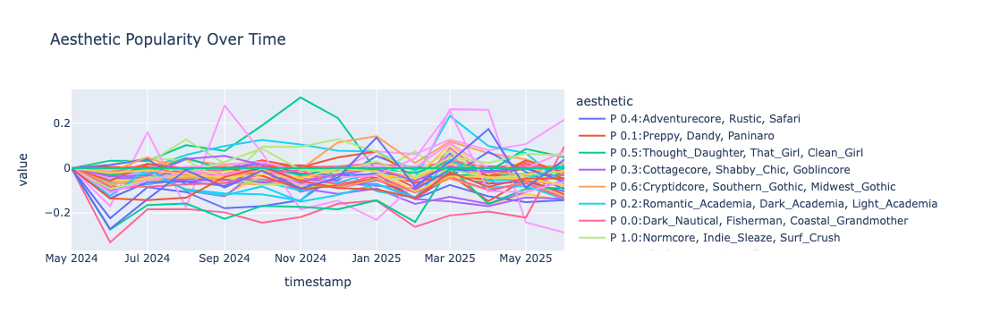

In [184]:
# Select plotting mode
mode = 3  # 0 = all, 1 = D cols, 2 = non-D cols, 3 = P cols, 4 = normal

# Choose columns based on mode
if mode == 0:
    cols = percent_error_table.columns
elif mode == 1:
    cols = [col for col in percent_error_table.columns if col.startswith("D ")]
elif mode == 2:
    cols = [col for col in percent_error_table.columns if not col.startswith("D ")]
elif mode == 3:
    cols = [col for col in percent_error_table.columns if col.startswith("P ")]
elif mode == 4:
    cols = [col for col in percent_error_table.columns if (not col.startswith("P ")) and (not col.startswith("D "))]


# Reset index and rename the index column to 'timestamp'
df_plot = percent_error_table[cols].reset_index()
df_plot = df_plot.rename(columns={df_plot.columns[0]: 'timestamp'})

# Melt the DataFrame to long format
df_long = df_plot.melt(id_vars='timestamp', var_name='aesthetic', value_name='value')

# Plot all aesthetics over time
fig = px.line(df_long, x='timestamp', y='value', color='aesthetic',
              title='Aesthetic Popularity Over Time')

fig.show()

# Maths 

max E[W^T X] - lamda*||W-X||_2 


E[W^T X] = E[tr(W^T X)]

= tr(E[X W^T])

= tr(E[X] E[W]^T + cov[X W^T])

= sum E[X_i] E[W_i]+cov[X_i W_i]

E[W^T X] + lamda*||W-X||_2  = sum_i E[X_i] E[W_i]+cov[X_i W_i] - lambda*(X_i - W_i)^2


E[ ||X-W||_2 ] = E[(X-W)^T(X-W) ] =E[ X^T X - W^T X - X^T W - W^T W ] 

= E[ X^T X + W^T W - 2 W^T X ]
= E[ X^T X + W^T W] - 2 sum E[X_i] E[W_i]+cov[X_i W_i]
= sum X_i ^2 + W_i^2 -2 E[X_i] E[W_i]+cov[X_i W_i]


In [ ]:
# print("r^2 of different")
for c in var_order:
    if models[c][2] < 0.6:
        print('   ->',round(models[c][2],4), c)
    print(round(models[c][2],4), c)